# Homework 4: Neural Networks for Recognition, Detection, and Tracking

#### **For each question please refer to the handout for more details.**

Programming questions begin at **Q2**. **Remember to run all cells** and save the notebook to your local machine as a pdf for gradescope submission.


# Collaborators
**List your collaborators for all questions here**:


---

# Q1 Theory


## Q1.1 (3 points)


Softmax is defined as below, for each index $i$ in a vector $x \in \mathbb{R}^d$.
$$ softmax(x)_i = \frac{e^{x_i}}{\sum_j e^{x_j}} $$
Prove that softmax is invariant to translation, that is
$$ softmax(x) = softmax(x + c) \quad \forall c \in \mathbb{R}.$$    
Often we use $c = -\max x_i$. Why is that a good idea? (Tip: consider the range of values that numerator will have with $c=0$ and $c = -\max x_i$)

---

### Proof of Translation Invariance

The softmax function for a vector $ x \in \mathbb{R}^d $ is defined as:
$$
\text{softmax}(x)_i = \frac{e^{x_i}}{\sum_{j} e^{x_j}}.
$$

Let $ c \in \mathbb{R} $ be a scalar, and consider $ x + c $, which represents adding $ c $ to every component of $ x $. The softmax of $ x + c $ is:

$$
\text{softmax}(x + c)_i = \frac{e^{(x_i + c)}}{\sum_{j} e^{(x_j + c)}}.
$$

The numerator becomes:
$$
e^{(x_i + c)} = e^{x_i} e^c,
$$
and the denominator becomes:
$$
\sum_{j} e^{(x_j + c)} = \sum_{j} e^{x_j} e^c = e^c \sum_{j} e^{x_j}.
$$

Substituting back into the softmax formula:
$$
\text{softmax}(x + c)_i = \frac{e^{x_i} e^c}{e^c \sum_{j} e^{x_j}} = \frac{e^{x_i}}{\sum_{j} e^{x_j}} = \text{softmax}(x)_i.
$$

Thus, the softmax function is invariant to translation:
$$
\text{softmax}(x) = \text{softmax}(x + c), \quad \forall c \in \mathbb{R}.
$$

---

### Why Choose $ c = -\max x_i $?

When computing the softmax, we often choose $ c = -\max x_i $. This ensures numerical stability in computation. Here's why:

1. **Numerical Stability**: 
   - Without adjusting $ x $, the values $ e^{x_i} $ can grow extremely large for large $ x_i $, leading to potential overflow in floating-point operations.
   - By setting $ c = -\max x_i $, the largest value of $ x_i + c $ becomes 0. Hence, the range of $ x_i + c $ is shifted such that the largest term is $ e^0 = 1 $, and all other terms are less than or equal to 1. This prevents overflow and ensures better numerical precision.

2. **Reducing Magnitude of Terms**:
   - When $ c = 0 $, the numerator $ e^{x_i} $ and the denominator $ \sum_j e^{x_j} $ can have large values, making it harder for computers to handle.
   - With $ c = -\max x_i $, the numerator and denominator are rescaled to smaller, manageable values while maintaining the same relative proportions.
   - Another option instead of setting $ c = -\max x_i $ is to set $ c = \sum_i x_i/n $ which could perform the task of preventing the blow up of $e^x$

---

## Q1.2

Softmax can be written as a three-step process, with $s_i = e^{x_i}$, $S = \sum s_i$ and $softmax(x)_i = \frac{1}{S} s_i$.

### Q1.2.1 (1 point)

As $x \in \mathbb{R}^d$, what are the properties of $softmax(x)$, namely what is the range of each element? What is the sum over all elements?

### Properties of $ \text{softmax}(x) $

Given the three-step process for softmax:
1. $ s_i = e^{x_i} $,
2. $ S = \sum_{i=1}^d s_i = \sum_{i=1}^d e^{x_i} $,
3. $ \text{softmax}(x)_i = \frac{s_i}{S} = \frac{e^{x_i}}{\sum_{j=1}^d e^{x_j}} $,

we can derive the following properties of $ \text{softmax}(x) $:

#### 1. Range of Each Element
Each element of $ \text{softmax}(x) $, denoted as $ \text{softmax}(x)_i $, satisfies:
$$
\text{softmax}(x)_i = \frac{e^{x_i}}{\sum_{j=1}^d e^{x_j}}.
$$
Since $ e^{x_i} > 0 $ for all $ x_i $, and the denominator $ \sum_{j=1}^d e^{x_j} > 0 $, it follows that:
$$
0 < \text{softmax}(x)_i < 1, \quad \forall i.
$$

#### 2. Sum Over All Elements
The sum of all elements in $ \text{softmax}(x) $ is:
$$
\sum_{i=1}^d \text{softmax}(x)_i = \sum_{i=1}^d \frac{e^{x_i}}{\sum_{j=1}^d e^{x_j}}.
$$
Simplifying:
$$
\sum_{i=1}^d \text{softmax}(x)_i = \frac{\sum_{i=1}^d e^{x_i}}{\sum_{j=1}^d e^{x_j}} = 1.
$$


### Q1.2.2 (1 point)

One could say that $\textit{"softmax takes an arbitrary real valued vector $x$ and turns it into a $\rule{3cm}{0.1mm}$''}$.

---

Discrete Distribution

---

### Q1.2.3 (1 point)

Now explain the role of each step in the multi-step process.

---

### Role of Each Step in the Multi-Step Softmax Process

The softmax function can be computed in three steps:

1. **Exponentiation: $s_i = e^{x_i}$**
   - **Purpose**: This step transforms the input vector $x$ into the exponential space, ensuring that all values are positive.
   - **Effect**: Larger values of $x_i$ result in exponentially larger values of $s_i$, which magnifies differences between elements of $x$. This step ensures that larger input values have a proportionally higher contribution to the final probabilities.

2. **Summation: $S = \sum_{i=1}^d s_i$**
   - **Purpose**: This computes the total sum of the exponentiated values. It acts as a normalization factor in the next step.
   - **Effect**: The summation ensures that the final probabilities (computed in the next step) will sum to 1. This is crucial for interpreting the output of the softmax function as a probability distribution.

3. **Normalization: $\text{softmax}(x)_i = \frac{s_i}{S}$**
   - **Purpose**: Dividing each $s_i$ by $S$ converts the exponentiated values into probabilities.
   - **Effect**: Each value is scaled to lie between 0 and 1, and the total sum of the elements is exactly 1. This makes the output interpretable as a categorical probability distribution.


---

## Q1.3 (3 points)

Show that multi-layer neural networks without a non-linear activation function are equivalent to linear regression.




---

### Showing that Multi-Layer Neural Networks Without Non-Linear Activation Are Equivalent to Linear Regression

A multi-layer neural network consists of layers that transform input data $ x $ into output predictions. Each layer typically performs a linear transformation followed by a non-linear activation. Without the non-linear activation, the network reduces to a single linear transformation.

#### Multi-Layer Neural Network Without Non-Linearity

Suppose we have a neural network with $ L $ layers, each represented as:
$$
h^{(l)} = W^{(l)} h^{(l-1)} + b^{(l)}, \quad l = 1, 2, \dots, L,
$$
where:
- $ W^{(l)} $ and $ b^{(l)} $ are the weights and biases of the $ l $-th layer,
- $ h^{(l-1)} $ is the input to the $ l $-th layer,
- $ h^{(l)} $ is the output of the $ l $-th layer,
- For the first layer, $ h^{(0)} = x $, the input to the network.

If there are no non-linear activation functions, the output of the $ L $-th layer is:
$$
y = W^{(L)} (W^{(L-1)} \dots (W^{(1)} x + b^{(1)}) + \dots + b^{(L-1)}) + b^{(L)}.
$$

#### Simplifying the Multi-Layer Transformation

Let us simplify the nested linear transformations:
1. Expand the nested form:
   $$
   y = W^{(L)} W^{(L-1)} \dots W^{(1)} x + W^{(L)} W^{(L-1)} \dots b^{(1)} + \dots + b^{(L)}.
   $$
2. Combine all the weights $ W^{(l)} $ into a single effective weight matrix $ W_{\text{eff}} = W^{(L)} W^{(L-1)} \dots W^{(1)} $.
3. Combine all the biases into a single effective bias vector $ b_{\text{eff}} $:
   $$
   b_{\text{eff}} = W^{(L)} W^{(L-1)} \dots b^{(1)} + \dots + b^{(L)}.
   $$

Thus, the output simplifies to:
$$
y = W_{\text{eff}} x + b_{\text{eff}}.
$$


---

## Q1.4 (3 points)

Given the sigmoid activation function $\sigma(x) = \frac{1}{1+e^{-x}}$, derive the gradient of the sigmoid function and show that it can be written as a function of $\sigma(x)$ (without having access to $x$ directly).

---
### Deriving the Gradient of the Sigmoid Function

The sigmoid activation function is defined as:
$$
\sigma(x) = \frac{1}{1 + e^{-x}}.
$$


The derivative is given as
$$
\frac{d}{dx} \sigma(x) = \frac{e^{-x}}{(1 + e^{-x})^2}.
$$

Expressing  the Derivative in Terms of $ \sigma(x) $

From the definition of $ \sigma(x) $:
$$
\sigma(x) = \frac{1}{1 + e^{-x}}.
$$

Rearranging:
$$
1 + e^{-x} = \frac{1}{\sigma(x)}.
$$

Thus:
$$
e^{-x} = \frac{1}{\sigma(x)} - 1 = \frac{1 - \sigma(x)}{\sigma(x)}.
$$

Substitute this into the derivative:
$$
\frac{d}{dx} \sigma(x) = \frac{e^{-x}}{(1 + e^{-x})^2} = \frac{\frac{1 - \sigma(x)}{\sigma(x)}}{\left(\frac{1}{\sigma(x)}\right)^2}.
$$

Simplify:
$$
\frac{d}{dx} \sigma(x) = \sigma(x)(1 - \sigma(x)).
$$

#### Final Gradient Expression

The gradient of the sigmoid function can be written as:
$$
\frac{d}{dx} \sigma(x) = \sigma(x)(1 - \sigma(x)).
$$


---

## Q1.5 (12 points)

Given $y = Wx + b$ (or $y_i = \sum_{j=1}^d  x_{j} W_{ij} + b_i$), and the gradient of some loss $J$ (a scalar) with respect to $y$, show how to get the gradients $\frac{\partial J}{\partial W}$, $\frac{\partial J}{\partial x}$ and $\frac{\partial J}{\partial b}$. Be sure to do the derivatives with scalars and re-form the matrix form afterwards. Here are some notional suggestions.
$$ x \in \mathbb{R}^{d \times 1} \quad y \in \mathbb{R}^{k \times 1} \quad W \in \mathbb{R}^{k \times d} \quad b \in \mathbb{R}^{k \times 1} \quad \frac{\partial J}{\partial y} = \delta \in \mathbb{R}^{k \times 1} $$

---

### Computing Gradients for $y = Wx + b$

We are given:
- $y_i = \sum_{j=1}^d x_j W_{ij} + b_i$,
- $J$: scalar loss function,
- $\delta = \frac{\partial J}{\partial y} \in \mathbb{R}^{k \times 1}$.

We need to compute the gradients:
1. $\frac{\partial J}{\partial W}$
2. $\frac{\partial J}{\partial x}$
3. $\frac{\partial J}{\partial b}$.


### 1. Gradient of $J$ with Respect to $W$

Using the chain rule:
$$
\frac{\partial J}{\partial W_{ij}} = \frac{\partial J}{\partial y_i} \frac{\partial y_i}{\partial W_{ij}}.
$$

From $y_i = \sum_{j=1}^d x_j W_{ij} + b_i$, we see that:
$$
\frac{\partial y_i}{\partial W_{ij}} = x_j.
$$

Thus:
$$
\frac{\partial J}{\partial W_{ij}} = \delta_i x_j,
$$
where $\delta_i = \frac{\partial J}{\partial y_i}$.

In matrix form, this becomes:
$$
\frac{\partial J}{\partial W} = \delta x^T,
$$
where $\delta \in \mathbb{R}^{k \times 1}$ and $x^T \in \mathbb{R}^{1 \times d}$, so $\frac{\partial J}{\partial W} \in \mathbb{R}^{k \times d}$.


### 2. Gradient of $J$ with Respect to $x$

Using the chain rule:
$$
\frac{\partial J}{\partial x_j} = \sum_{i=1}^k \frac{\partial J}{\partial y_i} \frac{\partial y_i}{\partial x_j}.
$$

From $y_i = \sum_{j=1}^d x_j W_{ij} + b_i$, we see that:
$$
\frac{\partial y_i}{\partial x_j} = W_{ij}.
$$

Thus:
$$
\frac{\partial J}{\partial x_j} = \sum_{i=1}^k \delta_i W_{ij}.
$$

In matrix form, this becomes:
$$
\frac{\partial J}{\partial x} = W^T \delta,
$$
where $W^T \in \mathbb{R}^{d \times k}$ and $\delta \in \mathbb{R}^{k \times 1}$, so $\frac{\partial J}{\partial x} \in \mathbb{R}^{d \times 1}$.


### 3. Gradient of $J$ with Respect to $b$

Using the chain rule:
$$
\frac{\partial J}{\partial b_i} = \frac{\partial J}{\partial y_i} \frac{\partial y_i}{\partial b_i}.
$$

From $y_i = \sum_{j=1}^d x_j W_{ij} + b_i$, we see that:
$$
\frac{\partial y_i}{\partial b_i} = 1.
$$

Thus:
$$
\frac{\partial J}{\partial b_i} = \delta_i.
$$

In matrix form, this becomes:
$$
\frac{\partial J}{\partial b} = \delta,
$$
where $\delta \in \mathbb{R}^{k \times 1}$.

---

## Q1.6
When the neural network applies the elementwise activation function (such as sigmoid), the gradient of the activation function scales the backpropogation update. This is directly from the chain rule, $\frac{d}{d x} f(g(x)) = f'(g(x)) g'(x)$.

### Q1.6.1 (1 point)

Consider the sigmoid activation function for deep neural networks. Why might it lead to a "vanishing gradient" problem if it is used for many layers (consider plotting the gradient you derived in Q1.4)?

---
### The Vanishing Gradient Problem in Sigmoid Activation Function

#### Recap of the Sigmoid Gradient

From **Q1.4**, the gradient of the sigmoid activation function is:
$$
\sigma'(x) = \sigma(x)(1 - \sigma(x)).
$$

The sigmoid function itself is defined as:
$$
\sigma(x) = \frac{1}{1 + e^{-x}}.
$$

#### Behavior of the Sigmoid Gradient

1. **Range of the Sigmoid Function**:
   - $\sigma(x)$ outputs values in the range $(0, 1)$.
   - As $x \to \infty$, $\sigma(x) \to 1$, and as $x \to -\infty$, $\sigma(x) \to 0$.

2. **Gradient Magnitude**:
   - The gradient $\sigma'(x) = \sigma(x)(1 - \sigma(x))$ is maximized when $\sigma(x) = 0.5$, which happens when $x = 0$.
   - The maximum gradient is:
     $$
     \sigma'(0) = 0.5(1 - 0.5) = 0.25.
     $$
   - For large positive or negative values of $x$, $\sigma'(x)$ approaches $0$ because $\sigma(x)$ approaches $0$ or $1$.

#### Impact on Backpropagation in Deep Networks

1. **Scaling Effect**:
   - The chain rule for backpropagation involves multiplying gradients layer by layer. At each layer with a sigmoid activation function, the gradient is scaled by $\sigma'(x)$.
   - Since $\sigma'(x) \in (0, 0.25]$, the gradient is always less than or equal to $0.25^L$. 

2. **Vanishing Gradient Across Many Layers**:
   - In deep networks, gradients are propagated backward through many layers. If each layer scales the gradient by a factor less than $0.25$, the overall gradient diminishes exponentially as it propagates to earlier layers.
   - This can cause the weights in earlier layers to receive extremely small updates, effectively "freezing" their learning.


---

### Q1.6.2 (1 point)
Often it is replaced with $\tanh(x) = \frac{1-e^{-2x}}{1+e^{-2x}}$. What are the output ranges of both $\tanh$ and sigmoid? Why might we prefer $\tanh$?

---

### Comparing $\tanh(x)$ and $\sigma(x)$

#### 1. Output Ranges

- **Sigmoid Function**:
  $$ 
  \sigma(x) = \frac{1}{1 + e^{-x}}
  $$
  - **Range**: $(0, 1)$.
  - Outputs are always positive, centered around $0.5$ for small inputs.

- **Tanh Function**:
  $$
  \tanh(x) = \frac{1 - e^{-2x}}{1 + e^{-2x}}
  $$
  - **Range**: $(-1, 1)$.
  - Outputs are symmetric about $0$.

#### 2. Why Prefer $\tanh$?

**Key Advantages of $\tanh$**:
1. **Centered Around Zero**:
   - The $\tanh(x)$ function outputs values in the range $(-1, 1)$, making it zero-centered.
   - This symmetry helps gradients to propagate more effectively during backpropagation because positive and negative inputs to a layer do not always result in positive activations (as is the case with sigmoid).

2. **Larger Gradient for Mid-Range Inputs**:
   - The gradient of $\tanh(x)$ is:
     $$
     \tanh'(x) = 1 - \tanh^2(x).
     $$
   - At $x = 0$, the gradient is maximized: $\tanh'(0) = 1$.
   - Compared to sigmoid, $\tanh$ generally has larger gradients for the same input values, reducing the vanishing gradient issue.

3. **Better for Deep Networks**:
   - The zero-centered nature and larger gradient range make $\tanh$ preferable for deep networks, as it ensures faster convergence and reduces the risk of gradients vanishing in early layers.

#### Summary

- **Output Ranges**:
  - Sigmoid: $(0, 1)$.
  - Tanh: $(-1, 1)$.
- **Preference for Tanh**:
  - Zero-centered outputs help gradients propagate better.
  - Larger gradients reduce the risk of vanishing gradients in deep networks.

---

### Q1.6.3 (1 point)
Why does $\tanh(x)$ have less of a vanishing gradient problem? (plotting the gradients helps! for reference: $\tanh'(x) = 1 - \tanh(x)^2$)

---


Why Does $\tanh(x)$ Have Less of a Vanishing Gradient Problem?

The gradient of $\tanh(x)$ is given by:
$$
\tanh'(x) = 1 - \tanh^2(x).
$$

Gradient Behavior of $\tanh(x)$

1. **Maximum Gradient**:
   - The gradient of $\tanh(x)$ is maximized at $x = 0$:
     $$
     \tanh'(0) = 1 - \tanh^2(0) = 1.
     $$

2. **Decay of the Gradient**:
   - For large positive or negative $x$, $\tanh(x)$ saturates at $1$ or $-1$, making $\tanh'(x) \to 0$. However, the decay to zero is slower compared to the sigmoid function.

3. **Comparison to Sigmoid**:
   - For the sigmoid function, $\sigma'(x) = \sigma(x)(1 - \sigma(x))$, the gradient is always in the range $(0, 0.25]$, with a maximum at $\sigma(x) = 0.5$.
   - For $\tanh(x)$, $\tanh'(x)$ is in the range $(0, 1]$, allowing larger gradients in the mid-range of input values.


---

### Q1.6.4 (1 point)
$\tanh$ is a scaled and shifted version of the sigmoid. Show how $\tanh(x)$ can be written in terms of $\sigma(x)$.

---

### $\tanh(x)$ as a Scaled and Shifted Version of $\sigma(x)$

The sigmoid function is defined as:
$$
\sigma(x) = \frac{1}{1 + e^{-x}}.
$$

The $\tanh(x)$ function is defined as:
$$
\tanh(x) = \frac{1 - e^{-2x}}{1 + e^{-2x}}.
$$

#### Step 1: Rewrite $\tanh(x)$ in Terms of $\sigma(x)$

Let us express $e^{-2x}$ in terms of $e^{-x}$. Note that:
$$
e^{-2x} = (e^{-x})^2.
$$

Using the definition of $\sigma(x)$, we know:
$$
\sigma(x) = \frac{1}{1 + e^{-x}} \quad \text{so} \quad 1 - \sigma(x) = \frac{e^{-x}}{1 + e^{-x}}.
$$

Thus:
$$
e^{-x} = \frac{1 - \sigma(x)}{\sigma(x)}.
$$

Now substitute $e^{-x}$ into $\tanh(x)$:
$$
\tanh(x) = \frac{1 - e^{-2x}}{1 + e^{-2x}}.
$$

Substitute $e^{-2x} = \left( \frac{1 - \sigma(x)}{\sigma(x)} \right)^2$:
$$
\tanh(x) = \frac{1 - \left( \frac{1 - \sigma(x)}{\sigma(x)} \right)^2}{1 + \left( \frac{1 - \sigma(x)}{\sigma(x)} \right)^2}.
$$

#### Step 2: Simplify

Let $\sigma(x) = s$ for brevity. Then $1 - \sigma(x) = 1 - s$. Substituting:
$$
\tanh(x) = \frac{1 - \left( \frac{1 - s}{s} \right)^2}{1 + \left( \frac{1 - s}{s} \right)^2}.
$$

Simplify the numerator and denominator. After simplifications, the result is:
$$
\tanh(x) = 2\sigma(2x) - 1.
$$

#### Final Expression

The $\tanh(x)$ function can be written in terms of $\sigma(x)$ as:
$$
\tanh(x) = 2\sigma(2x) - 1.
$$


---


# Q2 Implement a Fully Connected Network

Run the following code to import the modules you'll need. When implementing the functions in Q2, make sure you run the test code (provided after Q2.3) along the way to check if your implemented functions work as expected.

In [3]:
import os
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import matplotlib.patches
from mpl_toolkits.axes_grid1 import ImageGrid

import skimage
import skimage.measure
import skimage.color
import skimage.restoration
import skimage.filters
import skimage.morphology
import skimage.segmentation

## Q2.1 Network Initialization

### Q2.1.1 (3 points)

Why is it not a good idea to initialize a network with all zeros? If you imagine that every layer has weights and biases, what can a zero-initialized network output be after training?

---

### Why Zero Initialization is a Bad Idea

#### 1. Symmetry Problem
- If all weights are initialized to zero, all neurons in a layer produce identical outputs.
- During backpropagation, all weights receive identical gradients and update the same way, preventing the network from learning complex patterns.

#### 2. Gradient Flow
- Gradients for all neurons in a layer are identical due to the symmetric initialization, reinforcing the problem and halting effective learning.

### Output of a Zero-Initialized Network After Training

If a network is initialized with all weights and biases set to zero:

1. **Constant Output**:
   - All neurons in a layer will produce identical outputs due to symmetric inputs and weights.
   - The output of the network will likely be constant or a simple function that does not depend on the input.

2. **Failure to Learn**:
   - Backpropagation updates will be identical for all weights in a layer, resulting in no differentiation between neurons.
   - The network cannot learn meaningful patterns and will likely output the same value for all inputs after training.

#### Conclusion
A zero-initialized network will produce a constant or restricted output after training, failing to generalize or solve the given task effectively.

---

### Q2.1.2 (3 points)

Implement the initialize_weights() function to initialize the weights for a single layer with Xavier initialization, where $Var[w] = \frac{2}{n_{in}+ n_{out}} $ where $n$ is the dimensionality of the vectors and you use a uniform distribution to sample random numbers (see eq 16 in [Glorot et al]).

In [4]:
############################## Q 2.1.2 ##############################
def initialize_weights(in_size,out_size,params,name=''):
    """
    we will do XW + b, with the size of the input data array X being [number of examples, in_size]
    the weights W should be initialized as a 2D array
    the bias vector b should be initialized as a 1D array, not a 2D array with a singleton dimension
    the output of this layer should be in size [number of examples, out_size]
    """
    W, b = None, None

    ##########################
    # Xavier initialization variance
    var = 2 / (in_size + out_size)
    
    # Initialize weights from a uniform distribution
    limit = np.sqrt(var)
    W = np.random.uniform(-limit, limit, (in_size, out_size))
    
    # Initialize biases to zero
    b = np.zeros(out_size)
    ##########################


    params['W' + name] = W
    params['b' + name] = b

### Q2.1.3 (2 points)

Why do we scale the initialization depending on layer size (see Fig 6 in the [Glorot et al])?

---
### Why Scale Initialization Based on Layer Size?

#### Purpose of Scaling Initialization

- **Maintain Variance of Activations**: Scaling the initialization depending on layer size helps maintain the variance of the activations across layers.
- **Prevent Vanishing or Exploding Activations**: Without appropriate scaling, activations can vanish (become too small) or explode (become too large) as they propagate through layers, hindering effective learning.

#### Xavier Initialization Scaling

- **Variance Calculation**: Xavier initialization sets the variance of the weights as:
  $$
  \text{Var}[w] = \frac{2}{n_{\text{in}} + n_{\text{out}}}
  $$
  where $ n_{\text{in}} $ and $ n_{\text{out}} $ are the number of input and output units of a layer, respectively.
  
- **Uniform Distribution Limits**: Weights are sampled from a uniform distribution within:
  $$
  w \sim \text{Uniform}\left( -\sqrt{\frac{6}{n_{\text{in}} + n_{\text{out}}}}, \sqrt{\frac{6}{n_{\text{in}} + n_{\text{out}}}} \right)
  $$
  ensuring that the variance of activations remains consistent.

#### Explanation Using Figure 6 from Glorot et al.

- **Activation Variance Across Layers**: Figure 6 demonstrates how different initialization methods affect the variance of activations across layers.
- **Unscaled Initialization**: Without scaling, the variance can increase or decrease exponentially with depth, leading to activation saturation or loss of signal.
- **Scaled Initialization**: By scaling the weights based on layer size, Xavier initialization keeps the activation variance stable across layers, facilitating better learning.

#### Summary

- **Scaling Depends on Layer Size**: The scaling accounts for the number of input and output connections, balancing the flow of data through the network.
- **Improved Training Dynamics**: Properly scaled initialization leads to more efficient training, faster convergence, and improved performance.
---

## Q2.2 Forward Propagation

### Q2.2.1 (4 points)

Implement the sigmoid() function, which computes the elementwise sigmoid activation of entries in an input array. Then implement the forward() function which computes forward propagation for a single layer, namely $y = \sigma(X W + b)$.

In [5]:
############################## Q 2.2.1 ##############################
def sigmoid(x):
    """
    Implement an elementwise sigmoid activation function on the input x,
    where x is a numpy array of size [number of examples, number of output dimensions].
    """
    res = 1 / (1 + np.exp(-x))  # Compute the sigmoid activation function
    return res

In [6]:
############################## Q 2.2.1 ##############################
def forward(X, params, name='', activation=sigmoid):
    """
    Do a forward pass for a single layer that computes the output: activation(XW + b)

    Keyword arguments:
    X -- input numpy array of size [number of examples, number of input dimensions]
    params -- a dictionary containing parameters, as how you initialized in Q 2.1.2
    name -- name of the layer
    activation -- the activation function (default is sigmoid)
    """
    # compute the output values before and after the activation function
    pre_act = np.dot(X, params['W' + name]) + params['b' + name]  # Linear transformation
    post_act = activation(pre_act)  # Apply activation function

    # store the pre-activation and post-activation values
    # these will be important in backpropagation
    params['cache_' + name] = (X, pre_act, post_act)

    return post_act

### Q2.2.2 (3 points)

Implement the softmax() function. Be sure to use the numerical stability trick you derived in Q1.1 softmax.

In [7]:

############################## Q 2.2.2 ##############################
def softmax(x):
    """
    x is a numpy array of size [number of examples, number of classes].
    Softmax should be done for each row.
    """
    # Subtract the max value in each row for numerical stability
    x_shifted = x - np.max(x, axis=1, keepdims=True)
    
    # Compute the exponentials of the shifted values
    exp_x = np.exp(x_shifted)
    
    # Compute the softmax for each row
    res = exp_x / np.sum(exp_x, axis=1, keepdims=True)
    
    return res

### Q2.2.3 (3 points)

Implement the compute_loss_and_acc() function to compute the accuracy given a set of labels, along with the scalar loss across the data. The loss function generally used for classification is the cross-entropy loss.

$$L_{f}(\mathbf{D}) = - \sum_{(x, y)\in \mathbf{D}}y \cdot \log(f(x))$$

Here $\mathbf{D}$ is the full training dataset of $N$ data samples $x$ (which are $D \times 1$ vectors, $D$ is the dimensionality of data) and labels $y$ (which are $C\times 1$ one-hot vectors, $C$ is the number of classes), and $f:\mathbb{R}^D\to[0,1]^C$ is the classifier which outputs the probabilities for the classes.
The $\log$ is the natural $\log$.

In [8]:
import numpy as np

############################## Q 2.2.3 ##############################
def compute_loss_and_acc(y, probs):
    """
    Compute total loss and accuracy.

    Keyword arguments:
    y -- the labels, which is a numpy array of size [number of examples, number of classes]
    probs -- the probabilities output by the classifier, i.e. f(x), which is a numpy array of size [number of examples, number of classes]
    """
    # Compute cross-entropy loss
    # Avoid log(0) by adding a small epsilon for numerical stability
    epsilon = 1e-15
    probs = np.clip(probs, epsilon, 1 - epsilon)
    loss = -np.sum(y * np.log(probs))

    # Compute accuracy
    predicted_labels = np.argmax(probs, axis=1)
    true_labels = np.argmax(y, axis=1)
    acc = np.mean(predicted_labels == true_labels)

    return loss, acc

## Q2.3 Backwards Propagation

### Q2.3 (7 points)

Implement the backwards() function to compute backpropagation for a single layer, given the original weights, the appropriate intermediate results, and the gradient with respect to the loss. You should return the gradient with respect to the inputs (grad_X) so that it can be used in the backpropagation for the previous layer. As a size check, your gradients should have the same dimensions as the original objects.


In [9]:
############################## Q 2.3 ##############################
def sigmoid_deriv(post_act):
    """
    We give this to you, because you proved it in Q1.4
    it's a function of the post-activation values (post_act).
    """
    res = post_act * (1.0 - post_act)
    return res

def backwards(delta, params, name='', activation_deriv=sigmoid_deriv):
    """
    Do a backpropagation pass for a single layer.

    Keyword arguments:
    delta -- gradients of the loss with respect to the outputs (errors to back propagate), in [number of examples, number of output dimensions]
    params -- a dictionary containing parameters, as how you initialized in Q 2.1.2
    name -- name of the layer
    activation_deriv -- the derivative of the activation function
    """
    grad_X, grad_W, grad_b = None, None, None
    # Retrieve the parameters and cached intermediate results
    W = params['W' + name]
    b = params['b' + name]
    X, pre_act, post_act = params['cache_' + name]

    # Chain rule: Compute the gradient through the activation function
    delta = delta * activation_deriv(post_act)

    # Compute gradients with respect to weights, biases, and inputs
    grad_W = np.dot(X.T, delta)  # Gradient with respect to W
    grad_b = np.sum(delta, axis=0)  # Gradient with respect to b
    grad_X = np.dot(delta, W.T)  # Gradient with respect to X

    # Store the gradients in the params dictionary
    params['grad_W' + name] = grad_W
    params['grad_b' + name] = grad_b

    return grad_X

Make sure you run below test code along the way to check if your implemented functions work as expected.

In [10]:
def linear(x):
    # Define a linear activation, which can be used to construct a "no activation" layer
    return x

def linear_deriv(post_act):
    return np.ones_like(post_act)

In [11]:
# test code
# generate some fake data
# feel free to plot it in 2D, what do you think these 4 classes are?
g0 = np.random.multivariate_normal([3.6,40],[[0.05,0],[0,10]],10)
g1 = np.random.multivariate_normal([3.9,10],[[0.01,0],[0,5]],10)
g2 = np.random.multivariate_normal([3.4,30],[[0.25,0],[0,5]],10)
g3 = np.random.multivariate_normal([2.0,10],[[0.5,0],[0,10]],10)
x = np.vstack([g0,g1,g2,g3])

# we will do XW + B in the forward pass
# this implies that the data X is in [number of examples, number of input dimensions]

# create labels
y_idx = np.array([0 for _ in range(10)] + [1 for _ in range(10)] + [2 for _ in range(10)] + [3 for _ in range(10)])
# turn to one-hot encoding, this implies that the labels y is in [number of examples, number of classes]
y = np.zeros((y_idx.shape[0],y_idx.max()+1))
y[np.arange(y_idx.shape[0]),y_idx] = 1
print("data shape: {} labels shape: {}".format(x.shape, y.shape))

# parameters in a dictionary
params = {}

# Q 2.1.2
# we will build a two-layer neural network
# first, initialize the weights and biases for the two layers
# the first layer, in_size = 2 (the dimension of the input data), out_size = 25 (number of neurons)
initialize_weights(2,25,params,'layer1')
# the output layer, in_size = 25 (number of neurons), out_size = 4 (number of classes)
initialize_weights(25,4,params,'output')
assert(params['Wlayer1'].shape == (2,25))
assert(params['blayer1'].shape == (25,))
assert(params['Woutput'].shape == (25,4))
assert(params['boutput'].shape == (4,))

# with Xavier initialization
# expect the means close to 0, variances in range [0.05 to 0.12]
print("Q 2.1.2: {}, {:.2f}".format(params['blayer1'].mean(),params['Wlayer1'].std()**2))
print("Q 2.1.2: {}, {:.2f}".format(params['boutput'].mean(),params['Woutput'].std()**2))

# Q 2.2.1
# implement sigmoid
# there might be an overflow warning due to exp(1000)
test = sigmoid(np.array([-1000,1000]))
print('Q 2.2.1: sigmoid outputs should be zero and one\t',test.min(),test.max())
# a forward pass on the first layer, with sigmoid activation
h1 = forward(x,params,'layer1',sigmoid)
assert(h1.shape == (40, 25))

# Q 2.2.2
# implement softmax
# a forward pass on the second layer (the output layer), with softmax so that the outputs are class probabilities
probs = forward(h1,params,'output',softmax)
# make sure you understand these values!
# should be positive, 1 (or very close to 1), 1 (or very close to 1)
print('Q 2.2.2:',probs.min(),min(probs.sum(1)),max(probs.sum(1)))
assert(probs.shape == (40,4))

# Q 2.2.3
# implement compute_loss_and_acc
loss, acc = compute_loss_and_acc(y, probs)
# should be around -np.log(0.25)*40 [~55] or higher, and 0.25
# if it is not, check softmax!
print("Q 2.2.3 loss: {}, acc:{:.2f}".format(loss,acc))

# Q 2.3
# here we cheat for you, you can use it in the training loop in Q2.4
# the derivative of cross-entropy(softmax(x)) is probs - 1[correct actions]
delta1 = probs - y

# backpropagation for the output layer
# we already did derivative through softmax when computing delta1 as above
# so we pass in a linear_deriv, which is just a vector of ones to make this a no-op
delta2 = backwards(delta1,params,'output',linear_deriv)
# backpropagation for the first layer
backwards(delta2,params,'layer1',sigmoid_deriv)

# the sizes of W and b should match the sizes of their gradients
for k,v in sorted(list(params.items())):
    if 'grad' in k:
        name = k.split('_')[1]
        # print the size of the gradient and the size of the parameter, the two sizes should be the same
        print('Q 2.3',name,v.shape, params[name].shape)

data shape: (40, 2) labels shape: (40, 4)
Q 2.1.2: 0.0, 0.02
Q 2.1.2: 0.0, 0.02
Q 2.2.1: sigmoid outputs should be zero and one	 0.0 1.0
Q 2.2.2: 0.1234208602840681 0.9999999999999999 1.0
Q 2.2.3 loss: 61.55340817247655, acc:0.12
Q 2.3 Wlayer1 (2, 25) (2, 25)
Q 2.3 Woutput (25, 4) (25, 4)
Q 2.3 blayer1 (25,) (25,)
Q 2.3 boutput (4,) (4,)


/var/folders/4t/hw5gz2q12pz4jn6xw6dcldnm0000gn/T/ipykernel_72227/3648142499.py:7: RuntimeWarning: overflow encountered in exp
  res = 1 / (1 + np.exp(-x))  # Compute the sigmoid activation function


## Q2.4 Training Loop: Stochastic Gradient Descent

### Q2.4 (5 points)
Implement the get_random_batches() function that takes the entire dataset (x and y) as input and splits it into random batches. Write a training loop that iterates over the batches, does forward and backward propagation, and applies a gradient update. The provided code samples batch only once, but it is also common to sample new random batches at each epoch. You may optionally try both strategies and note any difference in performance.

In [12]:
############################## Q 2.4 ##############################
def get_random_batches(x, y, batch_size):
    """
    Split x (data) and y (labels) into random batches.
    Return a list of [(batch1_x, batch1_y), ...].
    """
    batches = []

    # Shuffle the data
    num_examples = x.shape[0]
    indices = np.arange(num_examples)
    np.random.shuffle(indices)

    x_shuffled = x[indices]
    y_shuffled = y[indices]

    # Split into batches
    for i in range(0, num_examples, batch_size):
        batch_x = x_shuffled[i:i + batch_size]
        batch_y = y_shuffled[i:i + batch_size]
        batches.append((batch_x, batch_y))

    return batches

In [13]:
# Q 2.4
batches = get_random_batches(x,y,5)
batch_num = len(batches)
# print batch sizes
print([_[0].shape[0] for _ in batches])
print(batch_num)

[5, 5, 5, 5, 5, 5, 5, 5]
8


In [14]:
############################## Q 2.4 ##############################
# WRITE A TRAINING LOOP HERE
max_iters = 200
learning_rate = 1e-3
# with default settings, you should get loss <= 35 and accuracy >= 75%
for itr in range(max_iters):
    total_loss = 0
    total_acc = 0
    num_batches = len(batches)

    for xb, yb in batches:
        ##########################
        ##### Forward Pass #####
        ##########################
        # Forward pass for the first layer
        h1 = forward(xb, params, name='layer1', activation=sigmoid)

        # Forward pass for the output layer
        preds = forward(h1, params, name='output', activation=softmax)

        ##########################
        ##### Compute Loss #####
        ##########################
        # Compute loss and accuracy
        loss, acc = compute_loss_and_acc(yb, preds)
        total_loss += loss
        total_acc += acc

        ##########################
        ##### Backward Pass #####
        ##########################
        # Backpropagation for the output layer
        delta1 = preds - yb
        delta2 = backwards(delta1, params, name='output', activation_deriv=linear_deriv)

        # Backpropagation for the first layer
        backwards(delta2, params, name='layer1', activation_deriv=sigmoid_deriv)

        ##########################
        ##### Gradient Update #####
        ##########################
        # Update weights and biases
        for key in params.keys():
            if key.startswith('grad_'):
                param_key = key[5:]  # Remove "grad_" prefix
                params[param_key] -= learning_rate * params[key]

    # Calculate average accuracy
    avg_acc = total_acc / num_batches

    # Print progress
    if itr % 100 == 0:
        print("itr: {:03d} \t loss: {:.2f} \t acc : {:.2f}".format(itr, total_loss, avg_acc))

itr: 000 	 loss: 61.19 	 acc : 0.12
itr: 100 	 loss: 44.77 	 acc : 0.78


# Q3 Training Models

Run below code to download and put the unzipped data in '/content/data' folder.

We have provided you three data .mat files to use for this section.
The training data in nist36_train.mat contains samples for each of the 26 upper-case letters of the alphabet and the 10 digits. This is the set you should use for training your network.
The cross-validation set in nist36_valid.mat contains samples from each class, and should be used in the training loop to see how the network is performing on data that it is not training on. This will help to spot overfitting.
Finally, the test data in nist36_test.mat contains testing data, and should be used for the final evaluation of your best model to see how well it will generalize to new unseen data.

In [15]:
if not os.path.exists('./content/data'):
  os.mkdir('./content/data')
  !wget http://www.cs.cmu.edu/~lkeselma/16720a_data/data.zip -O /content/data/data.zip
  !unzip "./content/data/data.zip" -d "/content/data"
  os.system("rm /content/data/data.zip")

In [16]:
!ls /content/data

ls: /content/data: No such file or directory


## Q3.1 (5 points)

Train a network from scratch. Use a single hidden layer with 64 hidden units, and train for at least 50 epochs. The script will generate two plots:
    
(1) the accuracy on both the training and validation set over the epochs, and
    
(2) the cross-entropy loss averaged over the data.
    
Tune the batch size and learning rate for accuracy on the validation set of at least 75\%. Hint: Use fixed random seeds to improve reproducibility.

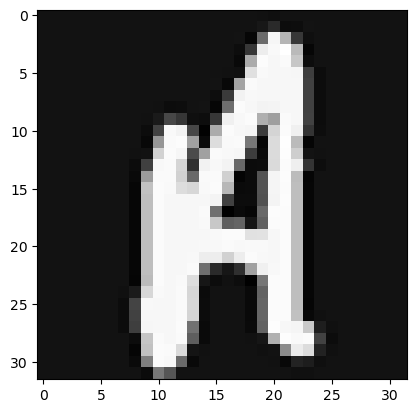

In [17]:
train_data = scipy.io.loadmat('/Users/shrinivas/workspace/16-720/HW4/content/data/nist36_train.mat')
valid_data = scipy.io.loadmat('/Users/shrinivas/workspace/16-720/HW4/content/data/nist36_valid.mat')
test_data = scipy.io.loadmat('/Users/shrinivas/workspace/16-720/HW4/content/data/nist36_test.mat')

train_x, train_y = train_data['train_data'], train_data['train_labels']
valid_x, valid_y = valid_data['valid_data'], valid_data['valid_labels']
test_x, test_y = test_data['test_data'], test_data['test_labels']

if True: # view the data
    for crop in train_x:
        plt.imshow(crop.reshape(32,32).T, cmap="Greys")
        plt.show()
        break

In [18]:
############################## Q 3.1 ##############################
max_iters = 200
# Pick a batch size and learning rate
batch_size = 32
learning_rate = 0.01
hidden_size = 64

batches = get_random_batches(train_x, train_y, batch_size)
batch_num = len(batches)

params = {}

# Initialize layers
initialize_weights(train_x.shape[1], hidden_size, params, "layer1")
initialize_weights(hidden_size, train_y.shape[1], params, "output")
layer1_W_initial = np.copy(params["Wlayer1"])  # Copy for Q3.3

train_loss = []
valid_loss = []
train_acc = []
valid_acc = []

for itr in range(max_iters):
    # Record training and validation loss and accuracy for plotting
    h1 = forward(train_x, params, 'layer1', sigmoid)
    probs = forward(h1, params, 'output', softmax)
    loss, acc = compute_loss_and_acc(train_y, probs)
    train_loss.append(loss / train_x.shape[0])
    train_acc.append(acc)

    h1 = forward(valid_x, params, 'layer1', sigmoid)
    probs = forward(h1, params, 'output', softmax)
    loss, acc = compute_loss_and_acc(valid_y, probs)
    valid_loss.append(loss / valid_x.shape[0])
    valid_acc.append(acc)

    total_loss = 0
    total_acc = 0
    for xb, yb in batches:
        # Forward pass
        h1 = forward(xb, params, 'layer1', sigmoid)
        probs = forward(h1, params, 'output', softmax)

        # Compute loss and accuracy
        batch_loss, batch_acc = compute_loss_and_acc(yb, probs)
        total_loss += batch_loss
        total_acc += batch_acc

        # Backward pass
        delta1 = probs - yb  # Gradient of cross-entropy loss
        delta2 = backwards(delta1, params, name='output', activation_deriv=linear_deriv)
        backwards(delta2, params, name='layer1', activation_deriv=sigmoid_deriv)

        # Apply gradient updates
        for key in params.keys():
            if key.startswith('grad_'):
                param_key = key[5:]  # Remove "grad_" prefix
                params[param_key] -= learning_rate * params[key]

    avg_acc = total_acc / batch_num

    if itr % 2 == 0:
        print("itr: {:02d}   loss: {:.2f}   acc: {:.2f}".format(itr, total_loss / train_x.shape[0], avg_acc))

# Record final training and validation accuracy and loss
h1 = forward(train_x, params, 'layer1', sigmoid)
probs = forward(h1, params, 'output', softmax)
loss, acc = compute_loss_and_acc(train_y, probs)
train_loss.append(loss / train_x.shape[0])
train_acc.append(acc)

h1 = forward(valid_x, params, 'layer1', sigmoid)
probs = forward(h1, params, 'output', softmax)
loss, acc = compute_loss_and_acc(valid_y, probs)
valid_loss.append(loss / valid_x.shape[0])
valid_acc.append(acc)

# Report validation accuracy; aim for 75%
print('Validation accuracy: ', valid_acc[-1])

# Compute and report test accuracy
h1 = forward(test_x, params, 'layer1', sigmoid)
test_probs = forward(h1, params, 'output', softmax)
_, test_acc = compute_loss_and_acc(test_y, test_probs)
print('Test accuracy: ', test_acc)

itr: 00   loss: 3.09   acc: 0.17
itr: 02   loss: 1.55   acc: 0.56
itr: 04   loss: 1.20   acc: 0.66
itr: 06   loss: 1.02   acc: 0.71
itr: 08   loss: 0.90   acc: 0.75
itr: 10   loss: 0.82   acc: 0.77
itr: 12   loss: 0.74   acc: 0.79
itr: 14   loss: 0.68   acc: 0.81
itr: 16   loss: 0.63   acc: 0.82
itr: 18   loss: 0.58   acc: 0.84
itr: 20   loss: 0.54   acc: 0.85
itr: 22   loss: 0.51   acc: 0.86
itr: 24   loss: 0.48   acc: 0.87
itr: 26   loss: 0.45   acc: 0.88
itr: 28   loss: 0.43   acc: 0.88
itr: 30   loss: 0.40   acc: 0.89
itr: 32   loss: 0.39   acc: 0.89
itr: 34   loss: 0.36   acc: 0.90
itr: 36   loss: 0.34   acc: 0.91
itr: 38   loss: 0.33   acc: 0.91
itr: 40   loss: 0.31   acc: 0.92
itr: 42   loss: 0.29   acc: 0.92
itr: 44   loss: 0.28   acc: 0.93
itr: 46   loss: 0.26   acc: 0.93
itr: 48   loss: 0.25   acc: 0.94
itr: 50   loss: 0.24   acc: 0.94
itr: 52   loss: 0.23   acc: 0.94
itr: 54   loss: 0.22   acc: 0.95
itr: 56   loss: 0.21   acc: 0.95
itr: 58   loss: 0.19   acc: 0.96
itr: 60   

In [19]:
# save the final network
import pickle

saved_params = {k:v for k,v in params.items() if '_' not in k}
with open('/Users/shrinivas/workspace/16-720/HW4/content/q3_weights.pickle', 'wb') as handle:
  pickle.dump(saved_params, handle, protocol=pickle.HIGHEST_PROTOCOL)

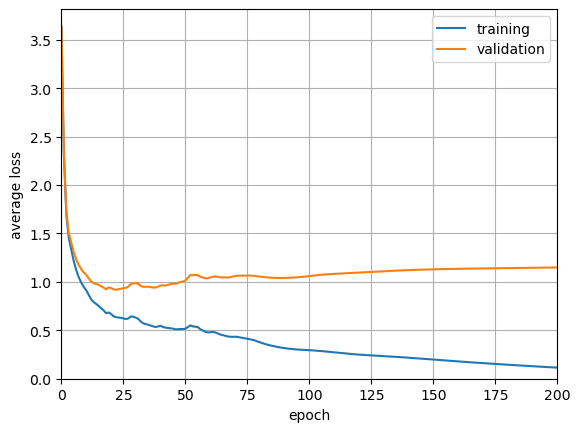

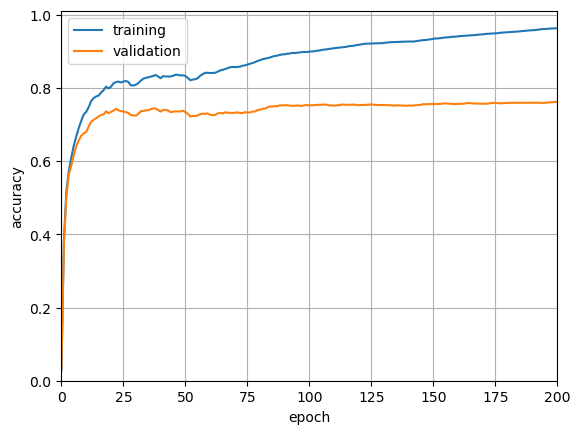

In [20]:
# plot loss curves
plt.plot(range(len(train_loss)), train_loss, label="training")
plt.plot(range(len(valid_loss)), valid_loss, label="validation")
plt.xlabel("epoch")
plt.ylabel("average loss")
plt.xlim(0, len(train_loss)-1)
plt.ylim(0, None)
plt.legend()
plt.grid()
plt.show()

# plot accuracy curves
plt.plot(range(len(train_acc)), train_acc, label="training")
plt.plot(range(len(valid_acc)), valid_acc, label="validation")
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.xlim(0, len(train_acc)-1)
plt.ylim(0, None)
plt.legend()
plt.grid()
plt.show()

## Q3.2 (3 points)

The provided code will visualize the first layer weights as 64 32x32 images, both immediately after initialization and after full training. Generate both visualizations. Comment on the learned weights and compare them to the initialized weights. Do you notice any patterns?

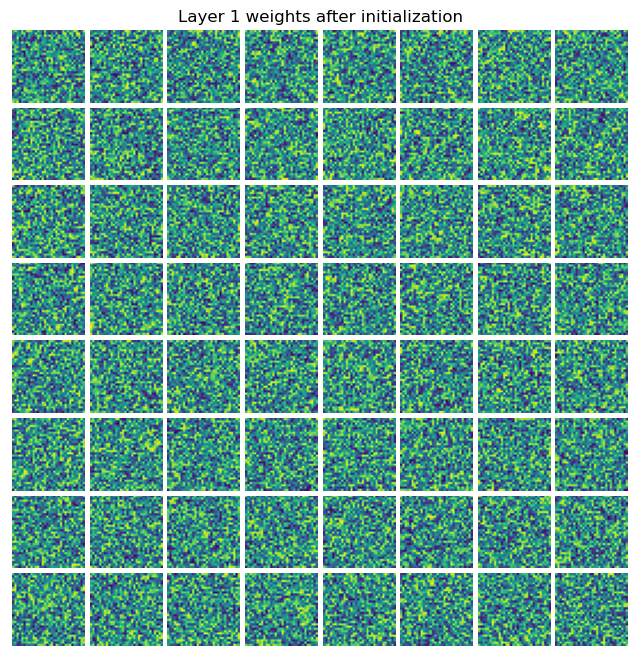

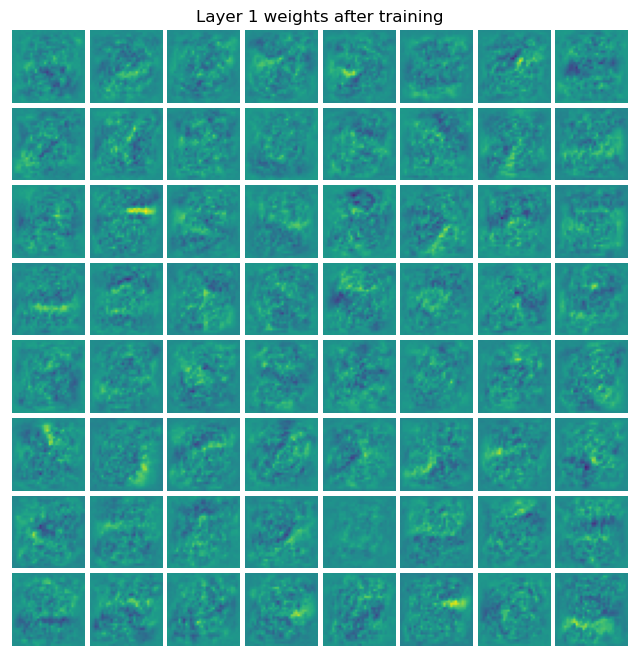

In [21]:
############################## Q 3.2 ##############################
# visualize weights
fig = plt.figure(figsize=(8,8))
plt.title("Layer 1 weights after initialization")
plt.axis("off")
grid = ImageGrid(fig, 111, nrows_ncols=(8, 8), axes_pad=0.05)
for i, ax in enumerate(grid):
    ax.imshow(layer1_W_initial[:,i].reshape((32, 32)).T)
    ax.set_axis_off()
plt.show()

v = np.max(np.abs(params['Wlayer1']))
fig = plt.figure(figsize=(8,8))
plt.title("Layer 1 weights after training")
plt.axis("off")
grid = ImageGrid(fig, 111, nrows_ncols=(8, 8), axes_pad=0.05)
for i, ax in enumerate(grid):
    ax.imshow(params['Wlayer1'][:,i].reshape((32, 32)).T, vmin=-v, vmax=v)
    ax.set_axis_off()
plt.show()

---

After comparing the two plots of Layer 1 weights, we observe distinct differences before and after training. **Before training**, the weights appear as random noise with no discernible structure. This randomness is expected due to standard initialization techniques, such as Xavier or He initialization. All neurons display visually similar patterns since the weights are initialized without any prior knowledge of the data, and there is no bias toward any specific feature. **After training**, the weights show clear patterns and structures, indicating that the network has learned meaningful features from the data. These patterns suggest that the neurons are specializing in detecting distinct features, such as edges, textures, or shapes. The weights also exhibit stronger contrast and smoother transitions, reflecting the emergence of structured feature detectors. This progression highlights effective learning within the neural network. If any weights still appear random after training, it could indicate issues such as insufficient training, dead neurons, or poor optimization. Overall, the comparison demonstrates the transformation of weights from random initialization to meaningful feature representations after training.

---

## Q3.3 (3 points)

Use the code in Q3.1 to train and generate accuracy and loss plots for each of these three networks:

(1) one with $10$ times your tuned learning rate,
    
(2) one with one-tenth your tuned learning rate, and

(3) one with your tuned learning rate.
    
Include total of six plots (two will be the same from Q3.1). Comment on how the learning rates affect the training, and report the final accuracy of the best network on the test set. Hint: Use fixed random seeds to improve reproducibility.

Training with High LR (10x): Learning Rate = 0.1
itr: 00   loss: 3.75   acc: 0.03
itr: 02   loss: 3.76   acc: 0.03
itr: 04   loss: 3.78   acc: 0.03
itr: 06   loss: 3.75   acc: 0.03
itr: 08   loss: 3.75   acc: 0.03
itr: 10   loss: 3.74   acc: 0.03
itr: 12   loss: 3.82   acc: 0.03
itr: 14   loss: 3.83   acc: 0.03
itr: 16   loss: 3.83   acc: 0.03
itr: 18   loss: 3.75   acc: 0.03
itr: 20   loss: 3.75   acc: 0.03
itr: 22   loss: 3.75   acc: 0.03
itr: 24   loss: 3.75   acc: 0.03
itr: 26   loss: 3.75   acc: 0.03
itr: 28   loss: 3.76   acc: 0.03
itr: 30   loss: 3.76   acc: 0.03
itr: 32   loss: 3.75   acc: 0.03
itr: 34   loss: 3.75   acc: 0.03
itr: 36   loss: 3.71   acc: 0.03
itr: 38   loss: 3.70   acc: 0.03
itr: 40   loss: 3.71   acc: 0.03
itr: 42   loss: 3.70   acc: 0.03
itr: 44   loss: 3.71   acc: 0.03
itr: 46   loss: 3.71   acc: 0.03
itr: 48   loss: 3.70   acc: 0.03
itr: 50   loss: 3.71   acc: 0.03
itr: 52   loss: 3.71   acc: 0.03
itr: 54   loss: 3.71   acc: 0.03
itr: 56   loss: 3.75   acc:

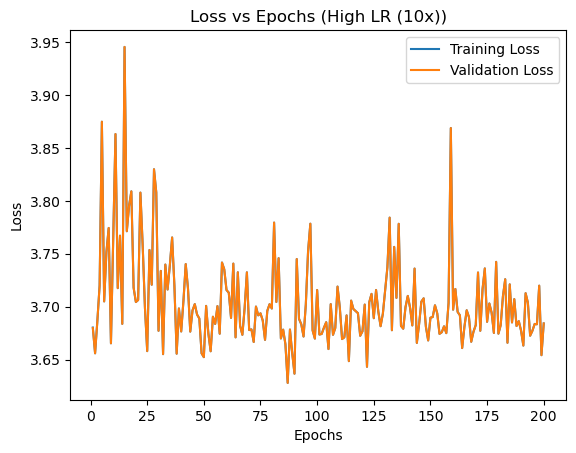

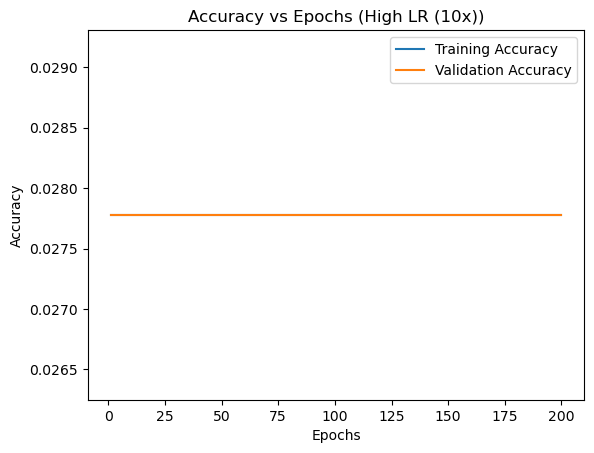

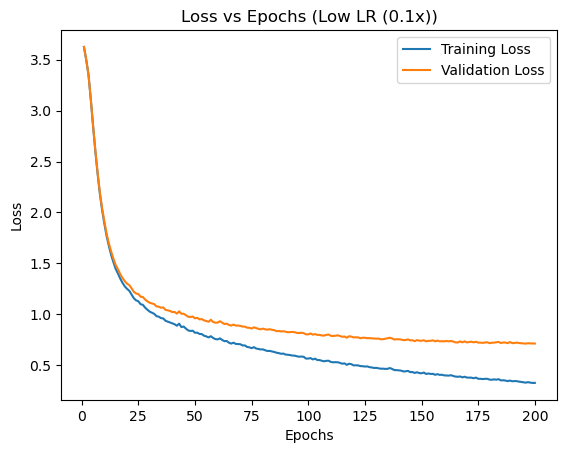

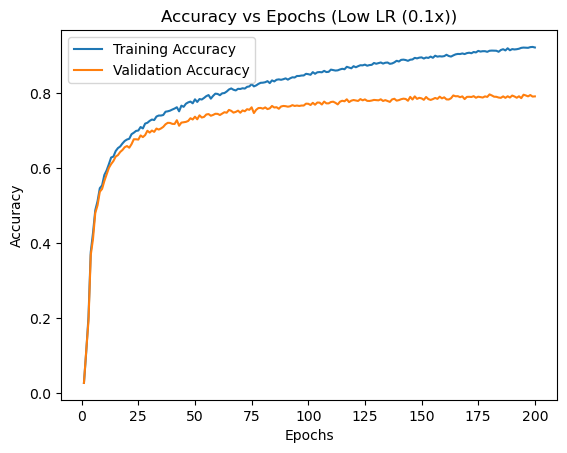

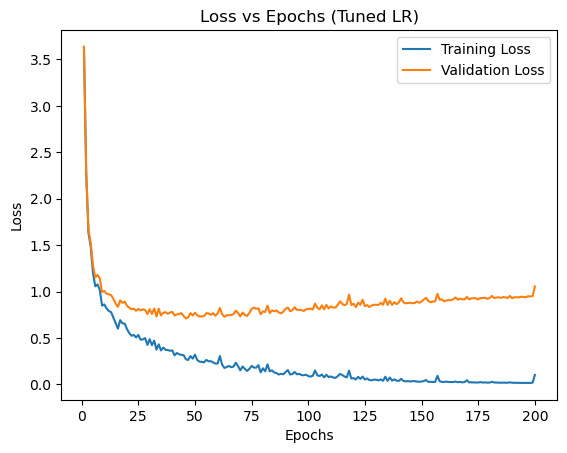

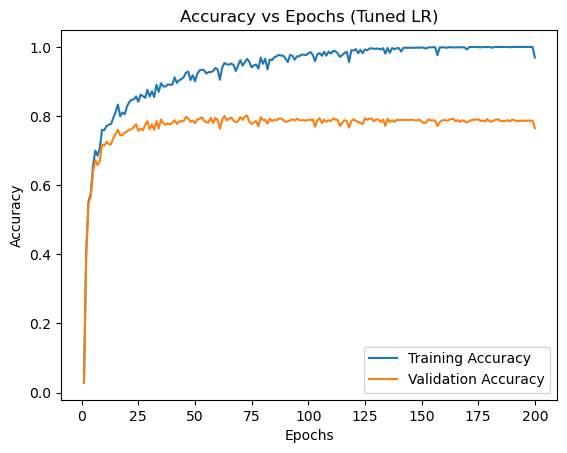

High LR (10x): Final Test Accuracy = 0.03
Low LR (0.1x): Final Test Accuracy = 0.80
Tuned LR: Final Test Accuracy = 0.79


In [22]:
############################## Q 3.3 ##############################
##########################
############################## Q 3.3 ##############################
# Define different learning rates
tuned_learning_rate = 0.01  # Replace this with the tuned learning rate from Q3.1
learning_rates = {
    "High LR (10x)": tuned_learning_rate * 10,
    "Low LR (0.1x)": tuned_learning_rate * 0.1,
    "Tuned LR": tuned_learning_rate
}

# Results storage
results = {}

# Fixed random seed for reproducibility
np.random.seed(42)

# Train and evaluate the model for each learning rate
for name, lr in learning_rates.items():
    print(f"Training with {name}: Learning Rate = {lr}")

    # Reinitialize parameters
    params = {}
    initialize_weights(train_x.shape[1], hidden_size, params, "layer1")
    initialize_weights(hidden_size, train_y.shape[1], params, "output")

    # Storage for losses and accuracies
    train_loss = []
    valid_loss = []
    train_acc = []
    valid_acc = []

    # Training loop
    for itr in range(max_iters):
        # Record training and validation loss and accuracy for plotting
        h1 = forward(train_x, params, 'layer1', sigmoid)
        probs = forward(h1, params, 'output', softmax)
        loss, acc = compute_loss_and_acc(train_y, probs)
        train_loss.append(loss / train_x.shape[0])
        train_acc.append(acc)

        h1 = forward(valid_x, params, 'layer1', sigmoid)
        probs = forward(h1, params, 'output', softmax)
        loss, acc = compute_loss_and_acc(valid_y, probs)
        valid_loss.append(loss / valid_x.shape[0])
        valid_acc.append(acc)

        # Training with batches
        total_loss = 0
        total_acc = 0
        for xb, yb in get_random_batches(train_x, train_y, batch_size):
            # Forward pass
            h1 = forward(xb, params, 'layer1', sigmoid)
            probs = forward(h1, params, 'output', softmax)

            # Compute loss and accuracy
            batch_loss, batch_acc = compute_loss_and_acc(yb, probs)
            total_loss += batch_loss
            total_acc += batch_acc

            # Backward pass
            delta1 = probs - yb  # Gradient of cross-entropy loss
            delta2 = backwards(delta1, params, name='output', activation_deriv=linear_deriv)
            backwards(delta2, params, name='layer1', activation_deriv=sigmoid_deriv)

            # Apply gradient updates
            for key in params.keys():
                if key.startswith('grad_'):
                    param_key = key[5:]  # Remove "grad_" prefix
                    params[param_key] -= lr * params[key]

        if itr % 2 == 0:
            print(f"itr: {itr:02d}   loss: {total_loss / train_x.shape[0]:.2f}   acc: {total_acc / batch_num:.2f}")

    # Record results for plotting
    results[name] = {
        "train_loss": train_loss,
        "valid_loss": valid_loss,
        "train_acc": train_acc,
        "valid_acc": valid_acc
    }

    # Compute final test accuracy
    h1 = forward(test_x, params, 'layer1', sigmoid)
    test_probs = forward(h1, params, 'output', softmax)
    _, test_acc = compute_loss_and_acc(test_y, test_probs)
    results[name]["test_acc"] = test_acc
    print(f"{name} Test Accuracy: {test_acc:.2f}")

############################## Plotting ##############################

for name, result in results.items():
    epochs = range(1, max_iters + 1)

    # Plot training and validation loss
    plt.figure()
    plt.plot(epochs, result["train_loss"], label="Training Loss")
    plt.plot(epochs, result["valid_loss"], label="Validation Loss")
    plt.title(f"Loss vs Epochs ({name})")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    # Plot training and validation accuracy
    plt.figure()
    plt.plot(epochs, result["train_acc"], label="Training Accuracy")
    plt.plot(epochs, result["valid_acc"], label="Validation Accuracy")
    plt.title(f"Accuracy vs Epochs ({name})")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

############################## Analysis ##############################

# Compare test accuracy
for name, result in results.items():
    print(f"{name}: Final Test Accuracy = {result['test_acc']:.2f}")


##########################


---

Key comments:

High learning rate (10x) may lead to oscillations or instability in loss and poor convergence.

Low learning rate (0.1x) results in slower convergence and potentially underfitting.

Tuned learning rate should achieve the best balance between speed and stability, yielding the highest accuracy.


---

## Q3.4 (3 points)

Compute and visualize the confusion matrix of the test data for your best model. Comment on the top few pairs of classes that are most commonly confused.

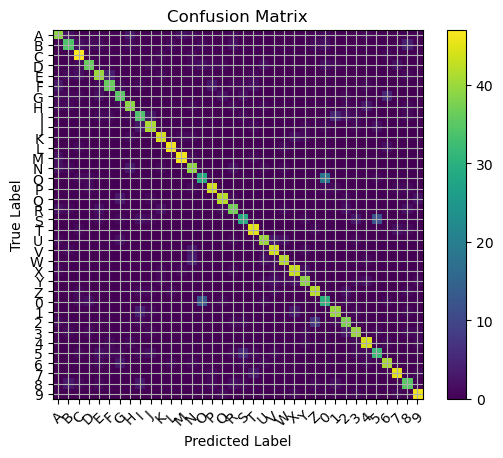

In [23]:
############################## Q 3.4 ##############################
confusion_matrix = np.zeros((train_y.shape[1], train_y.shape[1]))

# Compute confusion matrix
##########################
##### Your code here #####

# Forward pass on test set
h1 = forward(test_x, params, 'layer1', sigmoid)
probs = forward(h1, params, 'output', softmax)

# Convert predictions to one-hot encoding
predicted_labels = np.argmax(probs, axis=1)
true_labels = np.argmax(test_y, axis=1)

# Populate confusion matrix
for t, p in zip(true_labels, predicted_labels):
    confusion_matrix[t, p] += 1

##########################

# Visualize confusion matrix
import string
plt.imshow(confusion_matrix, interpolation='nearest', cmap='viridis')
plt.grid()
plt.xticks(np.arange(36), string.ascii_uppercase[:26] + ''.join([str(_) for _ in range(10)]), rotation=45)
plt.yticks(np.arange(36), string.ascii_uppercase[:26] + ''.join([str(_) for _ in range(10)]))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.colorbar()
plt.title("Confusion Matrix")
plt.show()

---
0(zero) and O(Oh) are confused most frequently since they basically look the same.

Another confusion is between Y and V due to the downward pointing vertex common to both.

Z and 2 are also confused since 2 is the cursive version of Z

---

# Q4 Object Detection and Tracking

## **Initialization**

Run the following code, which imports the modules you'll need and defines helper functions you may need to use later in your implementations.

In [24]:
import cv2
import numpy as np
import torchvision
from torchvision.io.image import read_image
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
import torch
import argparse
from PIL import Image
from matplotlib import pyplot as plt
import os
import glob

# Utility functions

coco_names = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

# Create different colors for each class.
COLORS = np.random.uniform(0, 255, size=(len(coco_names), 3))

def draw_boxes(boxes, labels, image):
    """
    Draws the bounding box around a detected object, also with labels
    """
    image = image.copy()
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width
    tf = max(lw - 1, 1) # Font thickness.
    for i, box in enumerate(boxes):
        color = COLORS[labels[i]]
        cv2.rectangle(
            img=image,
            pt1=(int(box[0]), int(box[1])),
            pt2=(int(box[2]), int(box[3])),
            color=color[::-1],
            thickness=lw
        )
        cv2.putText(
            img=image,
            text=coco_names[labels[i]],
            org=(int(box[0]), int(box[1]-5)),
            fontFace=cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=lw / 3,
            color=color[::-1],
            thickness=tf,
            lineType=cv2.LINE_AA
        )
    return image


def draw_single_track(all_frames, track, track_idx):
    """
    Visualize a track
    """
    image_vis_list = []
    start_frame = track['start_frame']
    num_frames_in_track = len(track['bboxes'])
    print('Visualizing track {} with {} frames, starting from frame {}'.format(track_idx, num_frames_in_track, start_frame))

    for track_frame_num in range(num_frames_in_track):
        frame_num = start_frame + track_frame_num
        image, _, _, _ = all_frames[frame_num]
        bbox = track['bboxes'][track_frame_num]
        image_viz = image.copy()

        # print('Frame: {}, Bbox: {}'.format(frame_num, bbox))
        cv2.rectangle(image_viz, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 4)

        xcentroid, ycentroid = (bbox[0] + bbox[2]) // 2, (bbox[1] + bbox[3]) // 2
        text = "ID {}".format(track_idx)

        cv2.putText(image_viz, text, (xcentroid - 10, ycentroid - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 0), 3)
        cv2.circle(image_viz, (xcentroid, ycentroid), 6, (0, 255, 0), -1)

        image_vis_list.append(image_viz)

    return image_vis_list


def draw_multi_tracks(all_frames, tracks):
    """
    Visualize multiple tracks
    """
    # Mapping from frame number to a list of (bbox, track_idx) tuples
    viz_per_frame = {}

    # Image visualization list
    image_vis_list = []

    # Track idx to color (each track idx has a color)
    track_to_color = {}

    # Loop through the tracks and got the proper info
    for track_idx, track in enumerate(tracks):
        start_frame = track['start_frame']
        num_frames_in_track = len(track['bboxes'])
        print('Visualizing track {} with {} frames, starting from frame {}'.format(track_idx, num_frames_in_track, start_frame))

        for track_frame_num in range(num_frames_in_track):
            frame_num = start_frame + track_frame_num
            bbox = track['bboxes'][track_frame_num]

            # Ensure bbox is valid
            if len(bbox) != 4:
                raise ValueError(f"Invalid bbox format: {bbox}. Expected a 4-element sequence.")

            if frame_num not in viz_per_frame:
                viz_per_frame[frame_num] = []
            viz_per_frame[frame_num].append((bbox, track_idx))

    # Loop through the frames and draw the boxes
    for frame_num, (image, bboxes, confidences, class_ids) in enumerate(all_frames):
        image_viz = image.copy()

        if frame_num not in viz_per_frame:
            continue

        for bbox, track_idx in viz_per_frame[frame_num]:
            if track_idx not in track_to_color:
                track_to_color[track_idx] = np.random.randint(0, 255, size=3)

            color = track_to_color[track_idx]
            color = (int(color[0]), int(color[1]), int(color[2]))

            # Ensure bbox is integers before drawing
            bbox = [int(coord) for coord in bbox]
            cv2.rectangle(image_viz, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color, 4)

            xcentroid, ycentroid = (bbox[0] + bbox[2]) // 2, (bbox[1] + bbox[3]) // 2
            text = "ID {}".format(track_idx)

            cv2.putText(image_viz, text, (xcentroid - 15, ycentroid - 15), cv2.FONT_HERSHEY_SIMPLEX, 1.5, color, 4)
            cv2.circle(image_viz, (xcentroid, ycentroid), 10, color, -1)

        image_vis_list.append(image_viz)

    return image_vis_list

## **Set up data**


In [25]:
if not os.path.exists('car_frames_simple.zip'):
  !wget https://www.andrew.cmu.edu/user/kvuong/car_frames_simple.zip -O car_frames_simple.zip
  !unzip -qq "car_frames_simple.zip"
  print("downloaded and unzipped data")

## **Problem 4.1**: Object Detection with Faster-RCNN


In [26]:
def get_model(device):
    """
    Load the pretrained model + inference transform
    """
    # Load the model
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)
    # Load the model onto the computation device
    model = model.eval().to(device)
    # inference transform
    preprocess = weights.transforms()

    return model, preprocess


def predict(image, model, device, detection_threshold):
    """
    Predicts bounding boxes, scores, and class labels for objects detected in an image.
    Only returns detections with confidence above the specified threshold.

    Args:
        image (torch.Tensor): The input image tensor.
        model (torchvision.models.detection.FasterRCNN): The object detection model.
        device (torch.device): The device to perform computations on.
        detection_threshold (float): Confidence threshold for filtering detections.

    Returns:
        boxes (numpy.ndarray): Bounding boxes of detected objects above the confidence threshold. Shape (N, 4),
            where N is the number of detections. Bbox format: (x1, y1, x2, y2)
        scores (numpy.ndarray): Confidence scores for the detected objects. Shape (N,)
        labels (numpy.ndarray): Class labels for the detected objects. Shape (N,)
    """

    # Move input image to the specified device (GPU/CPU)
    image = image.to(device)

    # Add a batch dimension to the image tensor
    image = image.unsqueeze(0)

    # Run the forward pass
    with torch.no_grad():
        outputs = model(image)

    # Extract the scores, bounding boxes, and labels
    boxes = outputs[0]['boxes'].cpu().numpy()
    scores = outputs[0]['scores'].cpu().numpy()
    labels = outputs[0]['labels'].cpu().numpy()

    # Apply the detection threshold
    keep = scores >= detection_threshold
    boxes = boxes[keep]
    scores = scores[keep]
    labels = labels[keep]

    return boxes, scores, labels


def run_detector(image_path, model, preprocess, det_threshold=0.9):
    """
    Runs the object detector on a given image and retrieves bounding boxes, confidence scores,
    and class labels for detected objects.

    Args:
        image_path (str): Path to the image file to detect objects in.
        model (torchvision.models.detection.FasterRCNN): The object detection model.
        preprocess (callable): Preprocessing function for the image.
        det_threshold (float): Confidence threshold for detections.

    Returns:
        image_np (numpy.ndarray): Original image in numpy array format (for visualization later)
        bboxes (numpy.ndarray): Bounding boxes of detected objects.
        confidences (numpy.ndarray): Confidence scores for the detected objects.
        class_ids (numpy.ndarray): Class labels for the detected objects.
    """
    # Read image to tensor (0-255 uint8)
    image_torch = read_image(image_path)
    image_np = image_torch.permute(1, 2, 0).numpy()

    # Read image to tensor (0-255 uint8)
    image_torch = read_image(image_path)
    image_np = image_torch.permute(1, 2, 0).numpy()  # Convert for visualization

    # Apply preprocessing
    image_processed = preprocess(image_torch)

    # Run the predict function
    bboxes, confidences, class_ids = predict(image_processed, model, device, det_threshold)

    return image_np, bboxes, confidences, class_ids


In [27]:
# Define the computation device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device == 'cpu':
  print('!!! WARNING: USING CPU ONLY, THIS WILL BE VERY SLOW !!!')

# First, load the model and preprocessor
model, preprocess = get_model(device)

/path/to/your/image/to/download/here: Scheme missing.


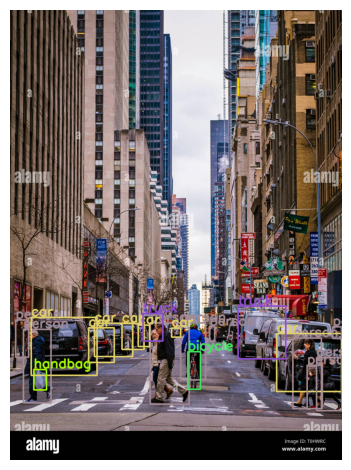

In [28]:
# TODO: either use wget or manually upload the image to temporary storage (please don't use the same image as the example in the pdf)
!wget "/path/to/your/image/to/download/here" -O example.png
image_path = "/Users/shrinivas/workspace/16-720/HW4/testimages/nyc.png"

# Run the detector on the image
output_det = run_detector(image_path, model, preprocess, det_threshold=0.9)
image, bboxes, confidences, class_ids = output_det
image_with_boxes = draw_boxes(bboxes, class_ids, image)
plt.imshow(image_with_boxes)
plt.axis('off')
plt.tight_layout()
plt.show()

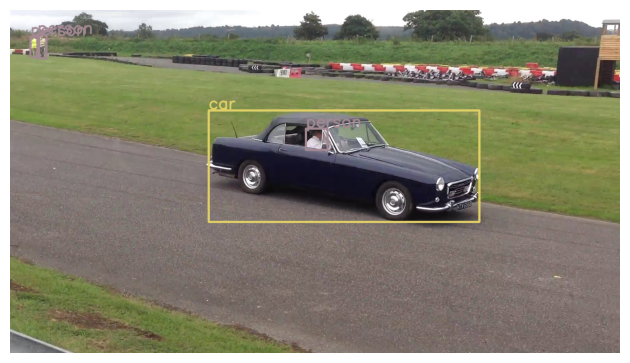

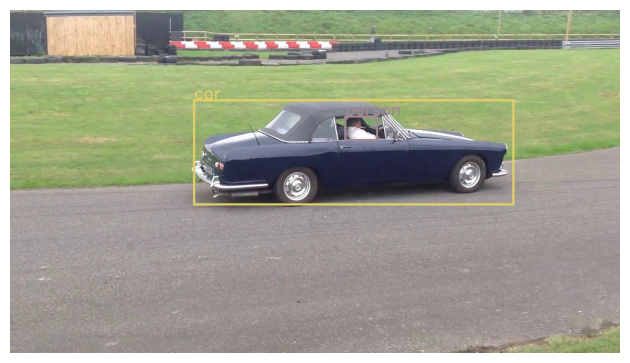

In [29]:
# TODO: run object detector on every image inside the data folder
image_folder = "./car_frames_simple"
image_paths = sorted(glob.glob(os.path.join(image_folder, "*.jpg")))

output_detections = []
for image_path in image_paths:
    output_det = run_detector(image_path, model, preprocess, det_threshold=0.9)
    output_detections.append(output_det)

# Visualize a few images (first and last image for example)
indices = [0, len(output_detections) - 1]
for idx in indices:
    image, bboxes, confidences, class_ids = output_detections[idx]
    image_with_boxes = draw_boxes(bboxes, class_ids, image)
    plt.imshow(image_with_boxes)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

## **Problem 4.2**: Multi-object-tracking with IOU-based tracker


### **Compute IOU**

In [30]:
def iou(bbox1, bbox2):
    """
    Calculates the intersection-over-union of two bounding boxes.

    Args:
        bbox1 (numpy.array, list of floats): bounding box in format x1,y1,x2,y2.
        bbox2 (numpy.array, list of floats): bounding box in format x1,y1,x2,y2.

    Returns:
        float: intersection-over-union of bbox1, bbox2
    """

    # Calculate the coordinates for the intersection rectangle
    x1 = max(bbox1[0], bbox2[0])
    y1 = max(bbox1[1], bbox2[1])
    x2 = min(bbox1[2], bbox2[2])
    y2 = min(bbox1[3], bbox2[3])

    # Check if there is an overlap
    if x1 >= x2 or y1 >= y2:
        return 0.0  # No overlap

    # Calculate the area of the intersection rectangle
    intersection_area = (x2 - x1) * (y2 - y1)

    # Calculate the area of both bounding boxes
    bbox1_area = (bbox1[2] - bbox1[0]) * (bbox1[3] - bbox1[1])
    bbox2_area = (bbox2[2] - bbox2[0]) * (bbox2[3] - bbox2[1])

    # Calculate the union area
    union_area = bbox1_area + bbox2_area - intersection_area

    # Return the IoU value
    return intersection_area / union_area

### **IOU-based Tracker**

In [31]:
def track_iou(detections, sigma_l, sigma_h, sigma_iou, t_min):
    tracks_active = []
    tracks_finished = []
    next_track_id = 0  # Counter for unique track IDs

    for frame_num, detections_frame in enumerate(detections):
        # Filter detections based on sigma_l
        dets = [det for det in detections_frame if det['score'] >= sigma_l]

        updated_tracks = []
        for track in tracks_active:
            track_updated = False

            # Find the best matching detection
            best_match = None
            best_iou = 0
            for det in dets:
                current_iou = iou(track['bboxes'][-1], det['bbox'])
                if current_iou > best_iou:
                    best_iou = current_iou
                    best_match = det

            # Extend the track if IoU is above sigma_iou
            if (best_match is not None) and best_iou >= sigma_iou:
                track['bboxes'].append(best_match['bbox'])
                track['max_score'] = max(track['max_score'], best_match['score'])
                dets.remove(best_match)
                track_updated = True

            # If the track was updated, keep it active
            if track_updated:
                updated_tracks.append(track)
            else:
                # Finish track if not updated and it meets the criteria
                if track['max_score'] >= sigma_h and len(track['bboxes']) >= t_min:
                    tracks_finished.append(track)

        # Create new tracks for unmatched detections
        for det in dets:
            new_track = {
                'id': next_track_id,  # Assign a unique ID to the new track
                'bboxes': [det['bbox']],
                'max_score': det['score'],
                'start_frame': frame_num
            }
            next_track_id += 1
            updated_tracks.append(new_track)

        # Update the active tracks
        tracks_active = updated_tracks

    # Finish remaining active tracks
    tracks_finished += [track for track in tracks_active
                        if track['max_score'] >= sigma_h and len(track['bboxes']) >= t_min]

    return tracks_finished

### **Run Tracker**

In [32]:
def run_tracker(frames, sigma_l=0.1, sigma_h=0.9, sigma_iou=0.9, t_min=2):
    # Track objects in the video
    detections = []
    for frame_num, (image, bboxes, confidences, class_ids) in enumerate(frames):
        dets = []
        for bbox, confidence, class_id in zip(bboxes, confidences, class_ids):
            dets.append({'bbox': (bbox[0], bbox[1], bbox[2], bbox[3]),
                         'score': confidence,
                         'class': class_id})
        detections.append(dets)

    print('Running tracker...')
    tracks = track_iou(detections, sigma_l=sigma_l, sigma_h=sigma_h, sigma_iou=sigma_iou, t_min=t_min)
    print('Tracker finished!')
    return tracks

In [33]:
# TODO: From the detections, run the tracker to obtain a list of tracks
# get the detection for images in car_frames_simple
output_detections = []
for image_path in image_paths:
    output_det = run_detector(image_path, model, preprocess, det_threshold=0.9)
    output_detections.append(output_det)

Running tracker...
Tracker finished!
Visualizing track 0 with 20 frames, starting from frame 0
Visualizing track 1 with 20 frames, starting from frame 0
20
[0, 19]


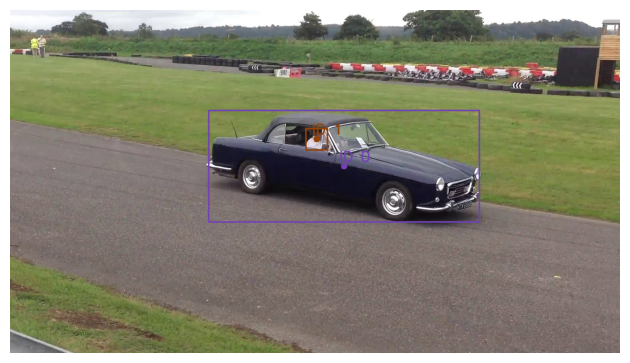

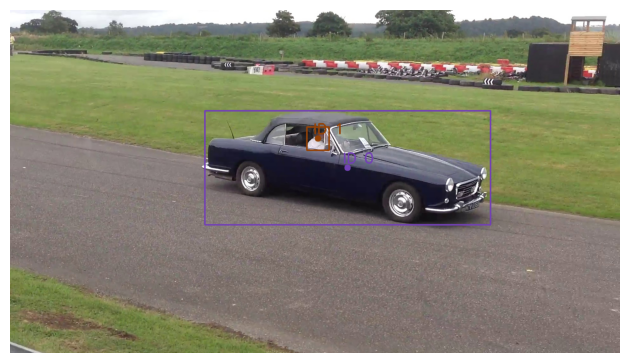

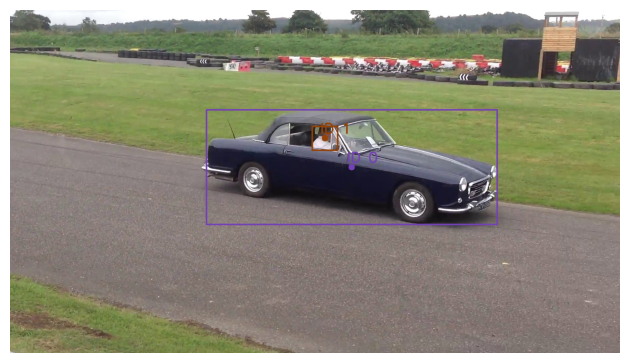

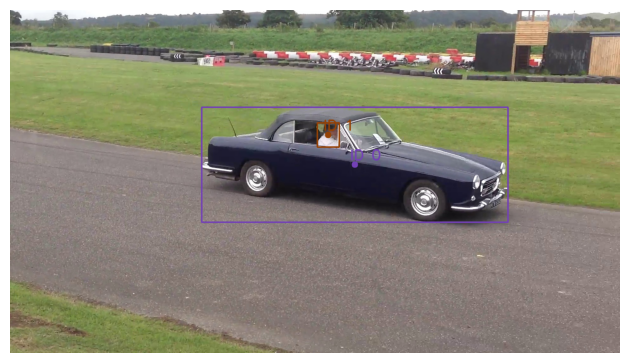

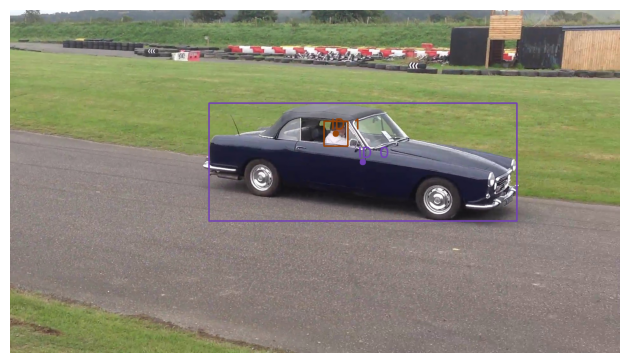

...

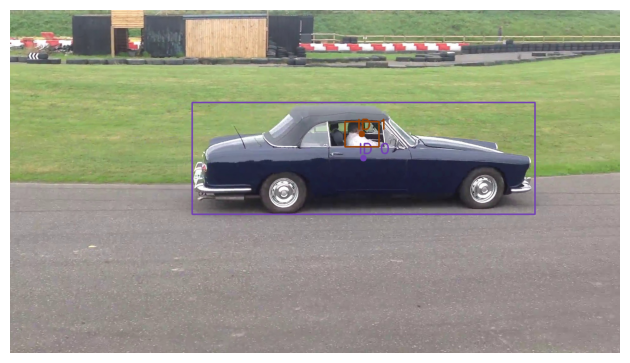

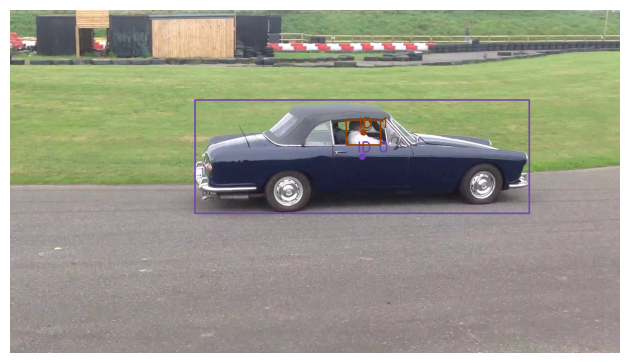

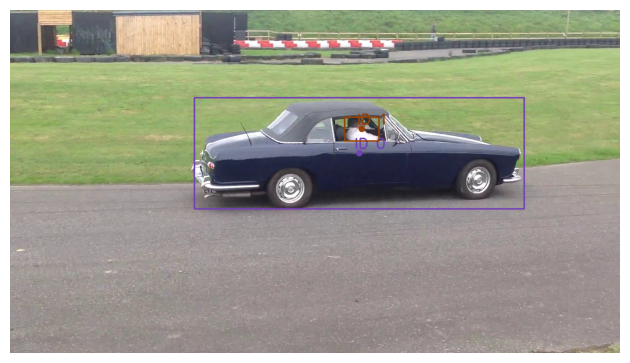

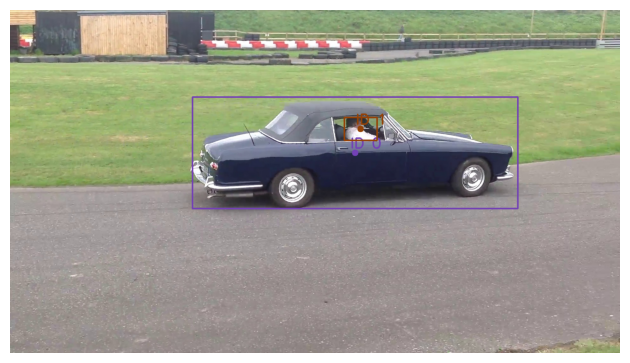

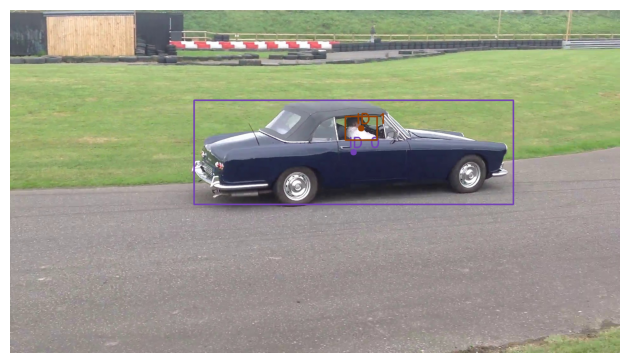

In [34]:

sigma_l, sigma_h, sigma_iou, t_min = 0.4, 0.7, 0.3, 2
output_tracks = run_tracker(output_detections, sigma_l=sigma_l, sigma_h=sigma_h, sigma_iou=sigma_iou, t_min=t_min)
# Visualize the tracks
image_vis_list = draw_multi_tracks(output_detections, output_tracks)
print(len(image_vis_list))
print(indices)

# TODO: Visualize a few images (here we show first, middle, and last image for example)
indices = [0, len(output_detections) // 2, len(output_detections) - 1]
for idx in range(len(image_vis_list)):
    plt.imshow(image_vis_list[idx])
    plt.axis('off')
    plt.tight_layout()
    plt.show()


# Q5 (Extra Credit) Extract Text from Images

Run below code to download and put the unzipped data in '/content/images' folder. We have provided you with 01_list.jpg, 02_letters.jpg, 03_haiku.jpg and 04_deep.jpg to test your implementation on.

In [35]:
if not os.path.exists('/Users/shrinivas/workspace/16-720/HW4/content/images'):
  os.mkdir('/Users/shrinivas/workspace/16-720/HW4/content/images')
  !wget http://www.cs.cmu.edu/~lkeselma/16720a_data/images.zip -O /content/images/images.zip
  !unzip "/Users/shrinivas/workspace/16-720/HW4/content/images/images.zip" -d "/content/images"
  os.system("rm /Users/shrinivas/workspace/16-720/HW4/content/images/images.zip")

In [36]:
ls /content/images

ls: /content/images: No such file or directory


## Q5.1 (Extra Credit) (4 points)

The method outlined above is pretty simplistic, and while it works for the given text samples, it makes several assumptions. What are two big assumptions that the sample method makes?

---

### Two Big Assumptions in the Sample Method

1. **Assumption about Character Segmentation:**
   - **Assumption:** The method assumes that each character is distinct and well-separated from neighboring characters, enabling clear segmentation using connected components analysis.
   - **Issue:** In real-world scenarios, characters may overlap or be connected (e.g., cursive handwriting or certain fonts), which can lead to incorrect bounding box generation or merging of multiple characters into a single component.

2. **Assumption about Uniform Line and Text Alignment:**
   - **Assumption:** The method assumes that the text is aligned in straight lines and characters within a line are evenly spaced for grouping and sorting.
   - **Issue:** Text in images might be rotated, curved, or follow a non-standard alignment (e.g., slanted handwriting or artistic fonts), making it challenging to correctly group characters into lines or determine their order.

These assumptions simplify the task but may limit accuracy and robustness for more complex or real-world text images.

---


## Q5.2 (Extra Credit) (10 points)

Implement the findLetters() function to find letters in the image. Given an RGB image, this function should return bounding boxes for all of the located handwritten characters in the image, as well as a binary black-and-white version of the image im. Each row of the matrix should contain [y1,x1,y2,x2], the positions of the top-left and bottom-right corners of the box. The black-and-white image should be between 0.0 to 1.0, with the characters in white and the background in black (consistent with the images in nist36). Hint: Since we read text left to right, top to bottom, we can use this to cluster the coordinates.

In [37]:
############################## Q 5.2 ##############################
import numpy as np
from skimage import color, filters, morphology, measure, util

def findLetters(image):
    """
    Takes a color image and returns a list of bounding boxes and a black-and-white image.
    Characters are represented in white (1.0) and background in black (0.0).
    """
    bboxes = []
    bw = None

    # Convert the image to grayscale
    grayscale = color.rgb2gray(image)

    # Denoise the image using a Gaussian filter
    denoised = filters.gaussian(grayscale, sigma=1.0)

    # Apply a binary threshold to segment the text
    threshold = filters.threshold_otsu(denoised)
    binary = denoised < threshold  # Note: characters become white, background black

    # Apply morphological operations to clean the image
    cleaned = morphology.opening(binary, morphology.square(3))  # Remove noise
    cleaned = morphology.closing(cleaned, morphology.square(3))  # Fill gaps in characters

    # Increase thickness of characters using dilation
    thickened = morphology.dilation(cleaned, morphology.square(3))  # Increase character thickness

    # Label connected components
    labeled_image = measure.label(thickened, connectivity=2)

    # Filter out small components (e.g., noise)
    for region in measure.regionprops(labeled_image):
        # Bounding box format: (min_row, min_col, max_row, max_col)
        minr, minc, maxr, maxc = region.bbox
        if (maxr - minr) > 5 and (maxc - minc) > 5:  # Skip very small boxes
            bboxes.append([minr, minc, maxr, maxc])

    # Normalize the black-and-white image to range [0.0, 1.0]
    bw = util.img_as_float(thickened)

    return bboxes, bw

## Q5.3 (Extra Credit) (3 points)

Using the provided code below, visualize all of the located boxes on top of the binary image to show the accuracy of your findLetters() function. Include all the provided sample images with the boxes.


01_list.jpg


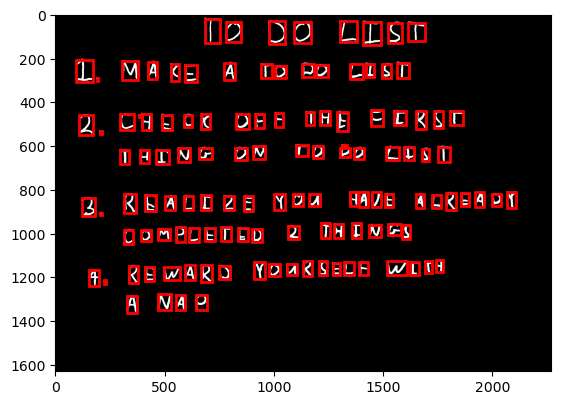


02_letters.jpg


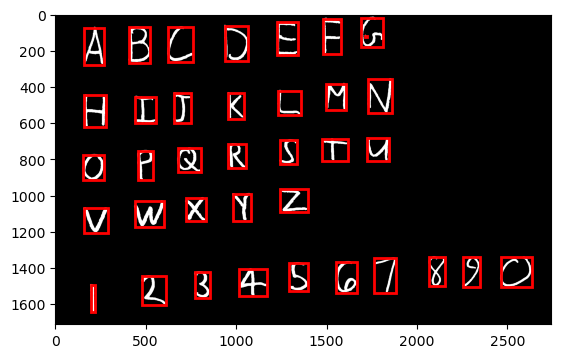


03_haiku.jpg


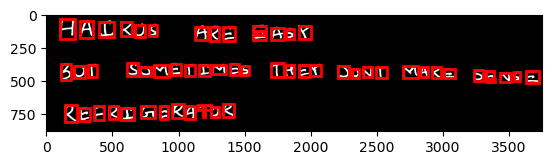


04_deep.jpg


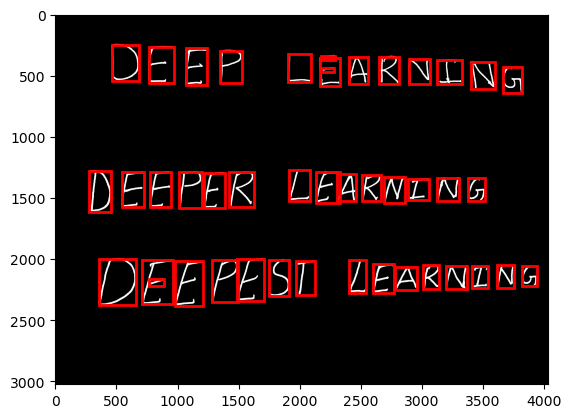

In [38]:
############################## Q 5.3 ##############################
# do not include any more libraries here!
# no opencv, no sklearn, etc!
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

for imgno, img in enumerate(sorted(os.listdir('/Users/shrinivas/workspace/16-720/HW4/content/images'))):
    im1 = skimage.img_as_float(skimage.io.imread(os.path.join('/Users/shrinivas/workspace/16-720/HW4/content/images',img)))
    bboxes, bw = findLetters(im1)

    print('\n' + img)
    plt.imshow(1-bw, cmap="Greys") # reverse the colors of the characters and the background for better visualization
    for bbox in bboxes:
        minr, minc, maxr, maxc = bbox
        rect = matplotlib.patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                fill=False, edgecolor='red', linewidth=2)
        plt.gca().add_patch(rect)
    plt.show()

## Q5.4 (Extra Credit) (8 points)

You will now load the image, find the character locations, classify each one with the network you trained in Q3.1, and return the text contained in the image. Be sure you try to make your detected images look like the images from the training set. Visualize them and act accordingly. If you find that your classifier performs poorly, consider dilation under skimage morphology to make the letters thicker.

Your solution is correct if you can correctly detect most of the letters and classify approximately 70\% of the letters in each of the sample images.

Run your code on all the provided sample images in '/content/images'. Show the extracted text. It is fine if your code ignores spaces, but if so, please provide a written answer with manually added spaces.

['A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'I' 'J' 'K' 'L' 'M' 'N' 'O' 'P' 'Q' 'R'
 'S' 'T' 'U' 'V' 'W' 'X' 'Y' 'Z' '0' '1' '2' '3' '4' '5' '6' '7' '8' '9']

Processing image: 01_list.jpg
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 9.99889854e-01 ... 9.72974297e-04
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


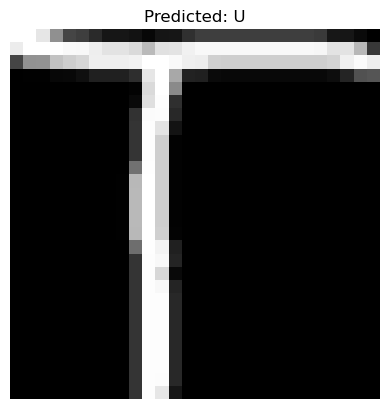

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.63543887 ... 0.054836   0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


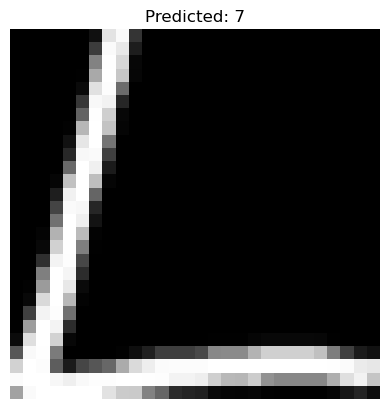

[[0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.821568 ... 0.       0.       0.      ]
 ...
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]]


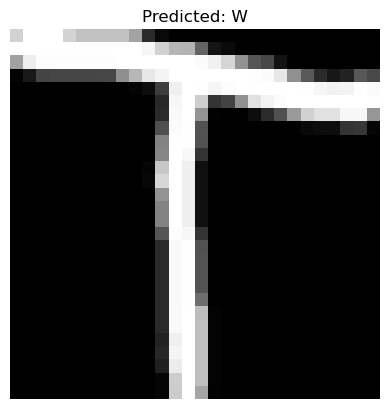

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


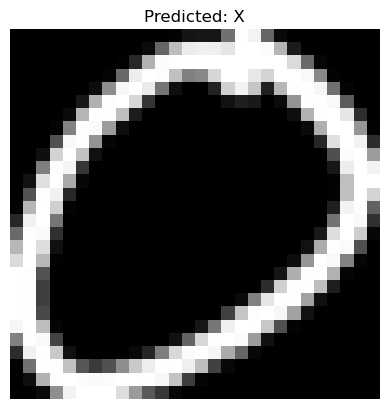

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


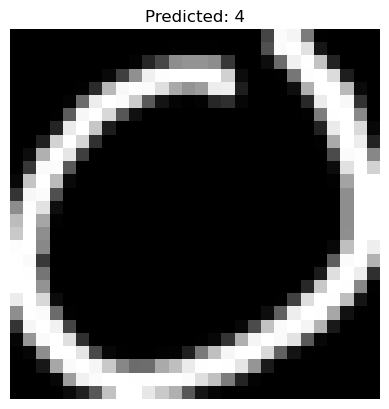

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.48693129 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00296115 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


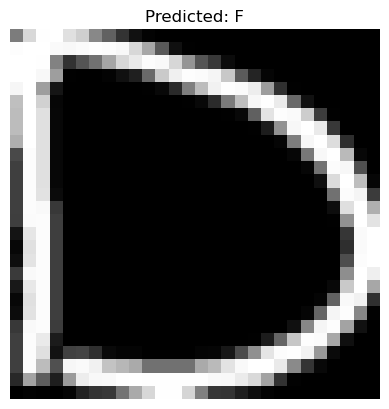

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.19158520e-07
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 6.41997118e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


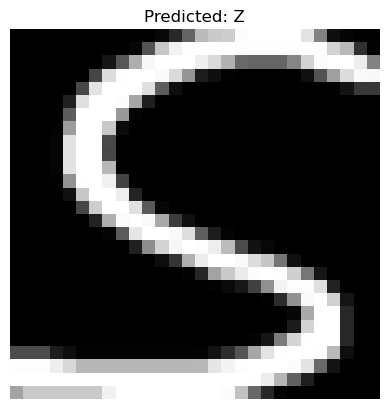

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.95504789 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00323425 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


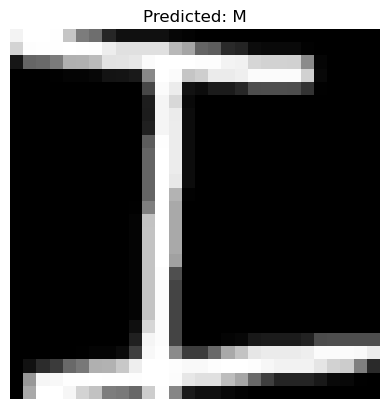

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.0022013 ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


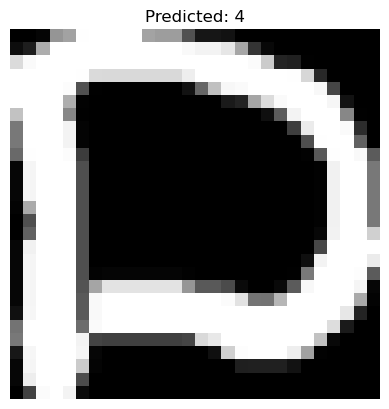

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


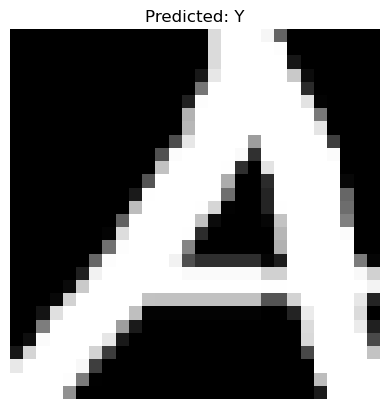

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.82127853e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.93466924e-08 ... 1.06644547e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


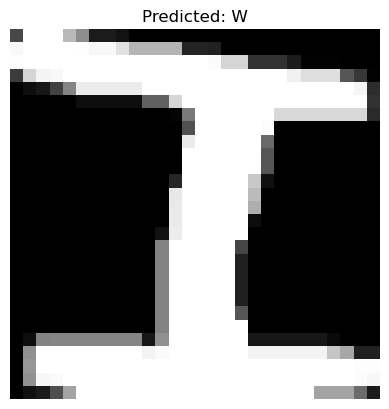

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


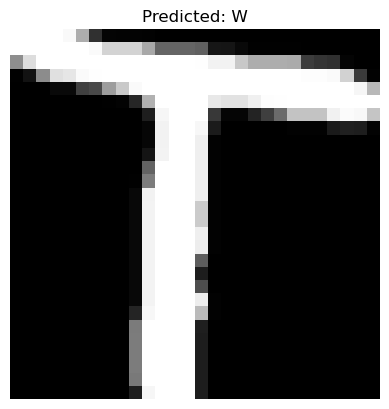

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         1.         ... 0.93072658 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


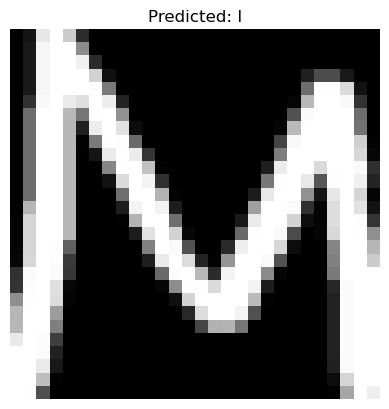

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.54283251 ... 0.04161536 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


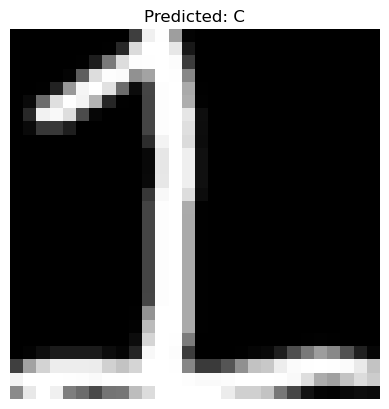

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00034457 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


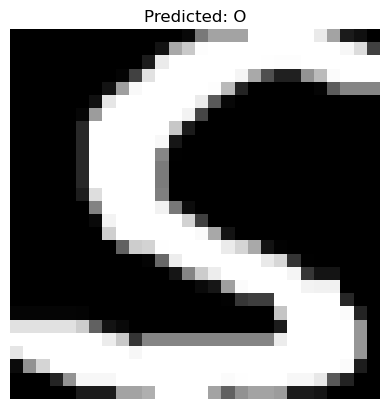

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


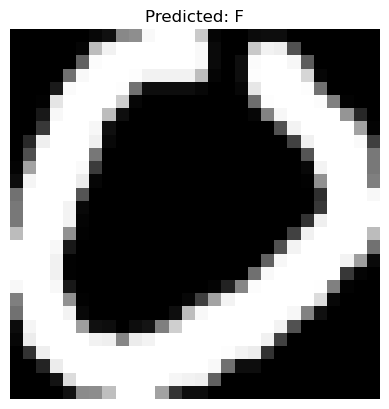

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.64652319 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


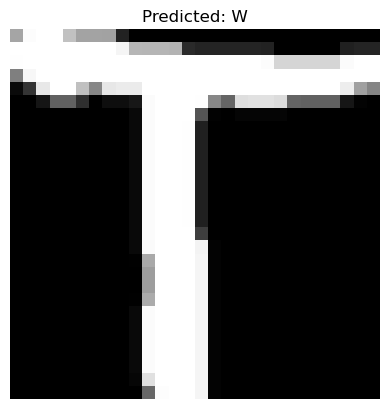

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.39929766e-05 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


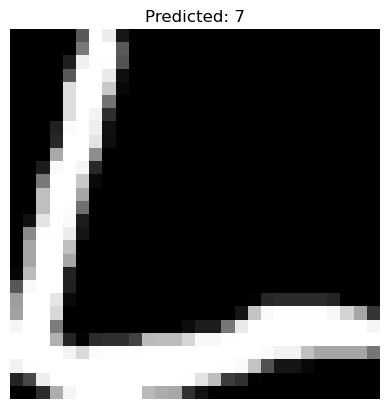

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


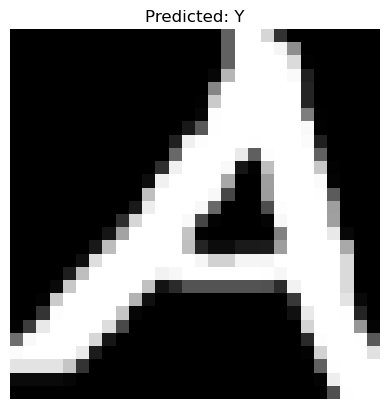

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


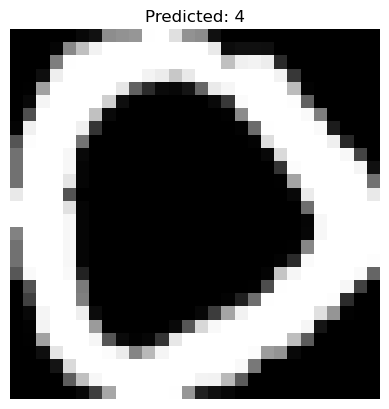

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.03983204 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


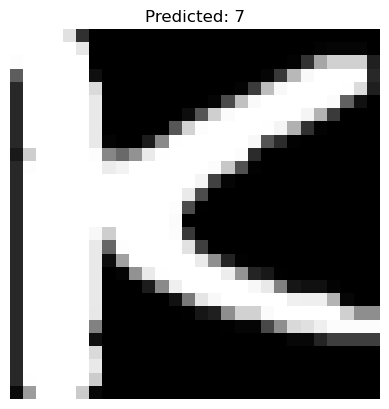

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.66802763 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


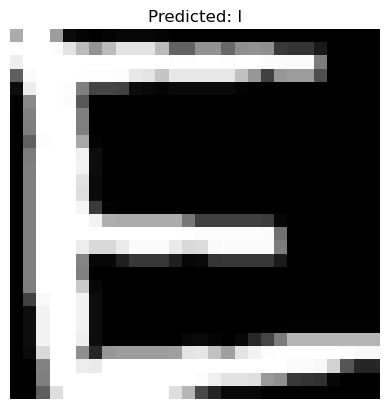

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.55357143 0.         0.        ]
 ...
 [0.         0.         0.55357143 ... 0.55357143 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


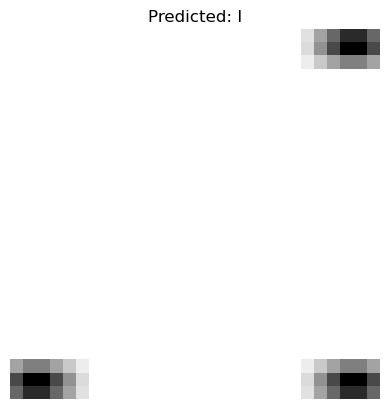

[[0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       1.       ... 0.609375 0.       0.      ]
 ...
 [0.       0.       0.375    ... 0.609375 0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]]


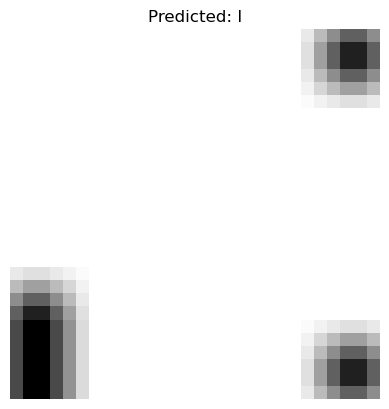

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.92885064e-01 ... 7.27845987e-06
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


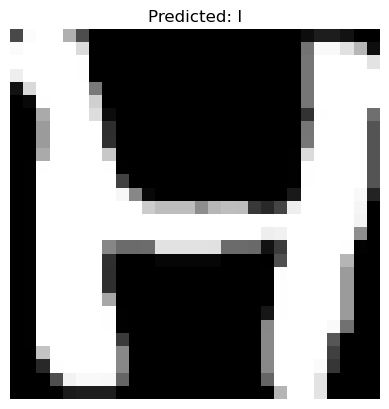

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.84653629 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


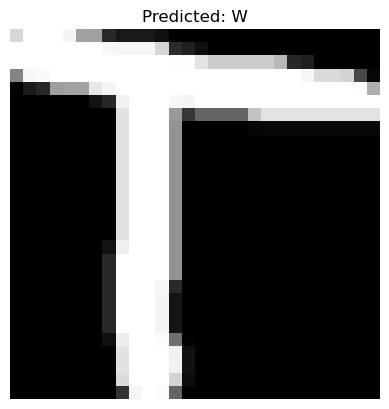

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.76414655e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 3.34869959e-04 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


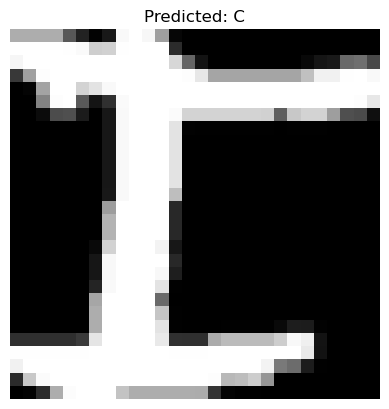

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


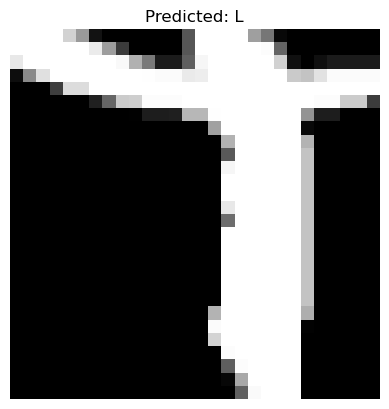

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.51424655 ... 0.00838607 0.         0.        ]
 ...
 [0.         0.         0.11187468 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


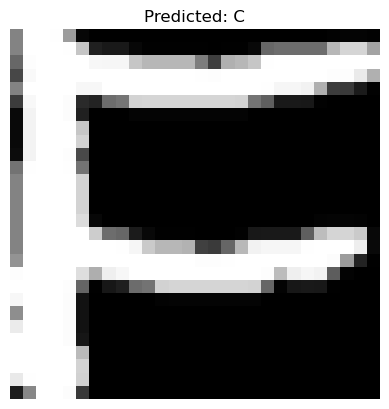

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.03253844e-10 ... 1.03253844e-10
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


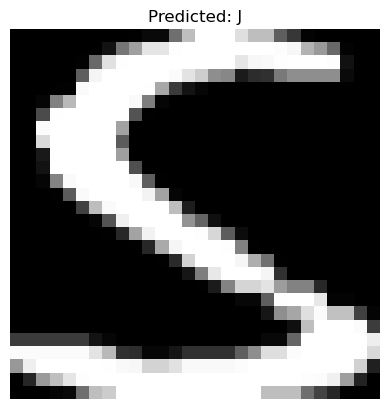

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.29464403e-10 ... 1.33025547e-05
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 2.51752753e-02 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


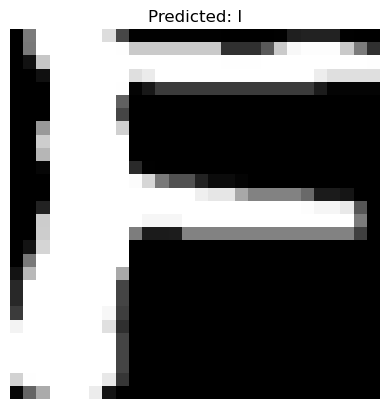

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


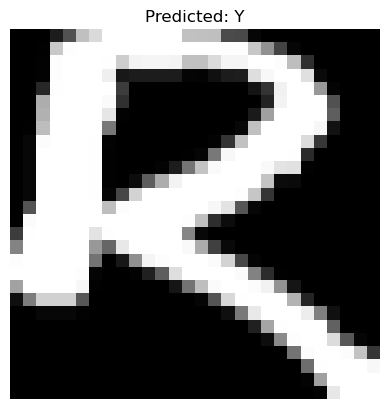

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.0246799e-05
  0.0000000e+00 0.0000000e+00]
 ...
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.0246799e-05
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


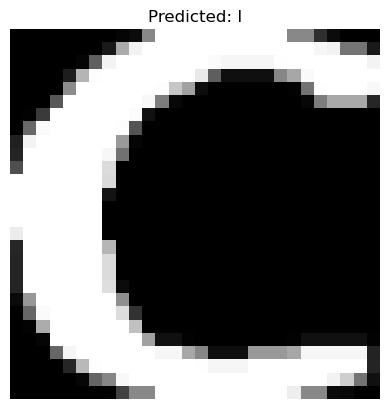

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 ... 1.35179238e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 2.93193069e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


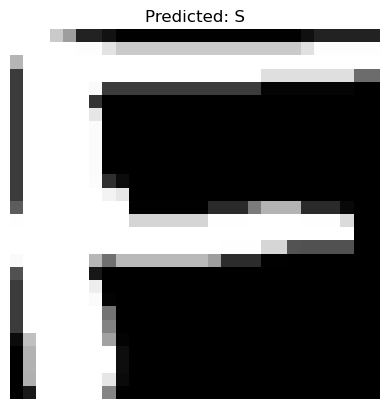

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


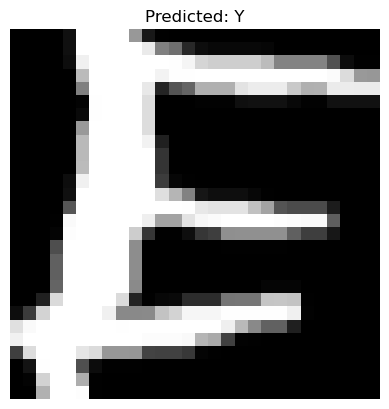

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


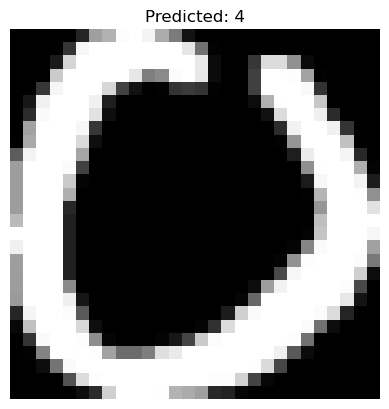

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.16892086e-05 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.03587825e-02 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


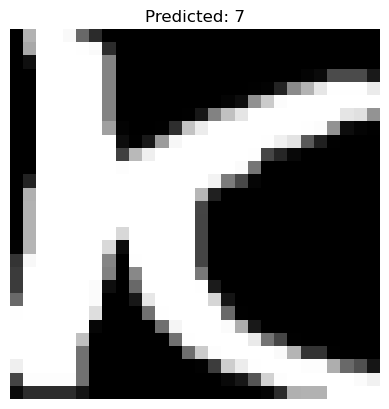

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


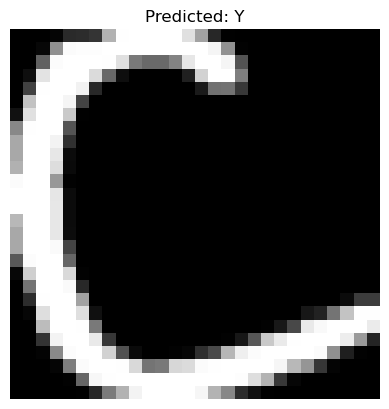

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.00864558 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


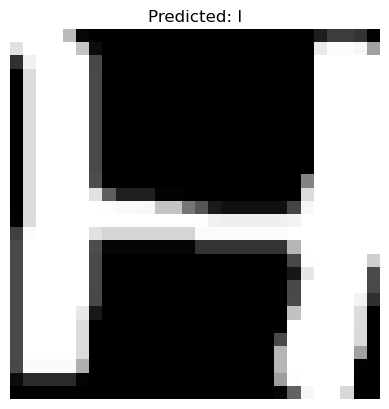

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.31942655 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.30832504 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


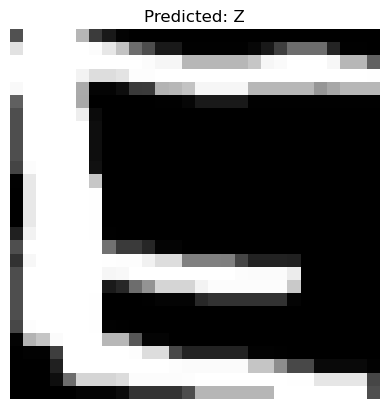

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.01474762 ... 0.92539503 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


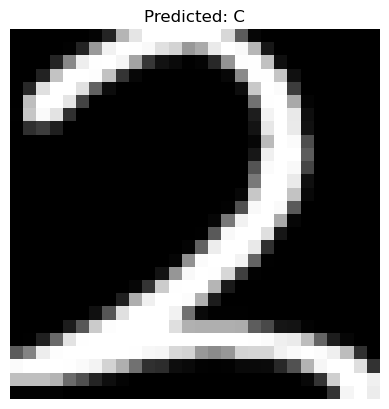

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.50446429 ... 0.08482143 0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


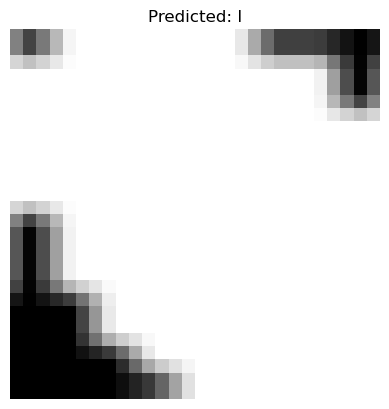

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


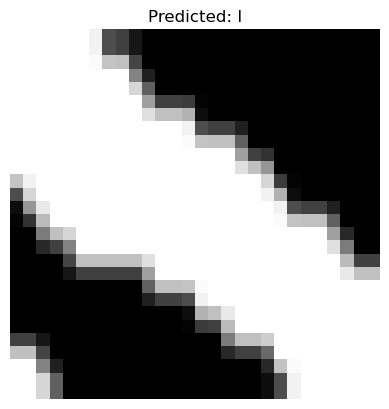

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


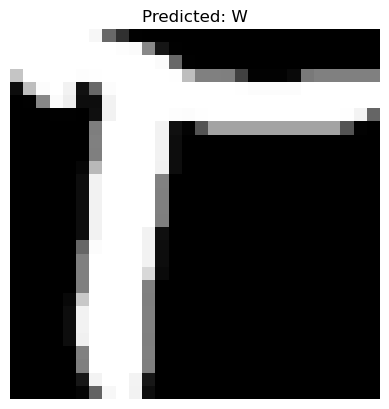

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


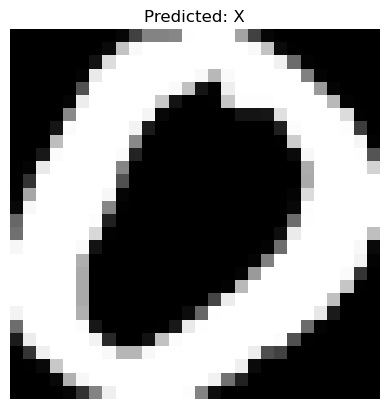

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


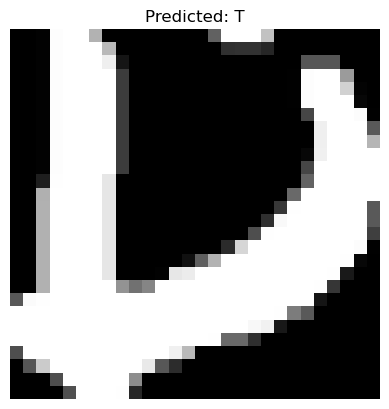

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.06147228 0.         0.        ]
 ...
 [0.         0.         0.33278151 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


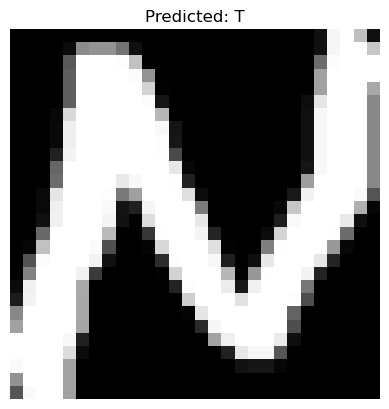

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


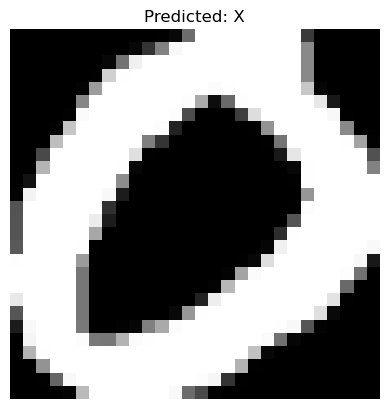

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.15852206 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


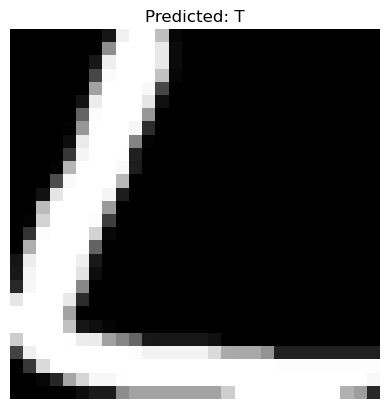

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


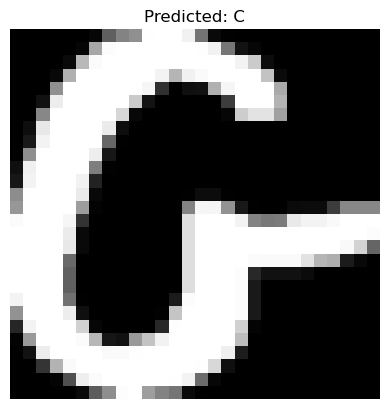

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.71238796 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


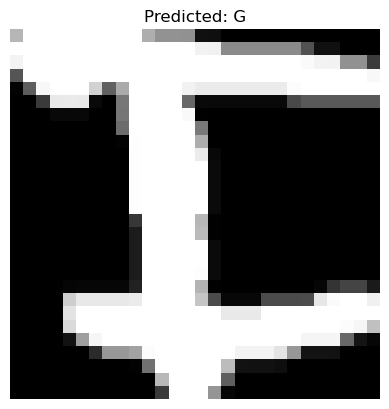

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


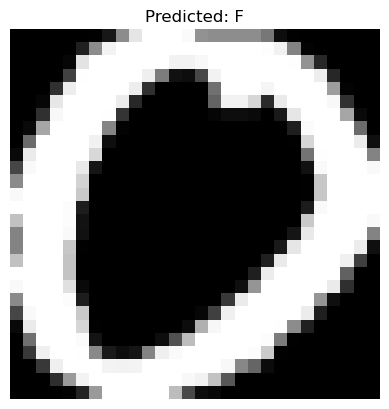

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.46342028 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


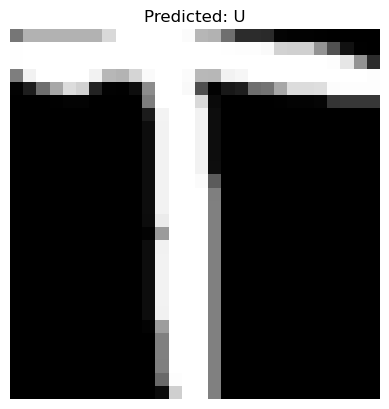

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00787615 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


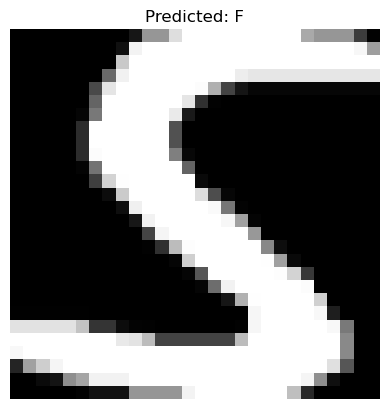

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.01048064 0.         0.        ]
 ...
 [0.         0.         0.11147862 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


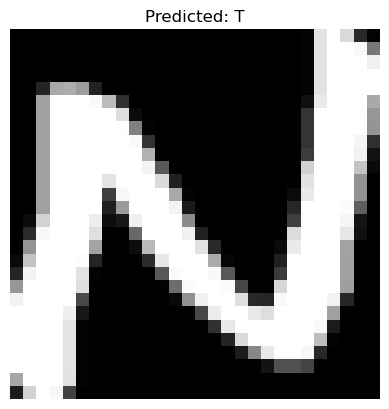

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 ... 4.87213934e-08
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


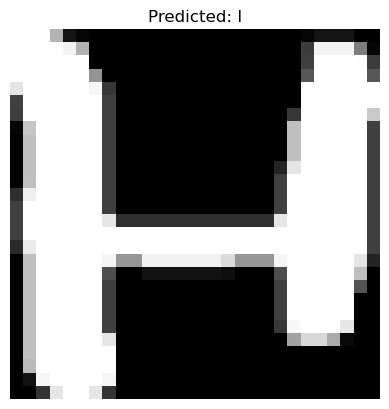

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00742083 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


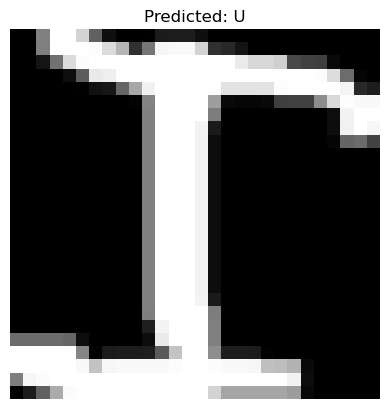

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


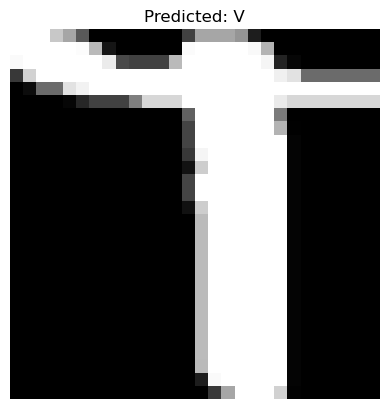

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.87951855e-01 ... 7.90108236e-13
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 6.12724465e-11 ... 1.00960389e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


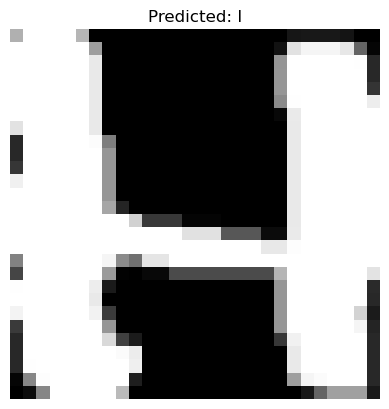

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.03224006 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


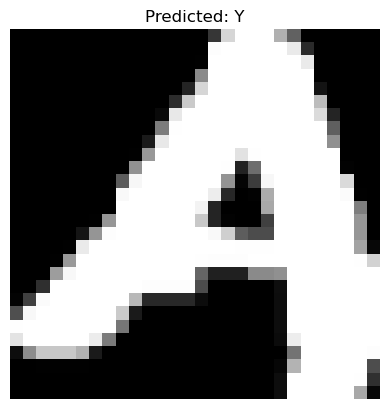

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.44554863e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 7.26669347e-05 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


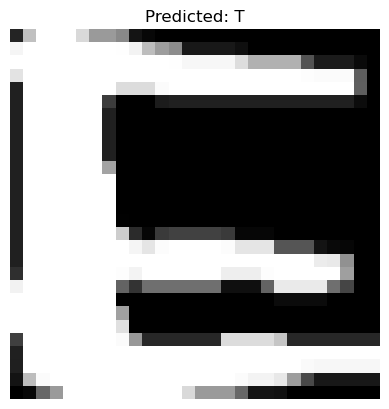

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


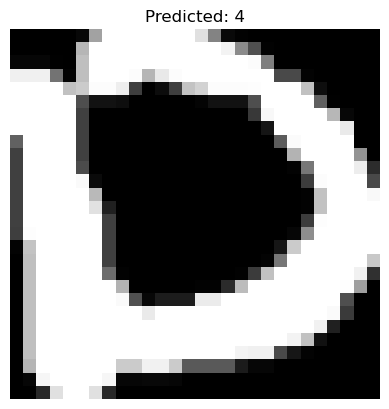

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.27796305 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


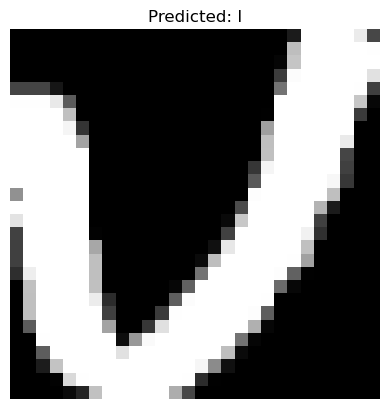

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.76888751 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


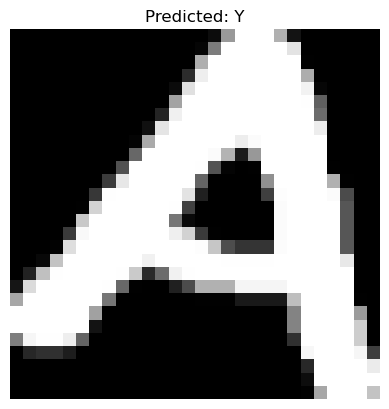

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


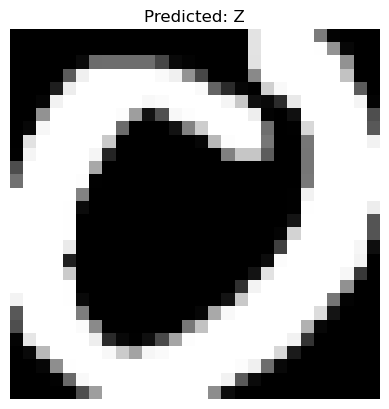

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.78903958 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


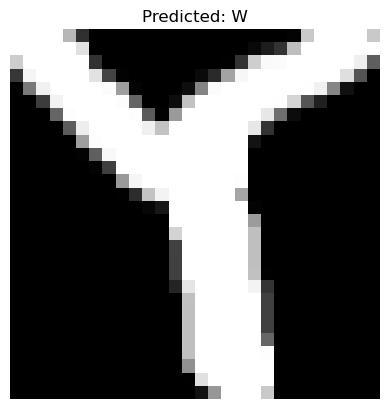

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.08740196e-04 ... 1.10223932e-02
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.17835745e-02 ... 9.74722235e-16
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


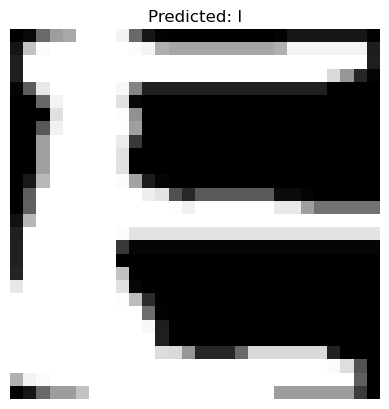

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


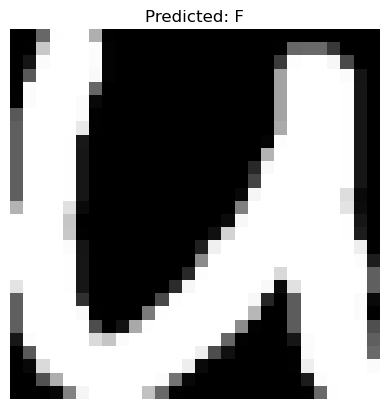

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


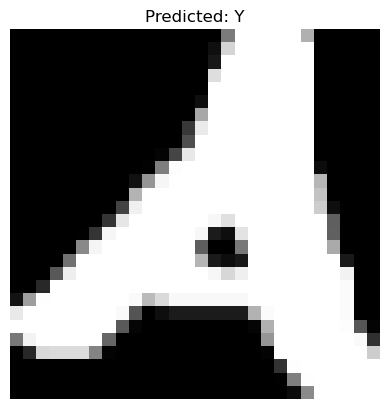

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


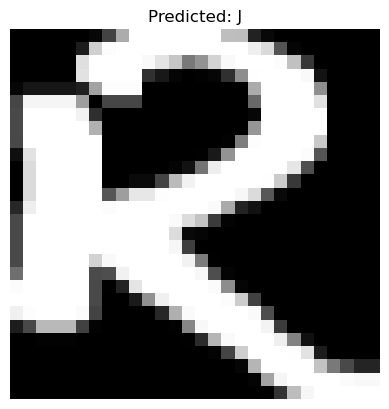

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.43619218e-04 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


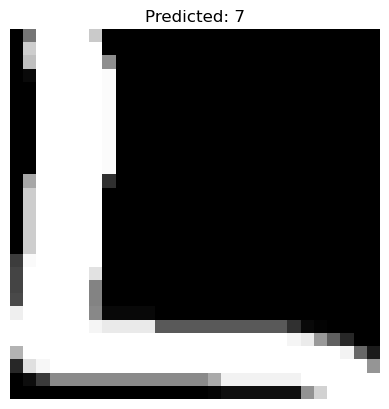

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.19288491 ... 1.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


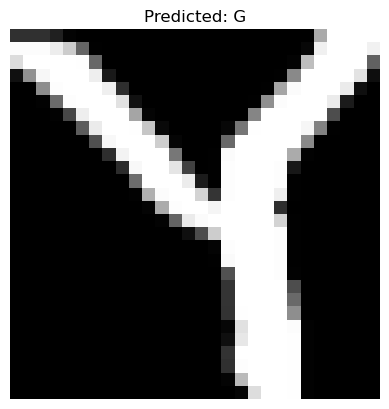

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


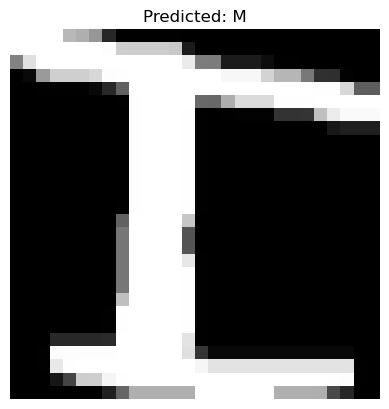

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00151901 ... 0.15446931 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


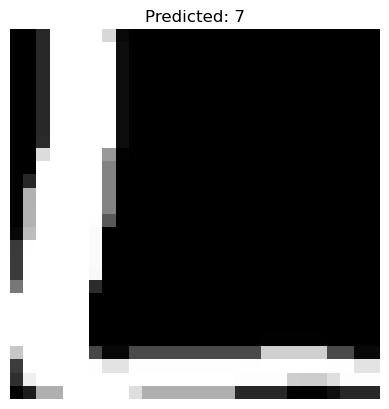

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.26643459 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.0617638  ... 0.13517924 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


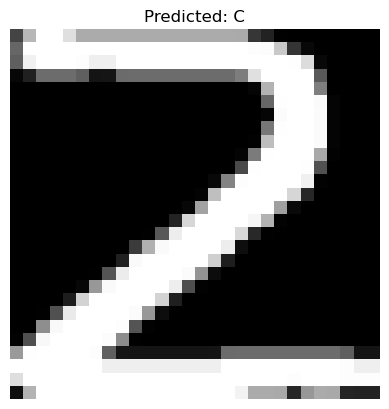

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 4.13748263e-01 ... 8.86397705e-11
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


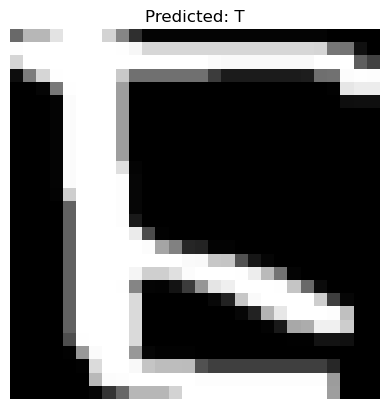

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.53866275 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


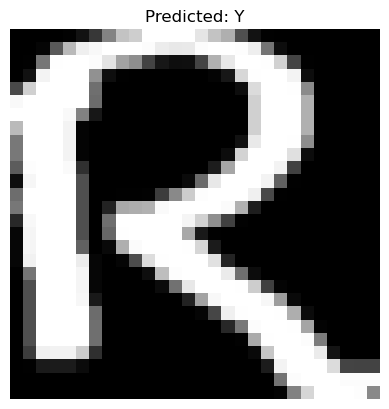

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 2.27256245e-05 ... 7.90226649e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


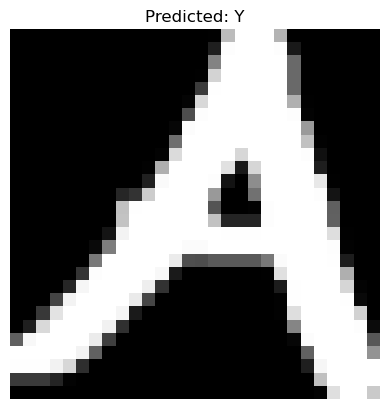

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00102658 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


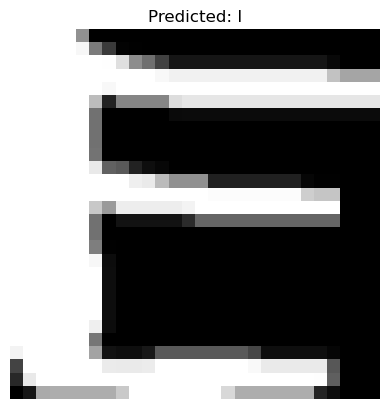

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


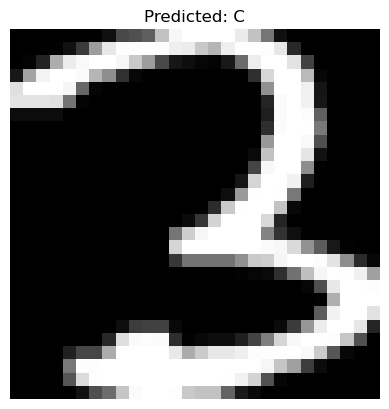

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.52806122 ... 0.09693878 0.         0.        ]
 ...
 [0.         0.         0.52806122 ... 0.33928571 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


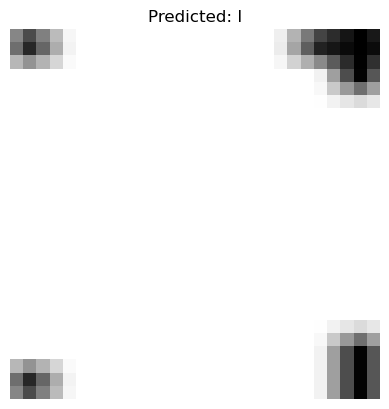

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


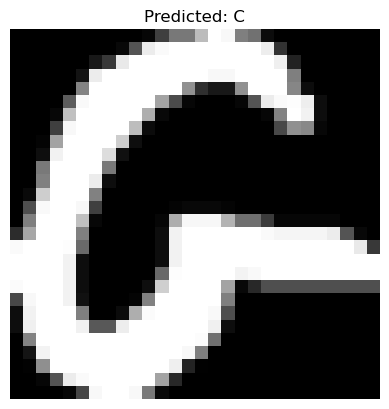

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.20696318e-09
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


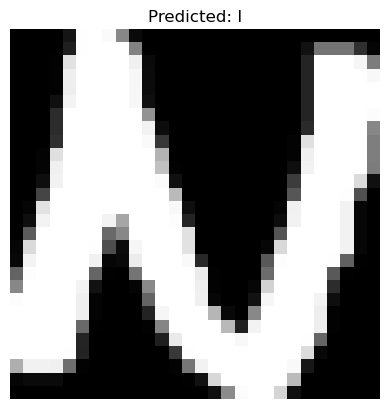

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.75118386 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


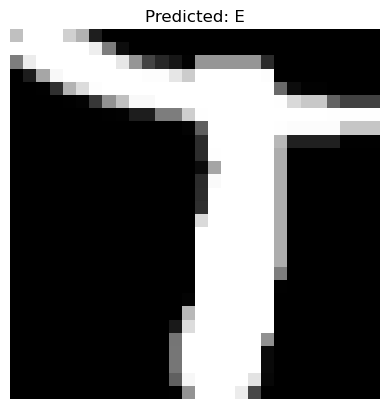

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


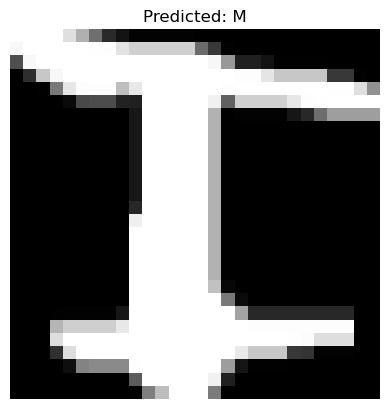

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        1.        ... 0.0269179 0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


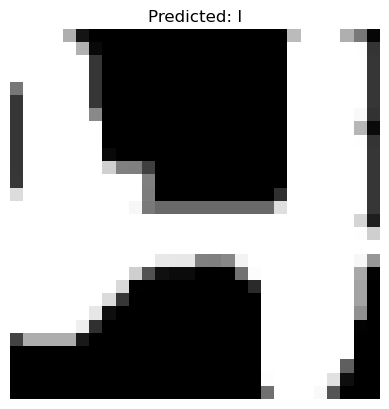

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.47367974e-11
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 9.73406208e-02 ... 3.47367974e-11
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


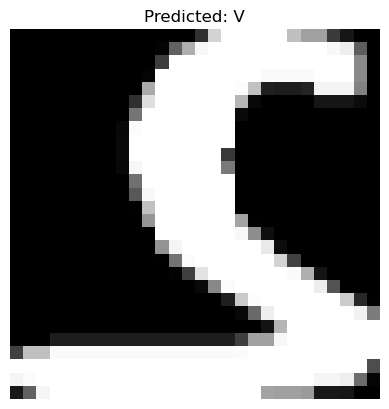

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 1.2842656e-05 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 7.9060962e-01
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


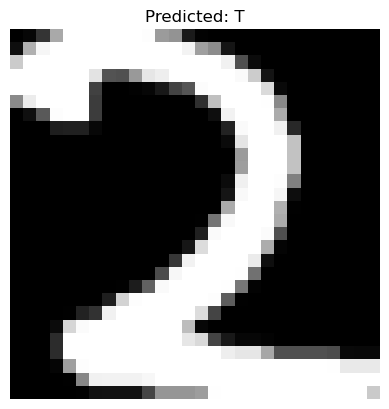

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


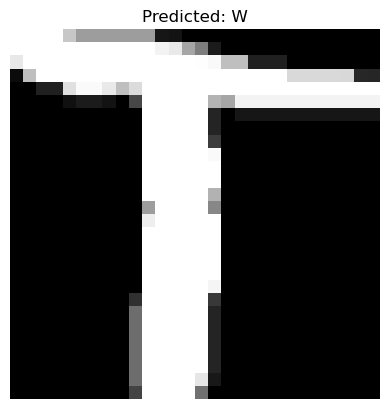

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.87213934e-08 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


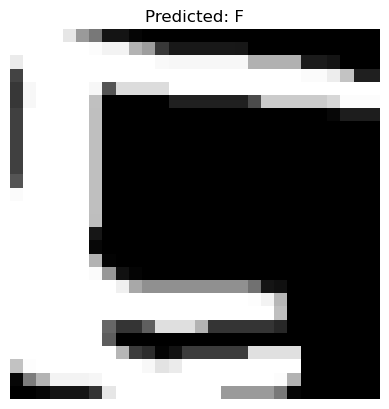

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.25085596 ... 0.23902136 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


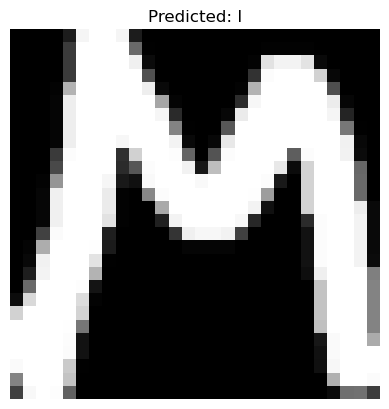

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.72820546 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


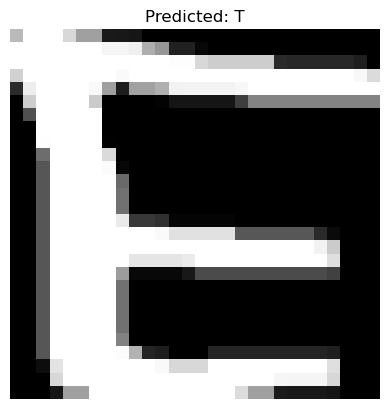

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


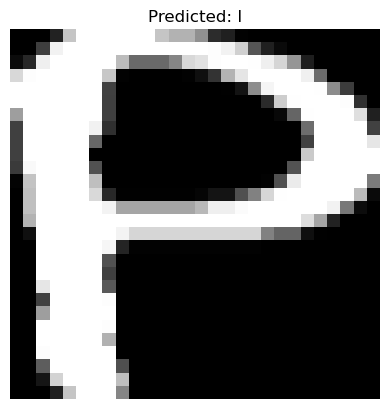

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.03480027 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


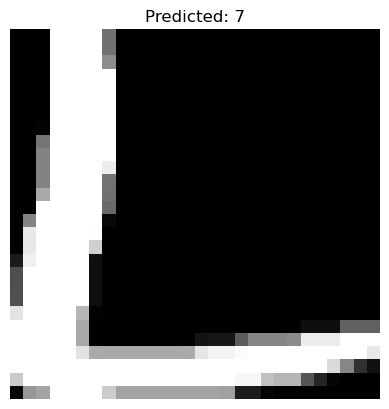

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


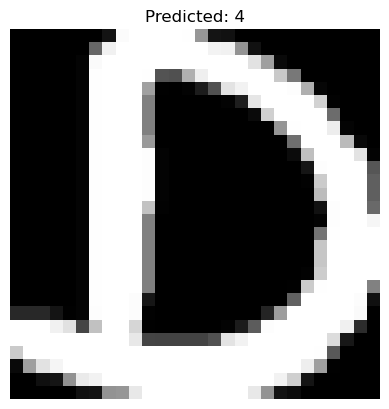

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


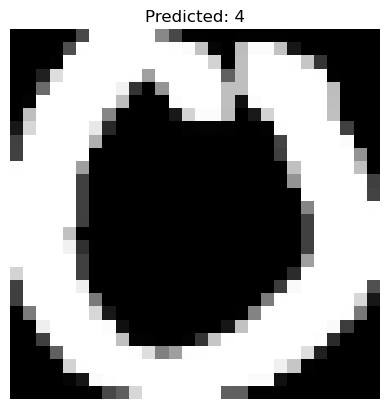

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


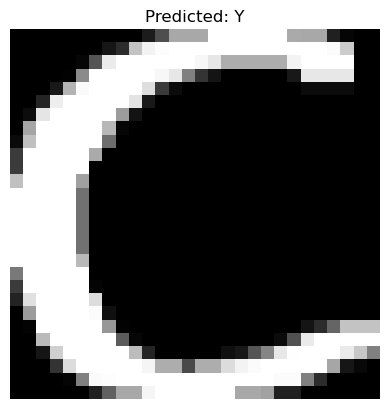

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


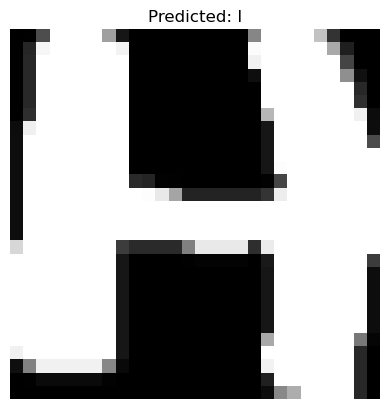

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


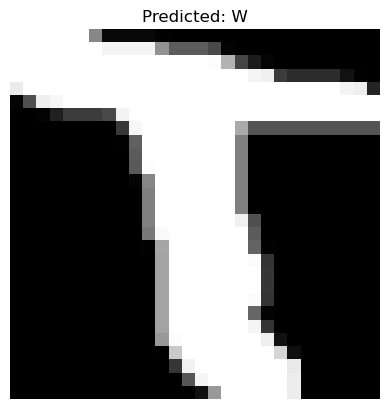

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.92481554 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


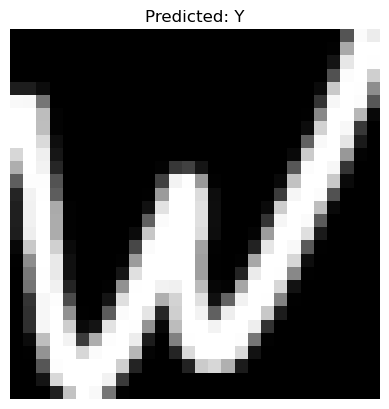

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 4.78595378e-05 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 6.78468721e-01 ... 5.70636241e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


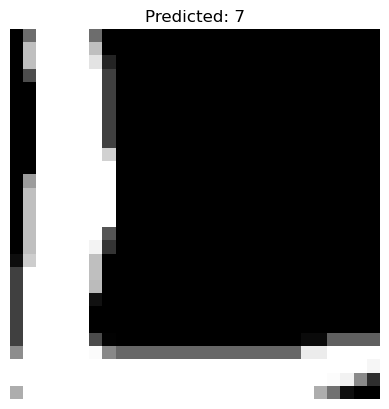

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00039624 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


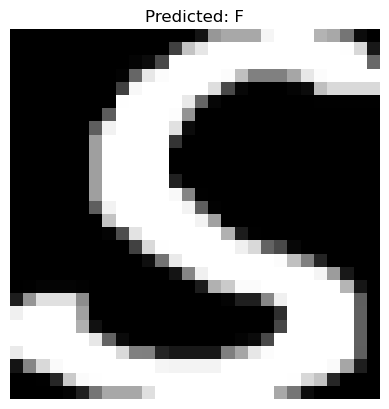

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [0.0000000e+00 0.0000000e+00 2.8726384e-05 ... 1.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


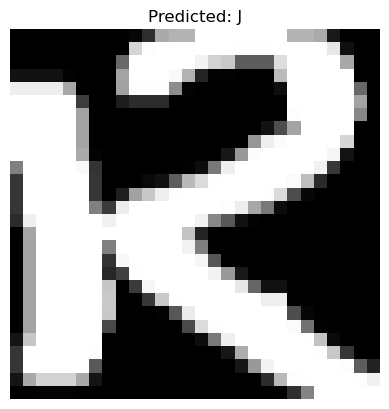

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.00018889 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.01958336 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


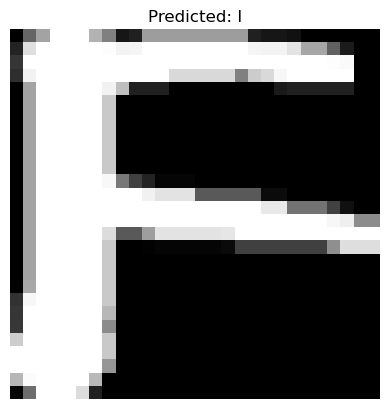

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 3.33300253e-03 ... 7.17275926e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


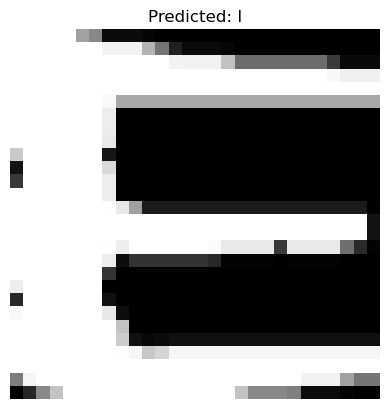

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.11217836 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.62819796 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


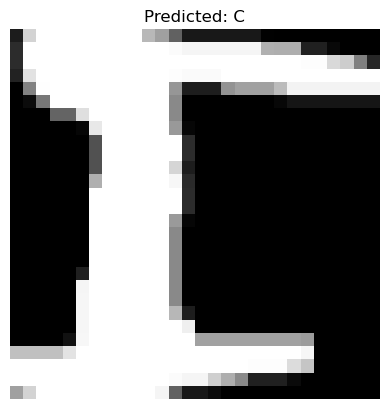

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.00171269 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.61015446 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


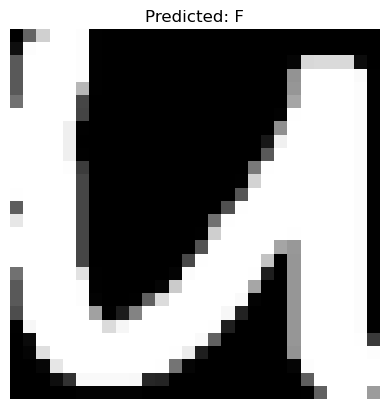

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


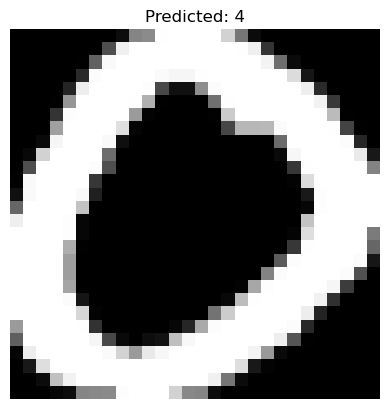

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.44028317 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


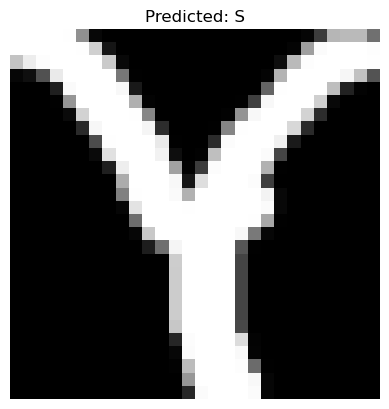

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.76888751 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


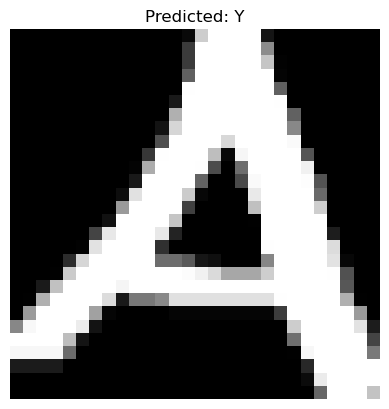

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.78954214 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


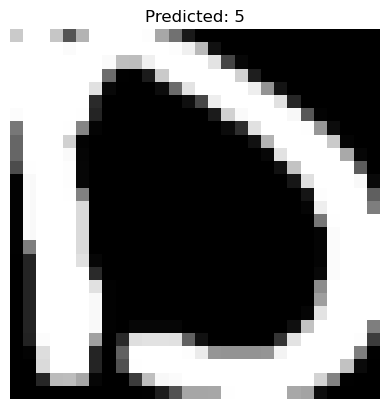

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.84086866 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


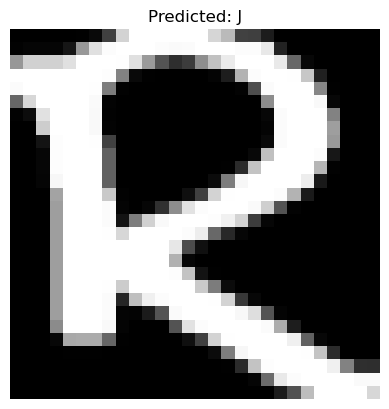

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 8.69921567e-04 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


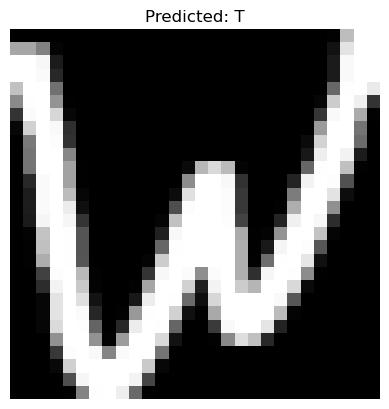

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.0005583 ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 0.02696   0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


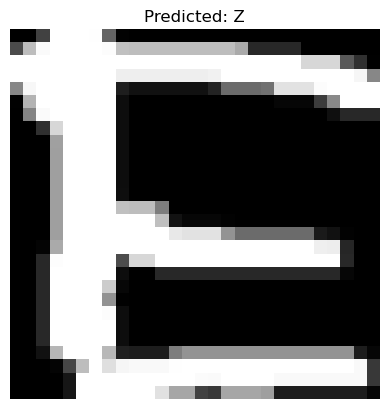

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.38461674 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


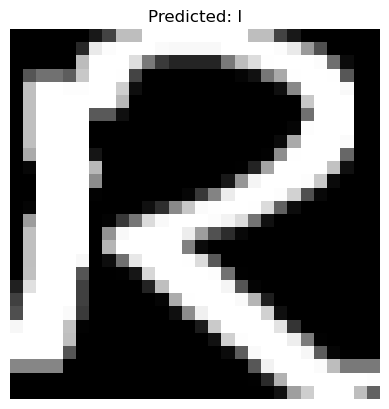

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


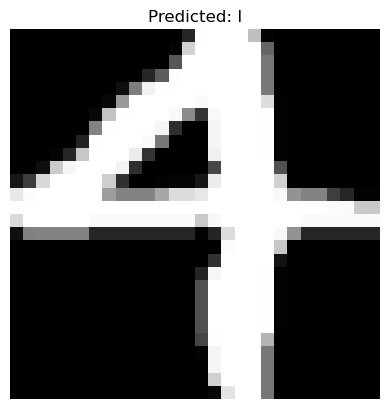

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.08035714 ... 0.08035714 0.         0.        ]
 ...
 [0.         0.         0.08035714 ... 0.08035714 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


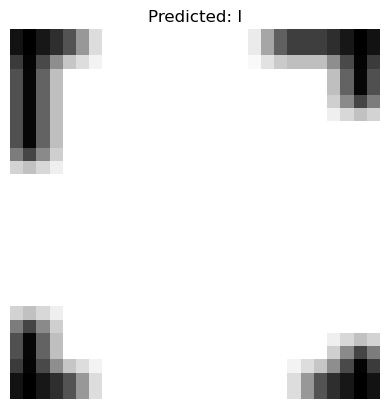

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.5320028 0.        0.       ]
 ...
 [0.        0.        0.5320028 ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


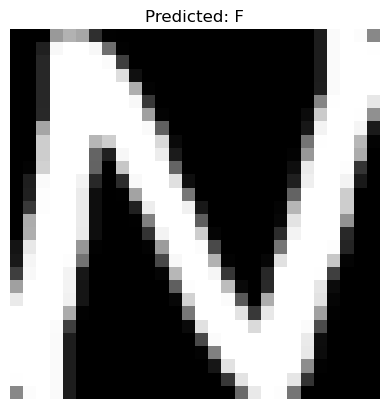

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 9.97118224e-09 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


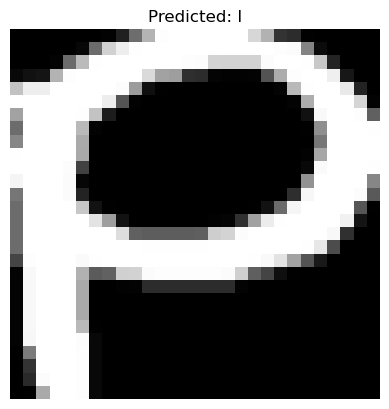

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.76301929 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


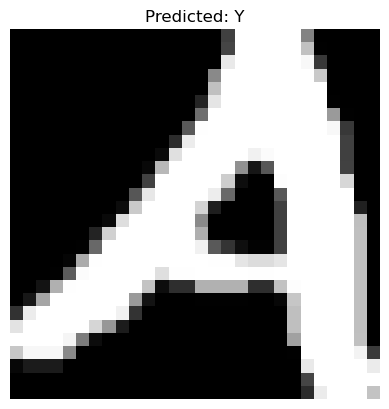

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


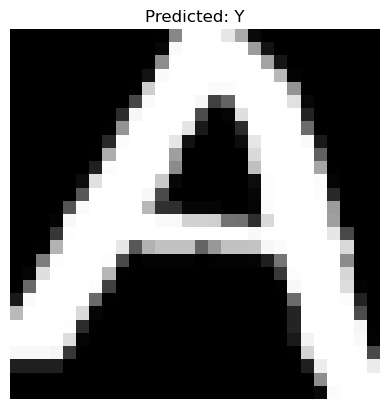

Extracted Text: U7WX4FZM4YWWICOFW7Y47IIIIWCLCJIYISY47YIZCIIWXTTXTCGFUFTIUVIYT4IYZWIFYJ7GM7CTYYICICIEMIVTWFITI744YIWY7FJIICF4SY5JTZIIIFIYY


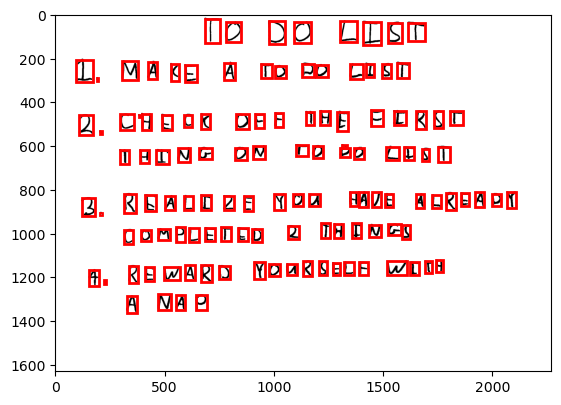


Processing image: 02_letters.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


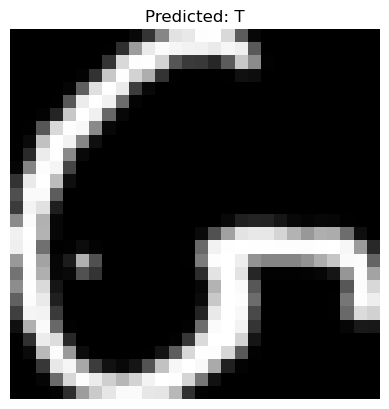

[[0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       1.       ... 0.140625 0.       0.      ]
 ...
 [0.       0.       0.375    ... 1.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]
 [0.       0.       0.       ... 0.       0.       0.      ]]


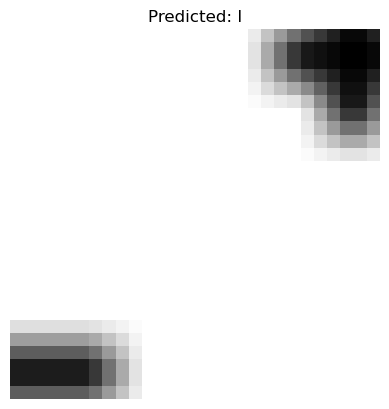

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.16220493 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00428359 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


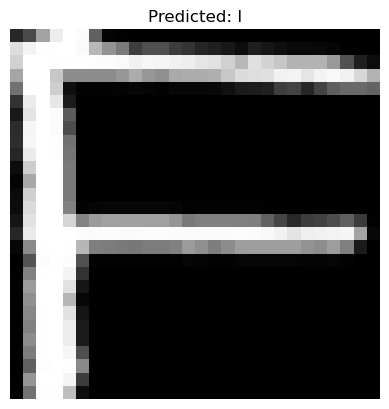

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.27408619 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.66419304 ... 0.00167993 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


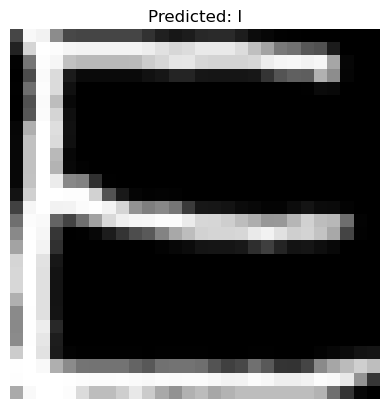

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 9.86022196e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 6.83707529e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


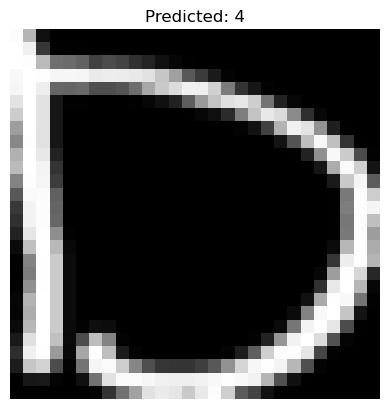

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


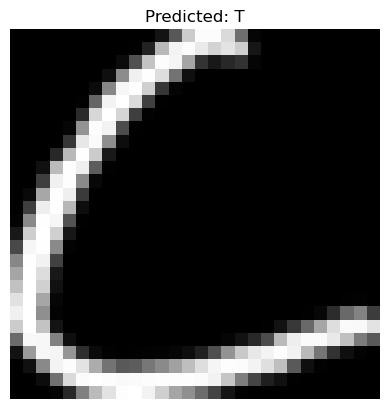

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.00057675 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.08051851 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


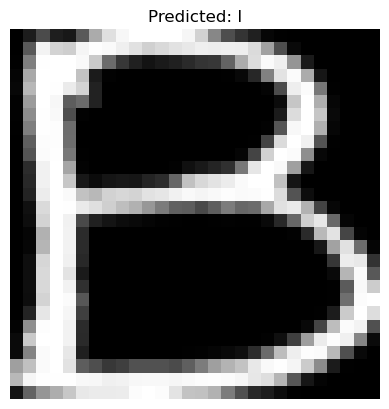

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.02003444 ... 0.85590546 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


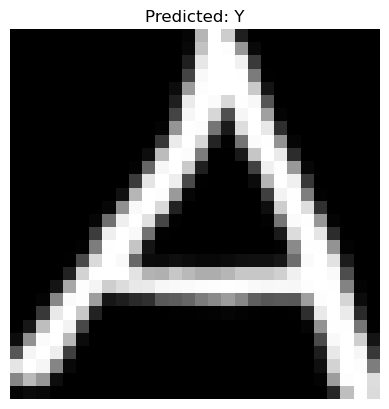

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.36323476 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


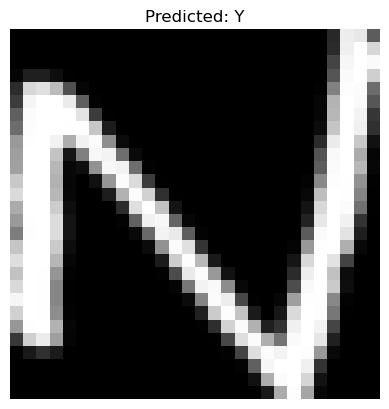

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.76362748e-02
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.45605879e-04 ... 4.27816024e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


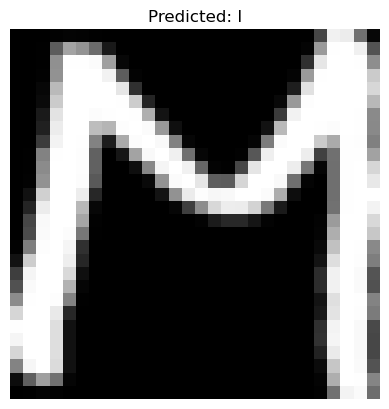

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.00151532 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.98077865 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


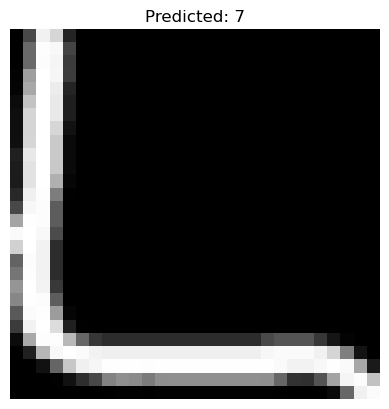

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.91980107 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.01930665 ... 0.24224557 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


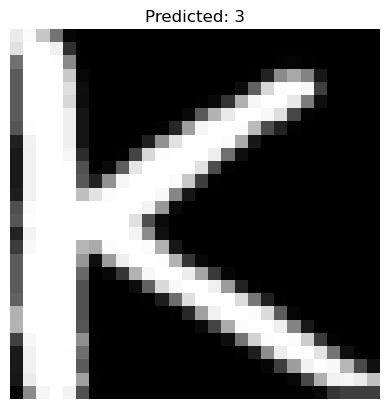

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.77227747 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.0056973  ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


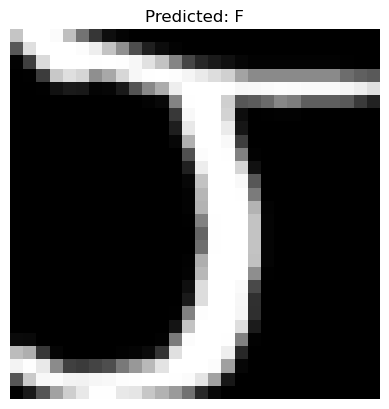

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.15366306e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.59890438e-01 ... 1.50138502e-04
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


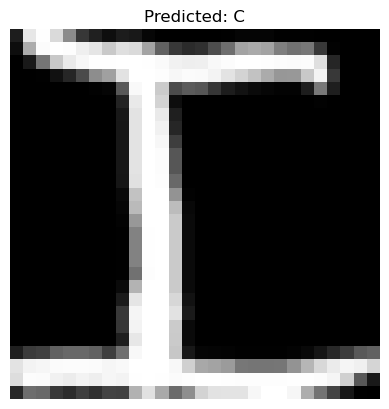

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.31008825e-03 ... 3.25736685e-05
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.71354548e-03 ... 2.59165043e-03
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


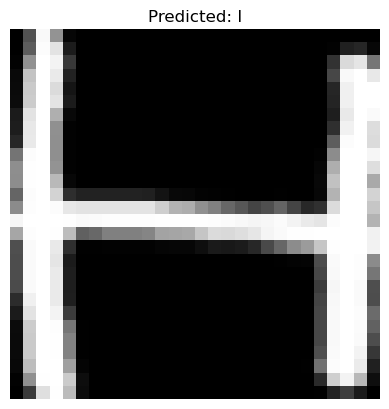

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 9.80047246e-01 ... 1.48723080e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.14856212e-04
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


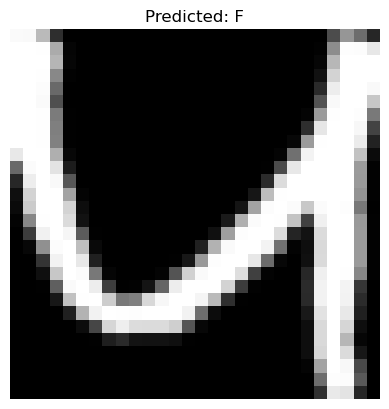

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.00209217 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


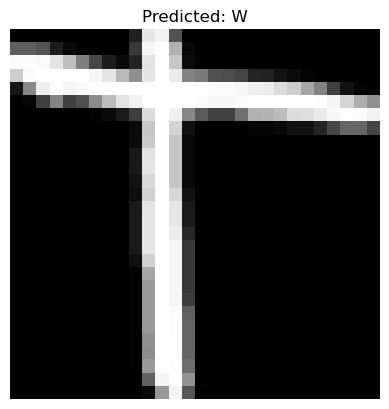

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00010758 0.         0.        ]
 ...
 [0.         0.         0.00116801 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


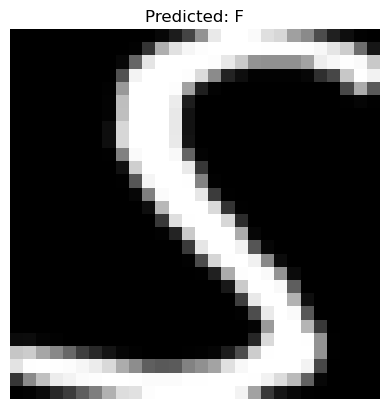

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.73246913 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


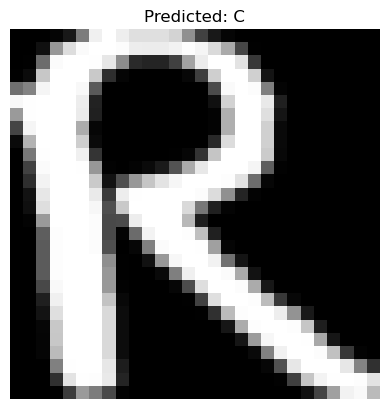

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.97918223 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


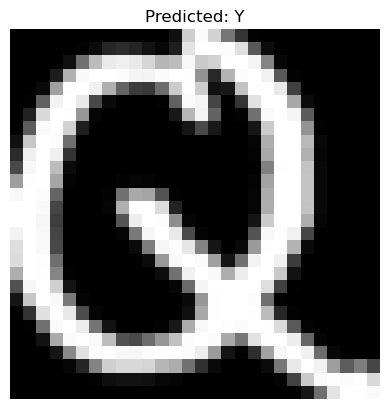

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.29355054e-09
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


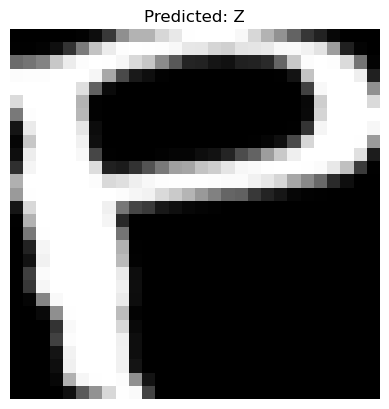

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


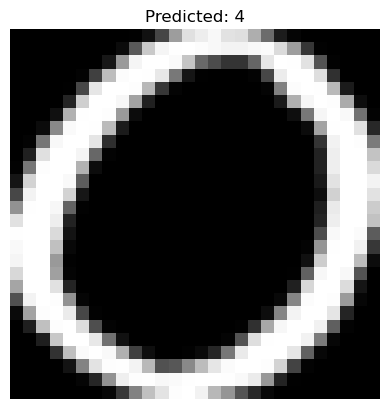

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 9.53045232e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.86180676e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


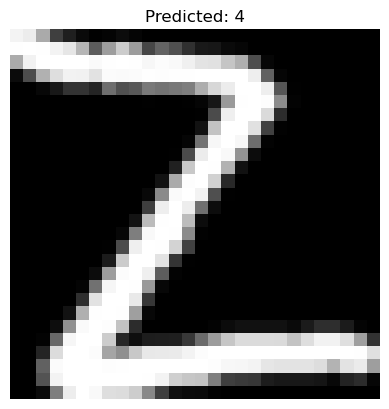

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.51210219 ... 0.86177591 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


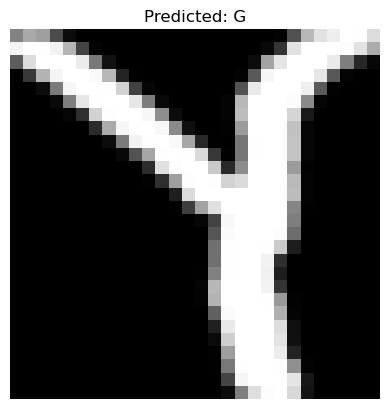

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00170875 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.71362044 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


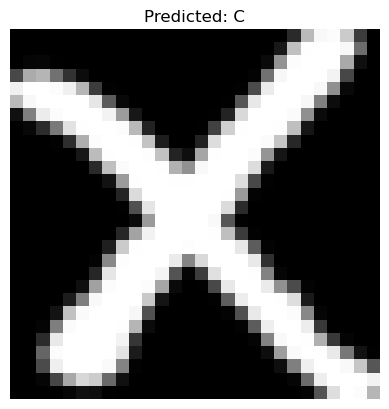

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.1687035 0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


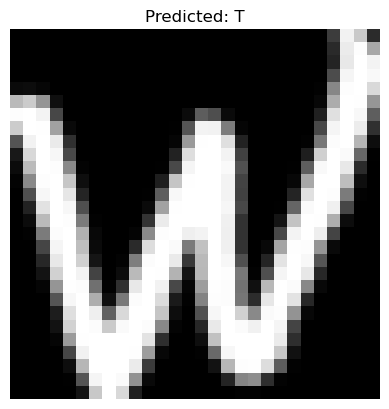

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.59144708 ... 0.22122324 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


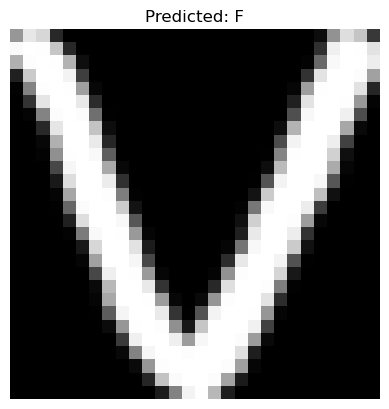

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.28125826e-10
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


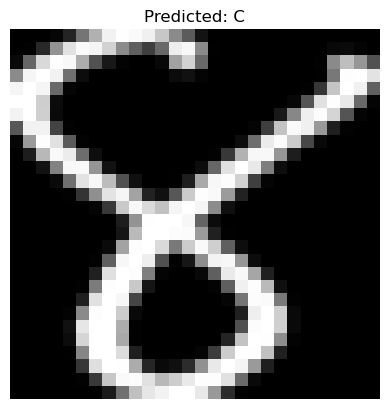

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.07299428e-08 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


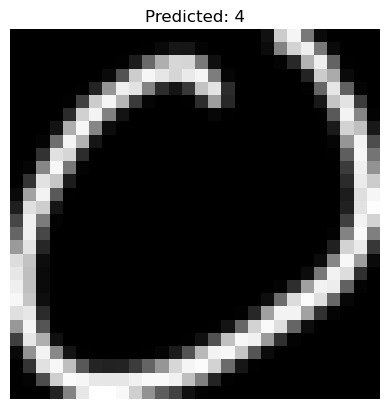

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.74501869 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


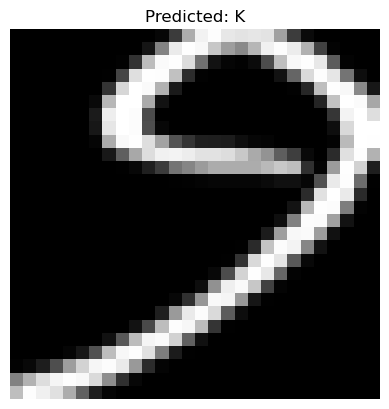

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.69154081 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


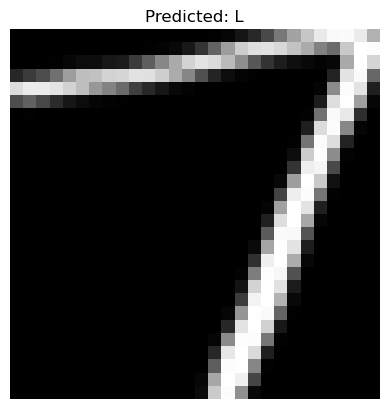

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.14032077e-09 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


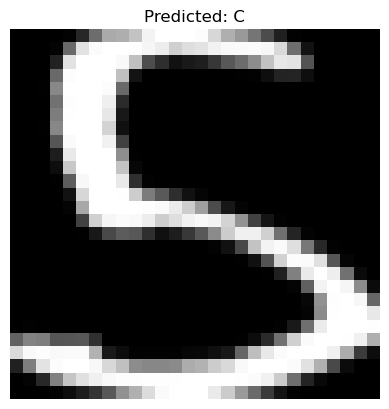

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


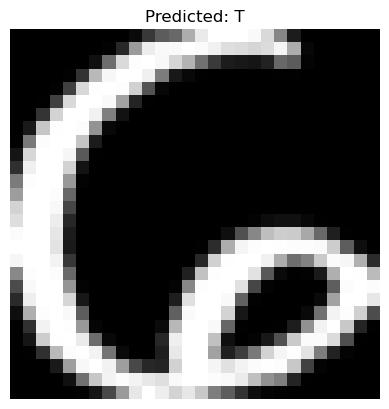

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


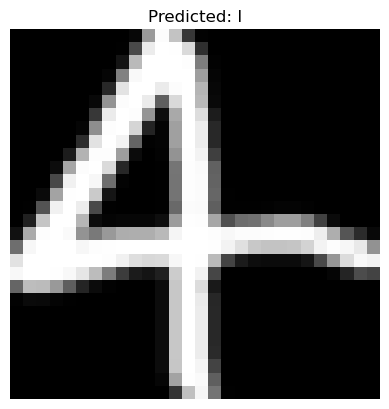

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.01648205 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


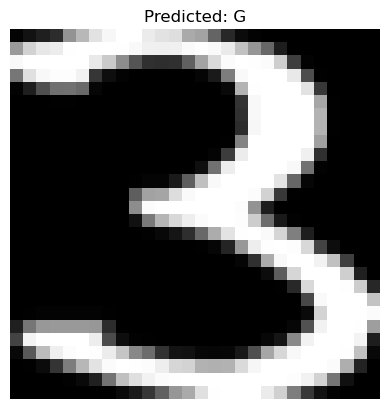

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.98379083 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


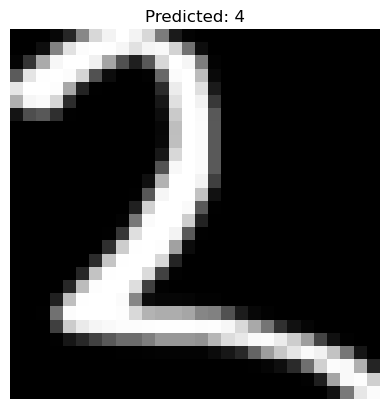

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.9993759  ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.48482141 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


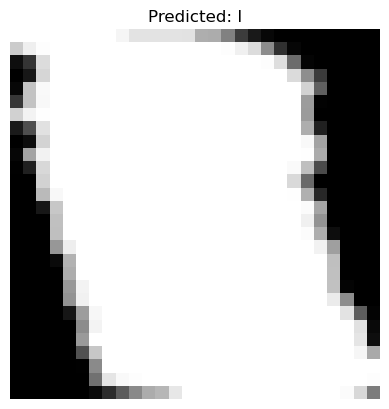

Extracted Text: TIII4TIYYI73FCIFWFCYZ44GCTFC4KLCTIG4I


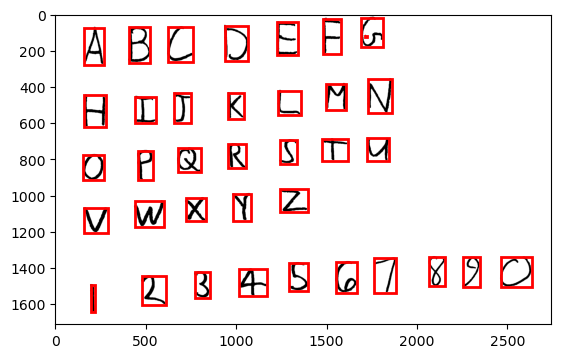


Processing image: 03_haiku.jpg
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.26744223 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.030874   ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


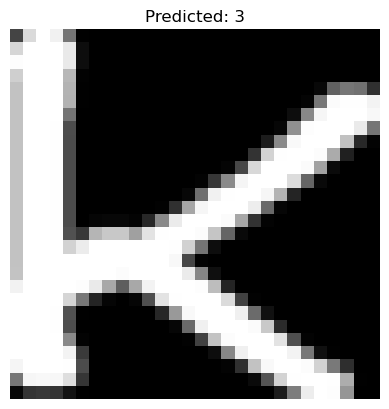

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.90589357e-04
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 7.29072301e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


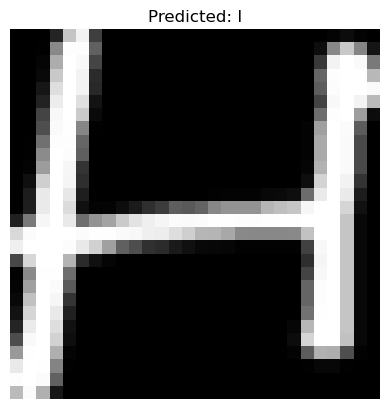

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.47105589 ... 0.00069991 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


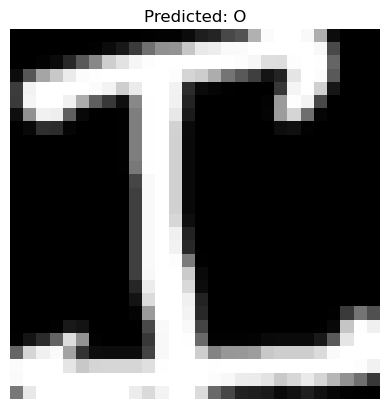

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 8.28754817e-01 ... 4.62120871e-04
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


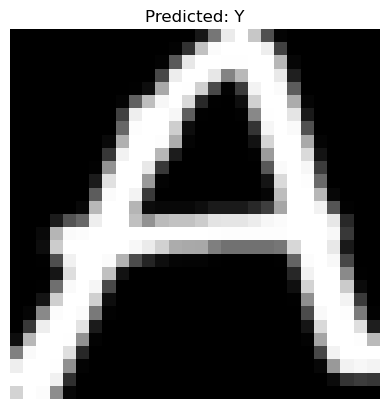

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.99924554 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


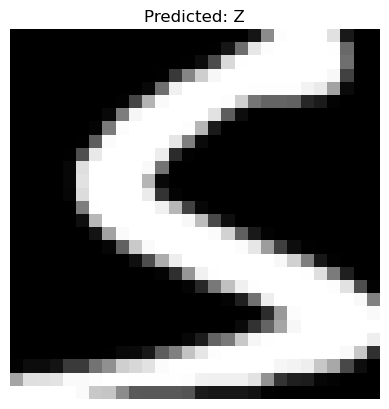

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


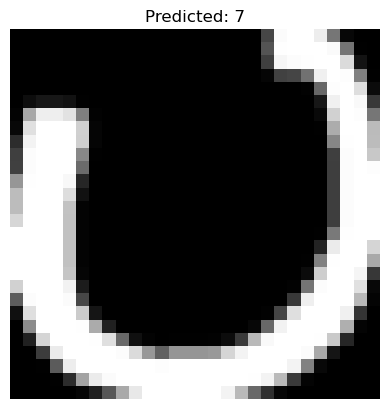

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.15008158e-02 ... 1.97790433e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


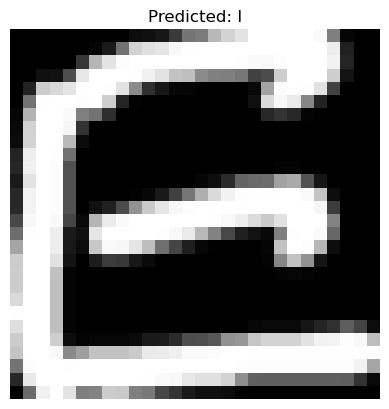

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 7.51167317e-01 ... 1.41881104e-04
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


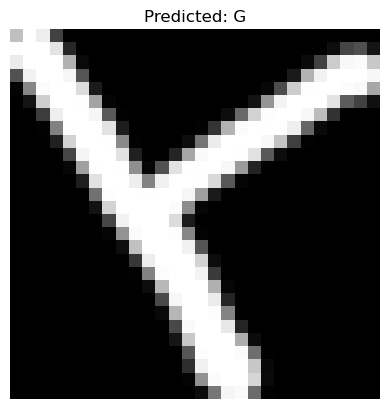

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


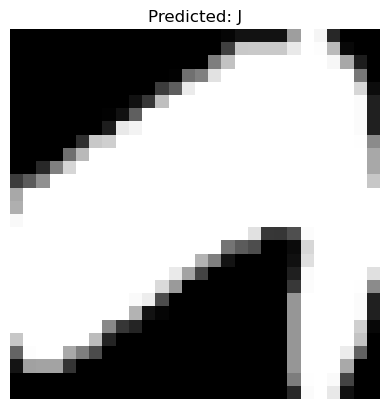

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.42828036 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


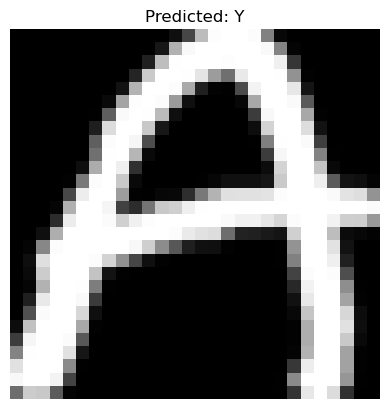

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.03328137 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


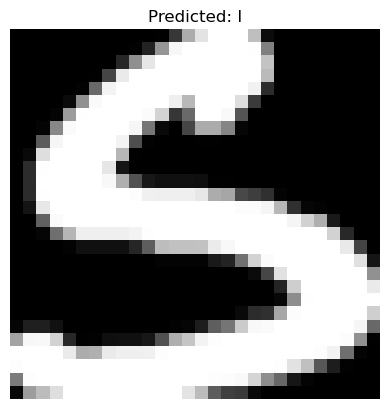

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.49718071e-06
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.11478016e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


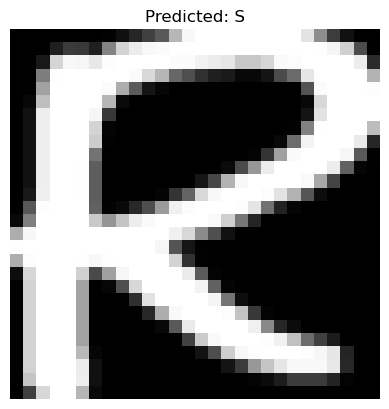

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.01088589 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


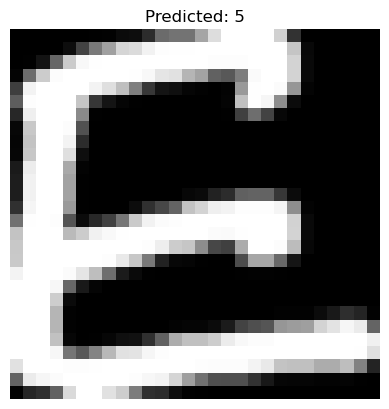

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.69960061 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


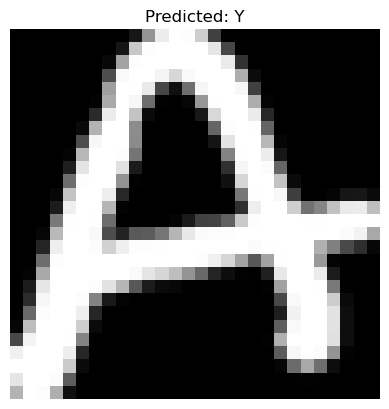

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00480391 ... 0.77631681 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


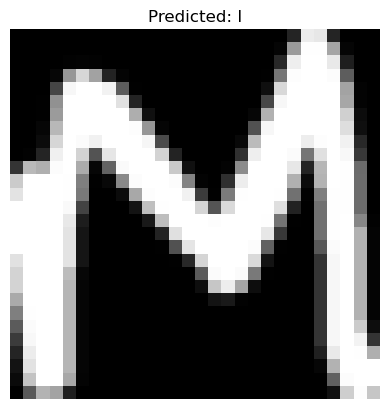

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.33624557e-09
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


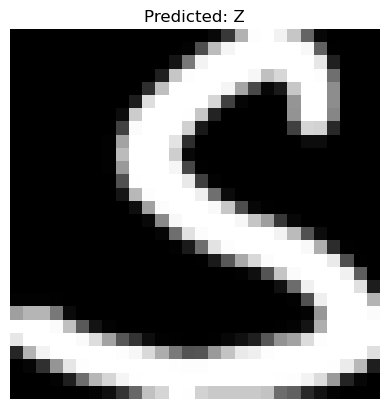

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00044408 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


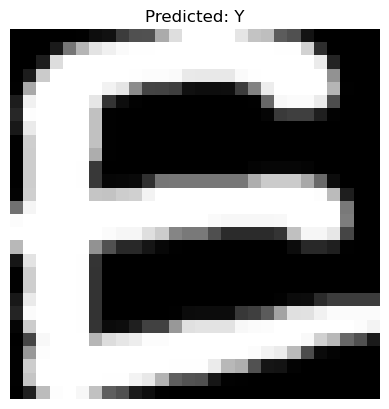

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 8.90273967e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 8.31273547e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


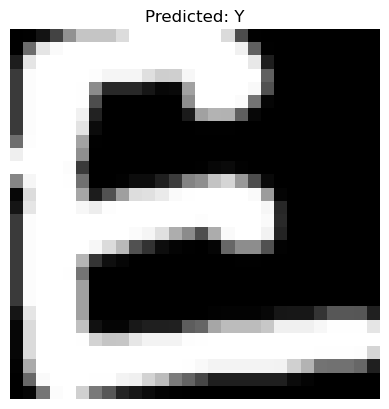

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00015511 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


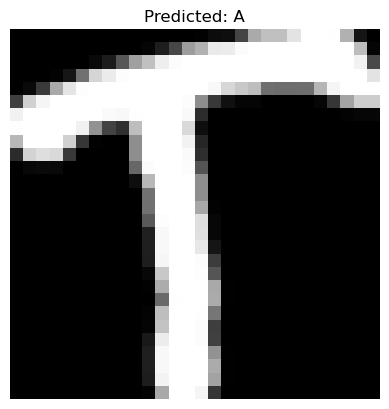

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.60141838 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


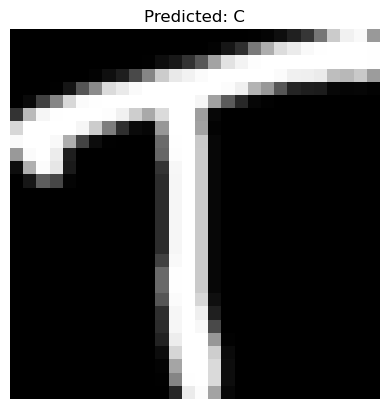

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.11235416 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


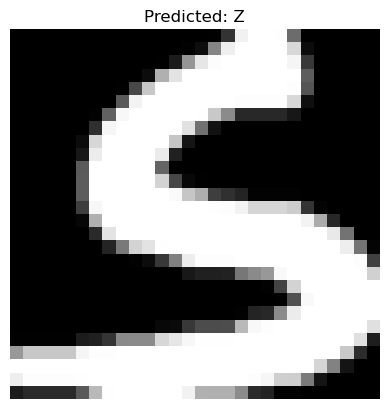

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.1231019 ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


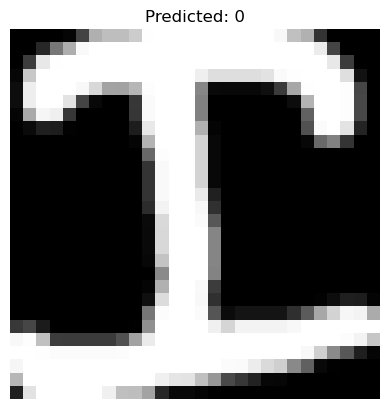

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.678315   ... 0.44067769 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


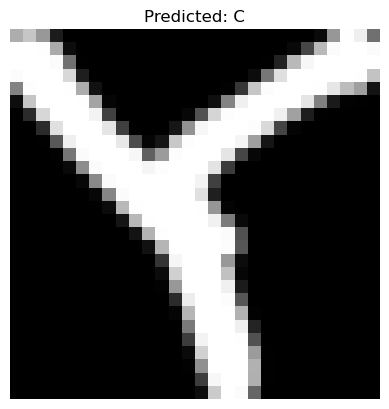

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


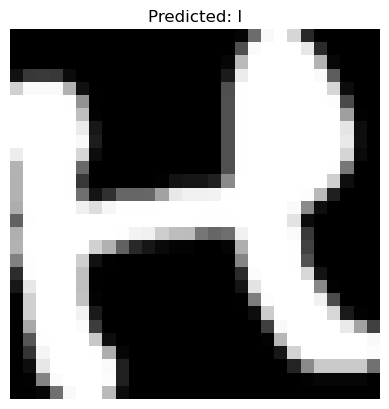

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.99232517e-05 ... 1.18027857e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


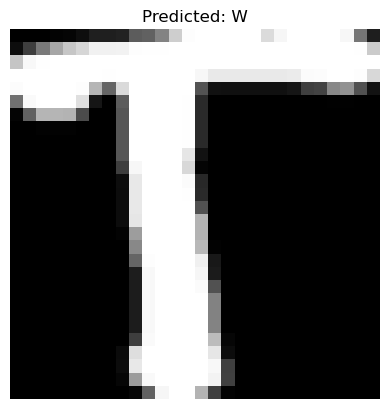

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.99948859e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.33245099e-05 ... 3.44566088e-04
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


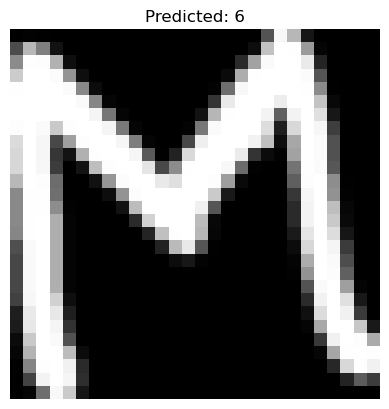

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


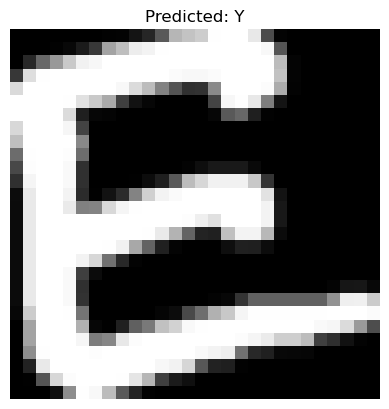

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 7.01510838e-10 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


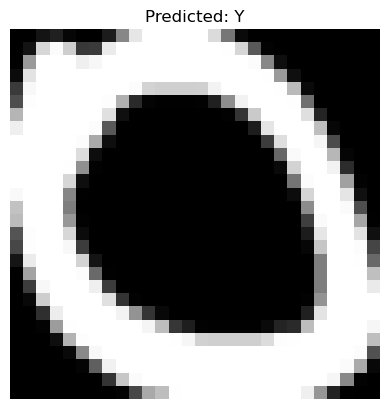

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.42341248e-09 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


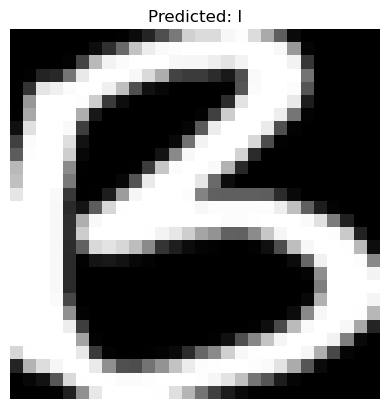

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.20520185e-10
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


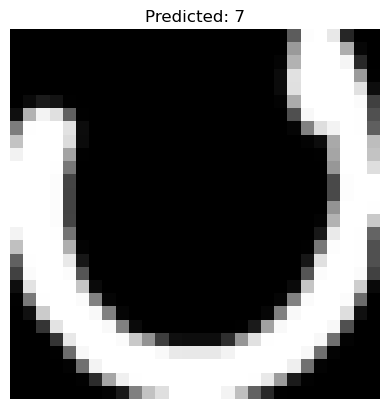

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65478052e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 8.08209179e-02 ... 9.30416979e-07
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


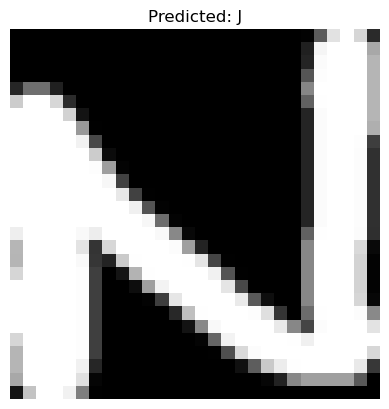

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.90176516 ... 0.01575352 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


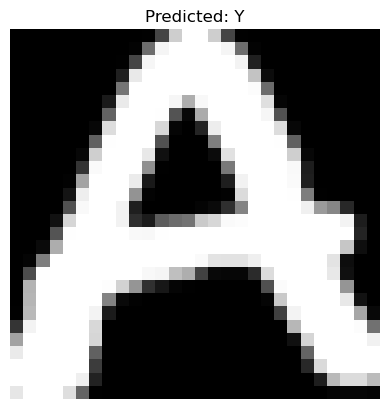

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.37368389e-09 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 3.06527364e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


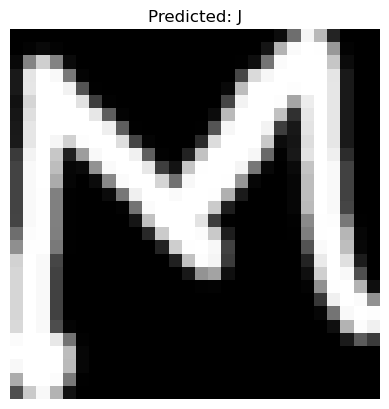

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.13483099e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 2.08411237e-05 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


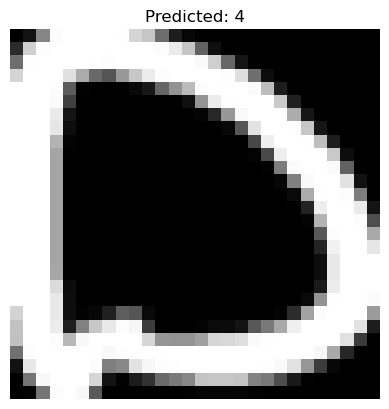

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.3745083 0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


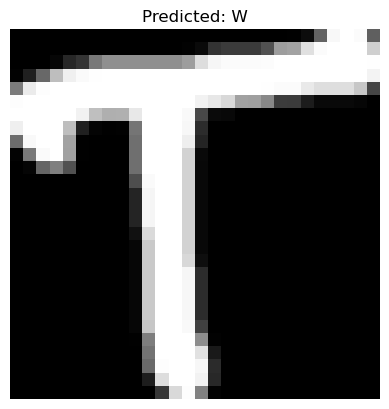

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.05000529 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.64569682 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


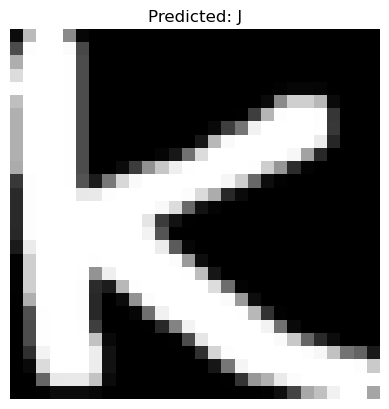

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


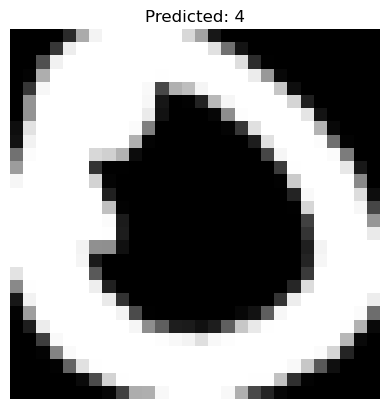

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.99366434e-08 ... 3.00349689e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


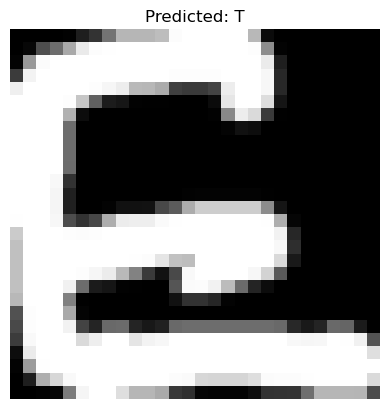

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


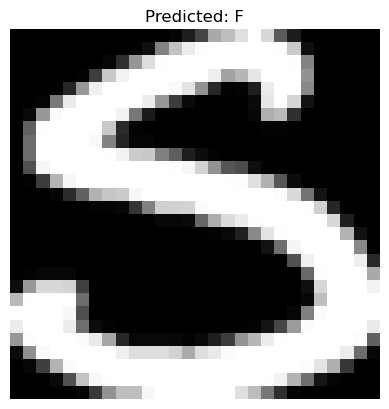

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 4.74380930e-01 ... 3.18018905e-08
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 7.92596337e-04 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


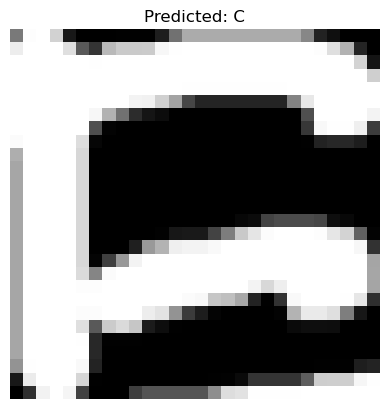

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


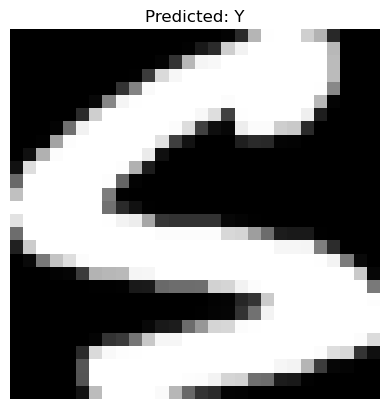

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.95105303 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


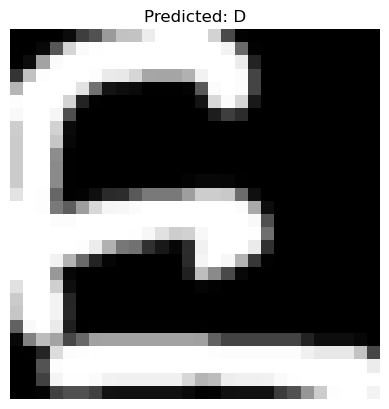

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00030692 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.04734284 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


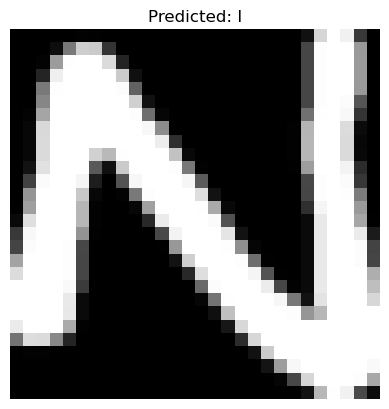

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.69709331 ... 0.00180919 0.         0.        ]
 ...
 [0.         0.         0.69709331 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


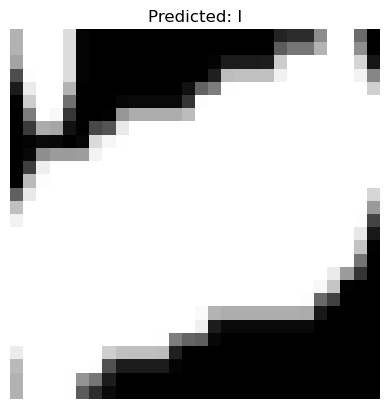

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.22817786 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


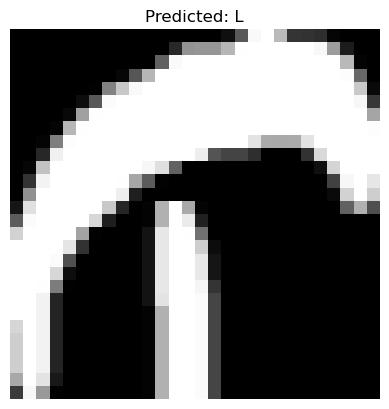

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00497643 ... 0.77509997 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


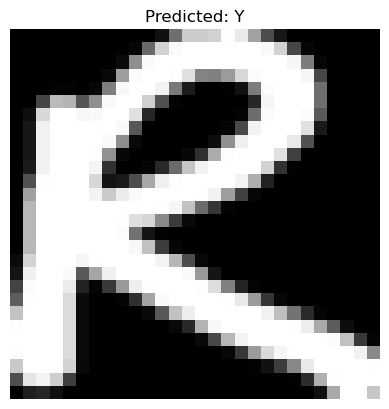

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [0.0000000e+00 0.0000000e+00 3.6551801e-01 ... 7.2390413e-05
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


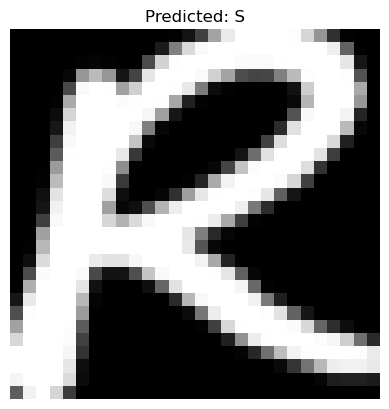

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.66590035e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


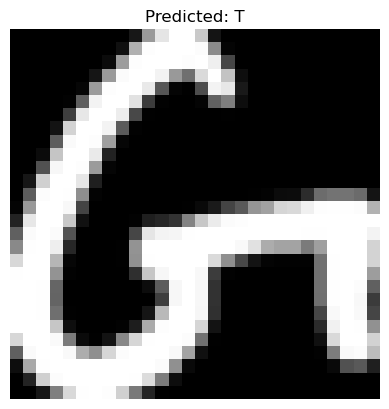

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.76090001 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


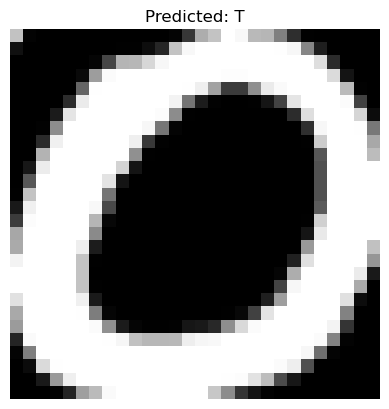

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.04193994 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


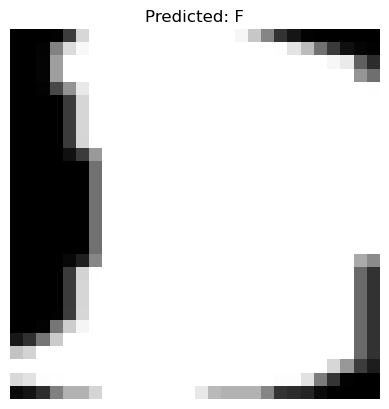

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.00616951 0.         0.        ]
 ...
 [0.         0.         0.00146824 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


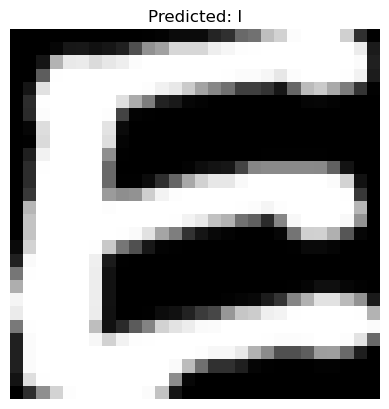

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.00982506 ... 0.00026815 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


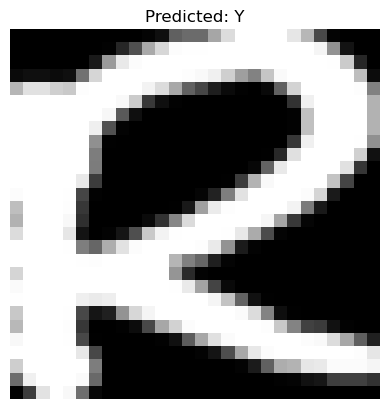

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.65616028e-10 ... 6.59299845e-03
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


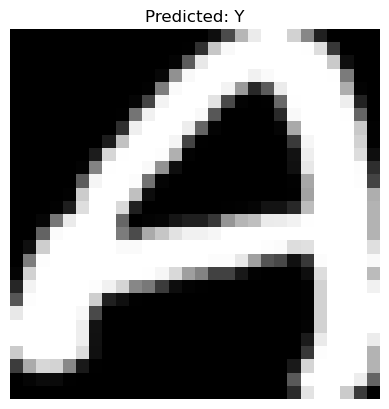

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.45810429e-03
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 6.74909199e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


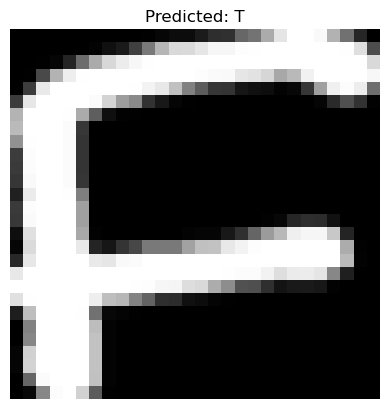

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.26204223e-02 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.99741196e-05 ... 8.12859573e-01
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


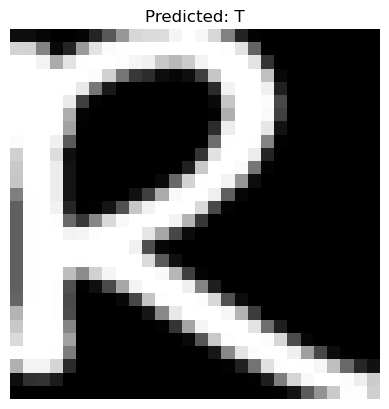

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


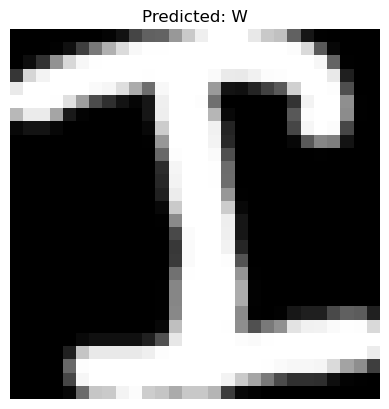

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


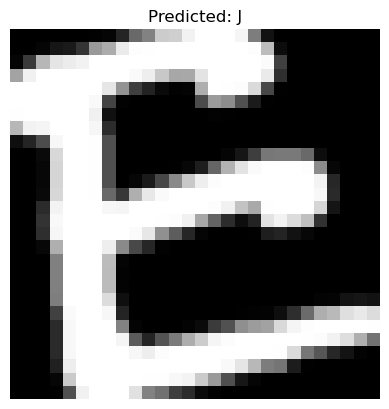

Extracted Text: 3IOYZ7IGJYIS5YIZYYACZ0CIW6YYI7JYJ4WJ4TFCYDIILYSTTFIYYTTWJ


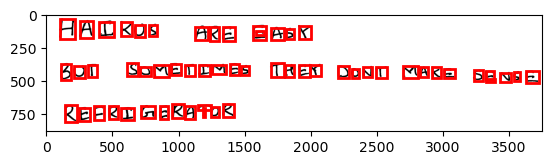


Processing image: 04_deep.jpg
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.06890493 0.         0.        ]
 ...
 [0.         0.         0.00177943 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


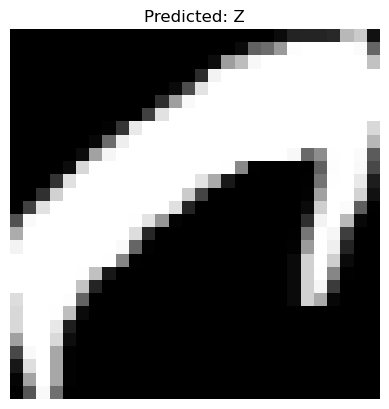

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.32419835e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.39422932e-05 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


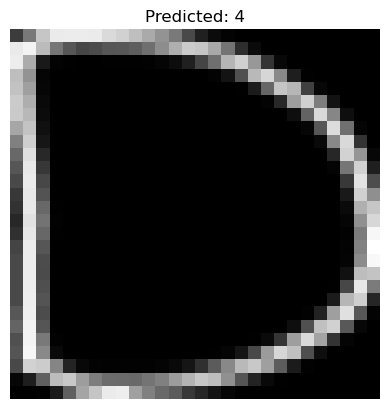

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.71478935 0.         0.        ]
 ...
 [0.         0.         0.2888858  ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


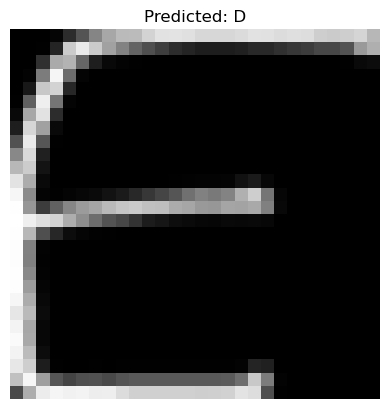

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.05591503 0.         0.        ]
 ...
 [0.         0.         0.81204232 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


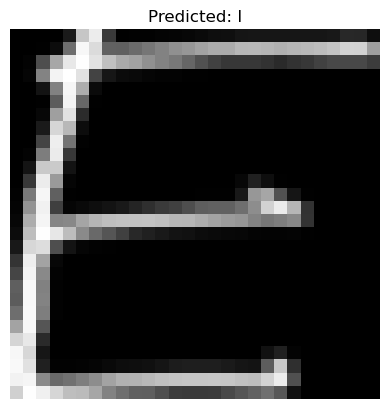

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.57259875e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 8.30701241e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


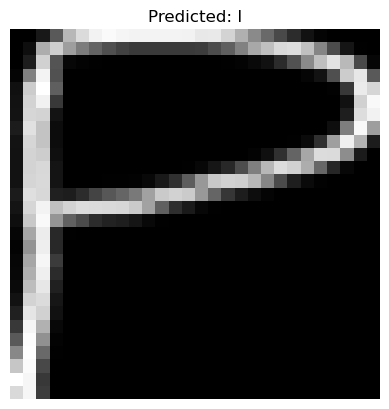

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.04814209 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.24371812 ... 0.82523101 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


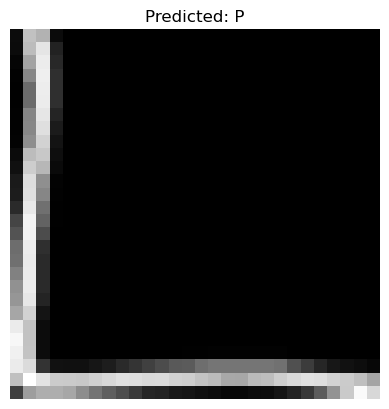

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.07693928 0.         0.        ]
 ...
 [0.         0.         0.00407135 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


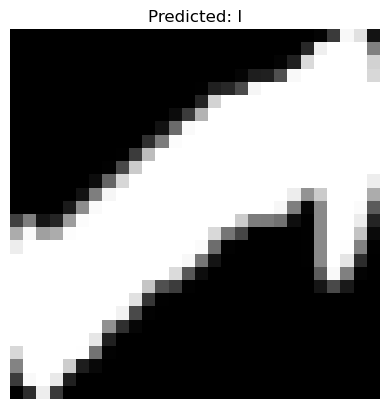

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 0.8168308 0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


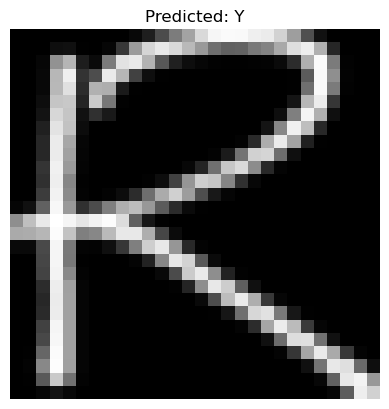

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.92083979 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


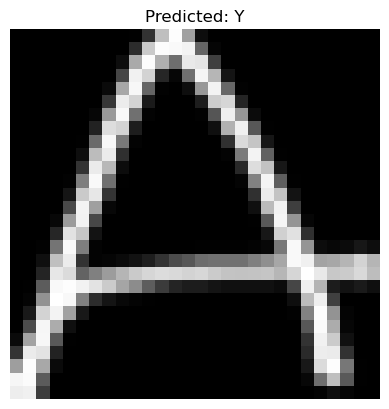

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 9.58626522e-03 ... 7.66949431e-06
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 4.47721811e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


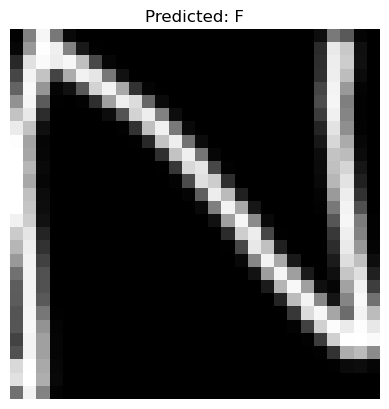

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.00096934 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.01061283 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


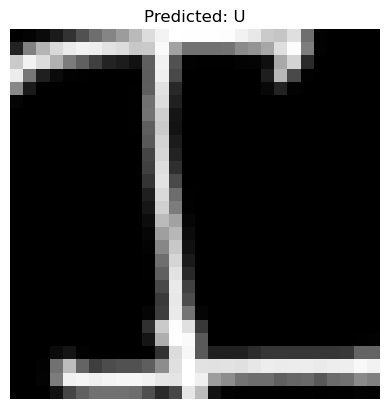

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 9.03298607e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 3.04413633e-03 ... 9.22757965e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


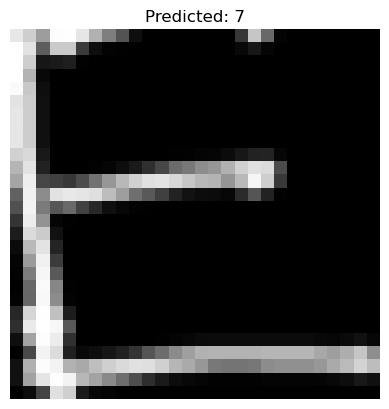

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.71157675 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.09267001 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


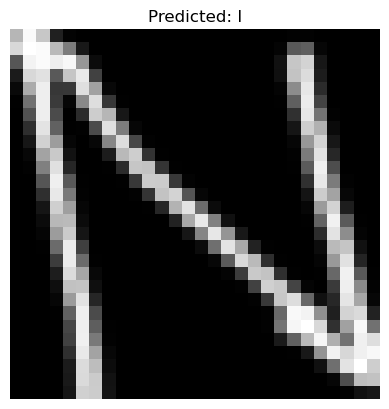

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.96028858 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


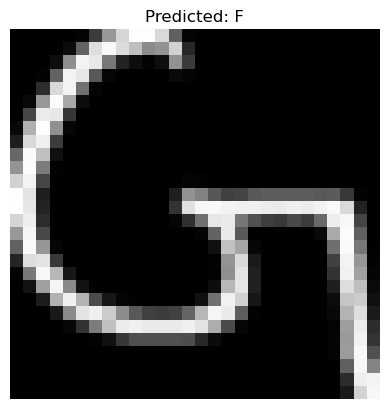

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 8.48268277e-01 ... 3.22311452e-06
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


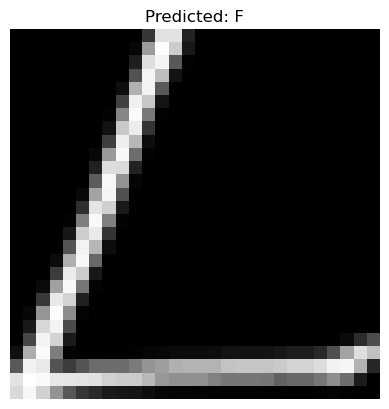

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.16593836 0.         0.        ]
 ...
 [0.         0.         0.84541653 ... 0.00429267 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


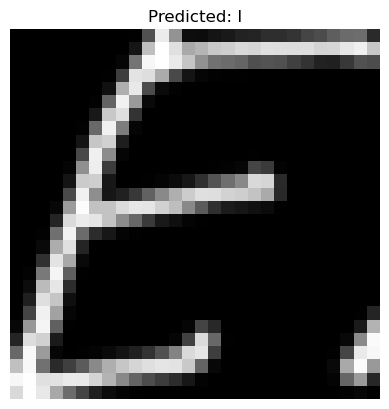

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.78967575 ... 0.0078978  0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


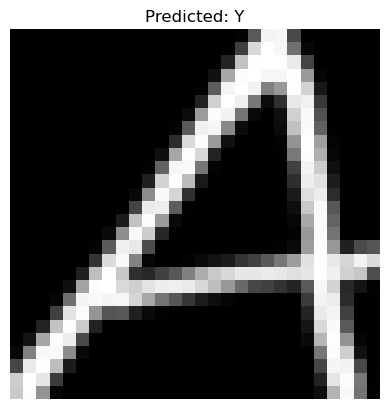

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.16392558 0.         0.        ]
 ...
 [0.         0.         0.68221247 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


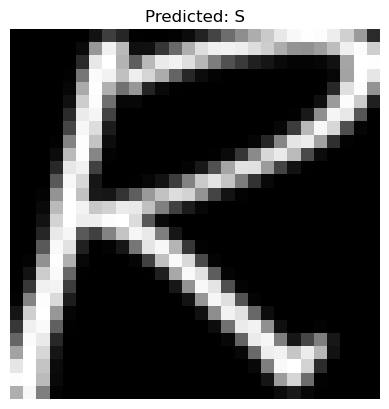

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.89898939 0.         0.        ]
 ...
 [0.         0.         0.88469384 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


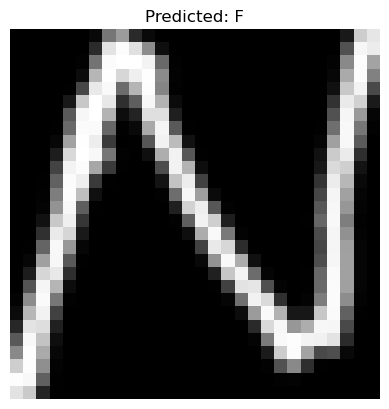

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.78300623 0.         0.        ]
 ...
 [0.         0.         0.40395606 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


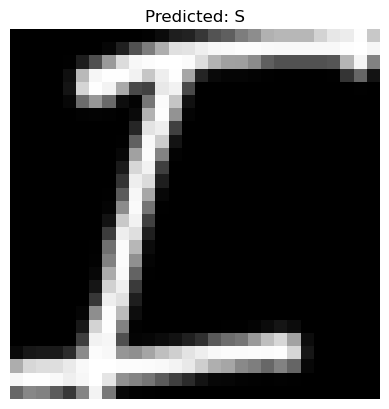

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 1.13504607e-06 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


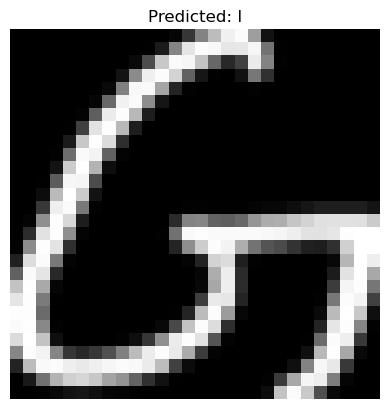

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49064443e-04
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 5.88601423e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


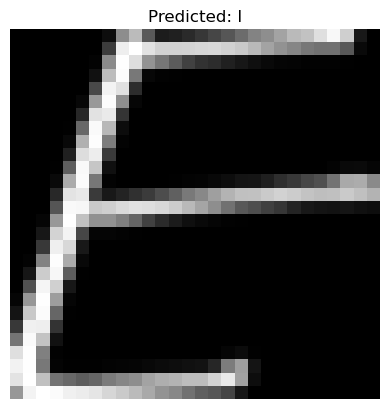

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12668024e-02
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 5.97724192e-01 ... 1.21193831e-09
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


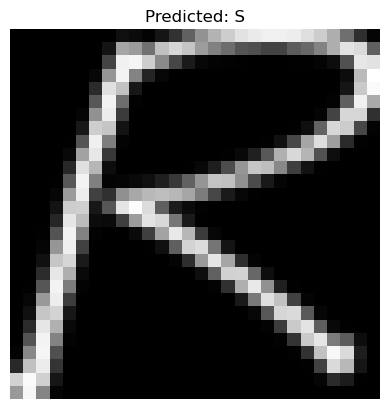

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.89911231 0.         0.        ]
 ...
 [0.         0.         0.43125637 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


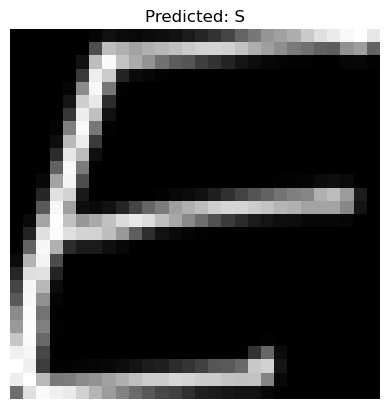

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.89305579 0.         0.        ]
 ...
 [0.         0.         0.85119385 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


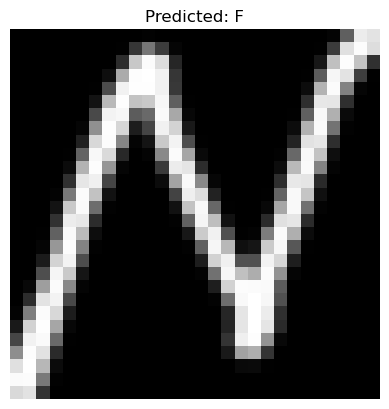

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29798451e-04
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 9.51714798e-01 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


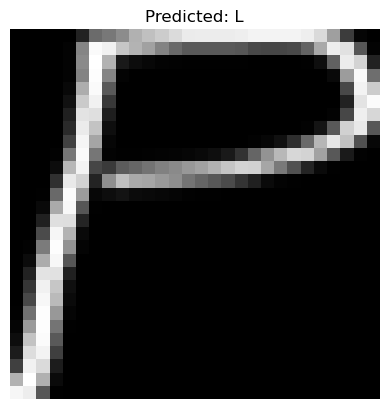

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.41289681 0.         0.        ]
 ...
 [0.         0.         0.86329033 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


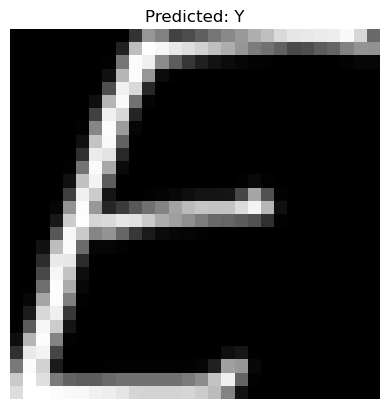

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.36180397 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.02310793 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


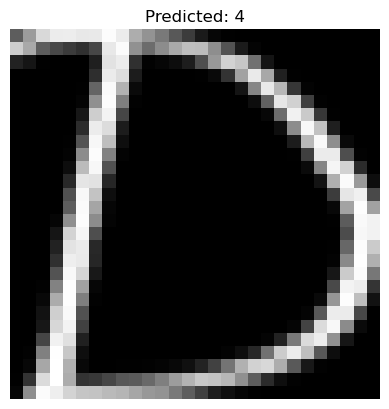

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23915992e-07
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


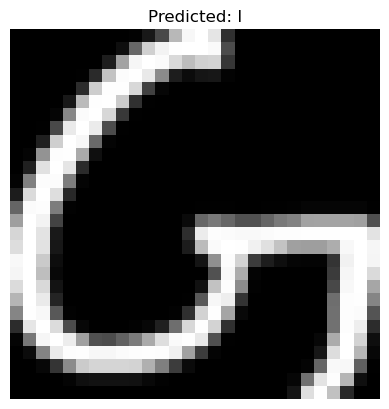

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.83361712 ... 0.01531252 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


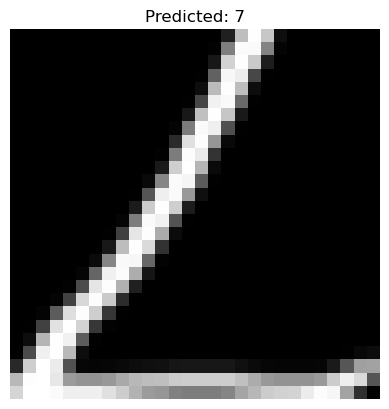

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.7559268  0.         0.        ]
 ...
 [0.         0.         0.60327526 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


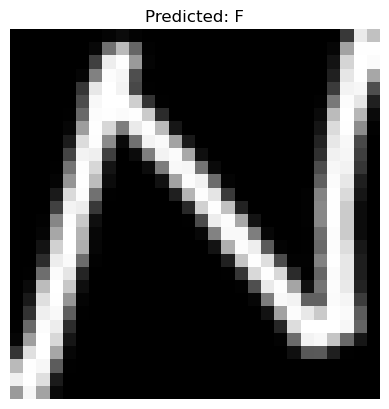

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.90742862e-02
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 7.98825611e-01 ... 6.07223581e-06
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


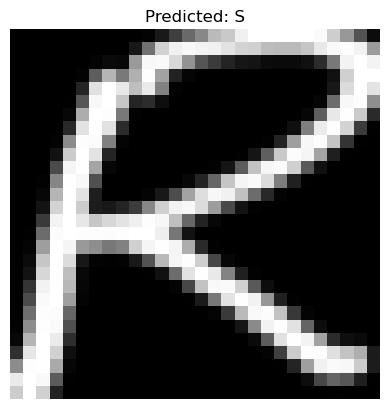

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.83482828 0.         0.        ]
 ...
 [0.         0.         0.91933283 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


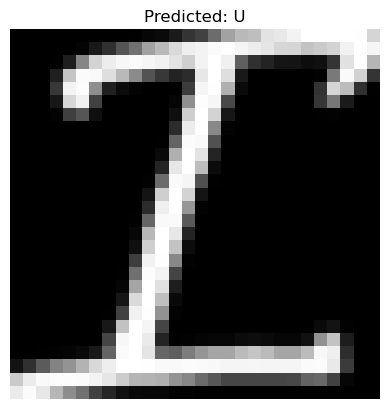

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.13909969e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.44644725e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


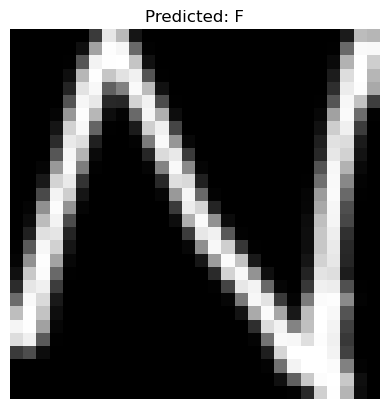

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.18069262 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


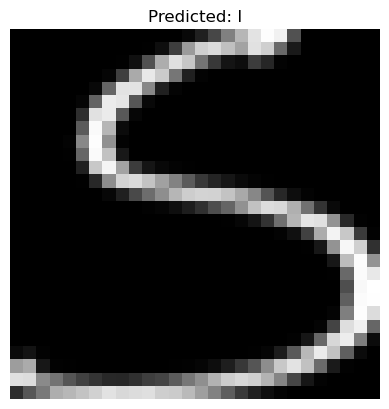

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.46658708e-08 ... 8.99262705e-01
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


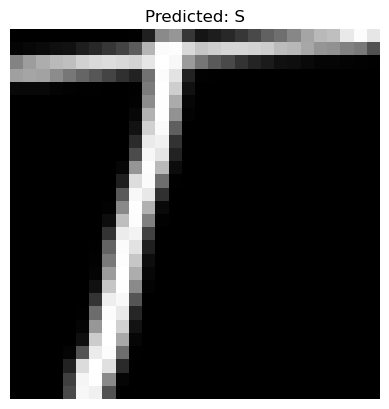

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 9.45158272e-01 ... 4.21428906e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


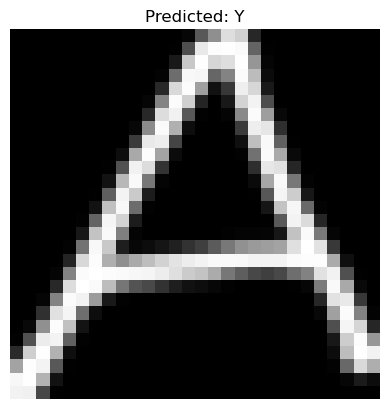

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.7312856  0.         0.        ]
 ...
 [0.         0.         0.20275052 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


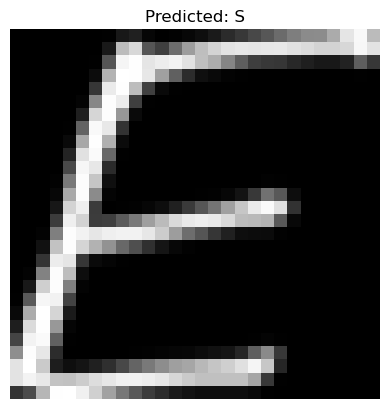

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.84010724 0.         0.        ]
 ...
 [0.         0.         0.92139767 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


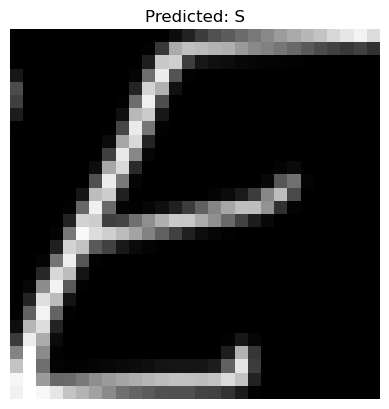

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.03488298 0.         0.        ]
 ...
 [0.         0.         0.97546661 ... 0.09067072 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


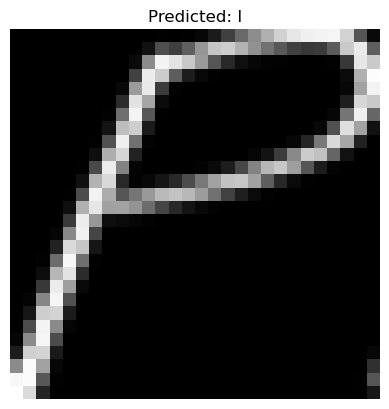

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.63034584 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


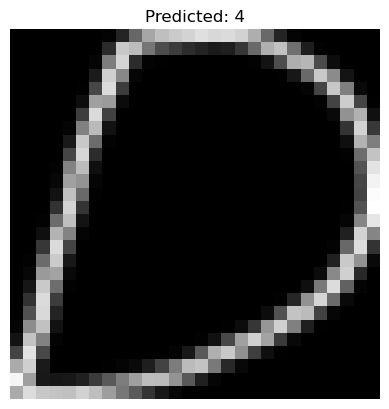

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.03526868 0.         0.        ]
 ...
 [0.         0.         0.73369656 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


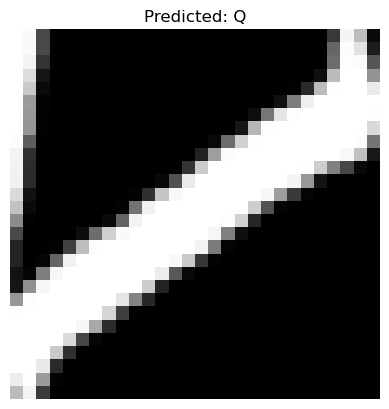

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.74916456 0.         0.        ]
 ...
 [0.         0.         0.69881864 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


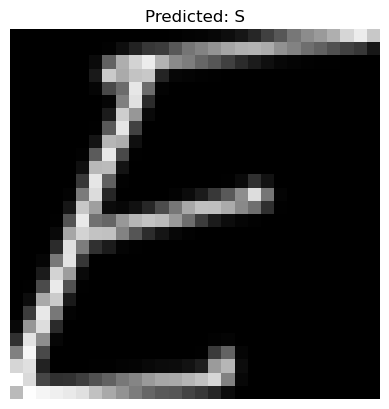

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.88611414 0.         0.        ]
 ...
 [0.         0.         0.94295025 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


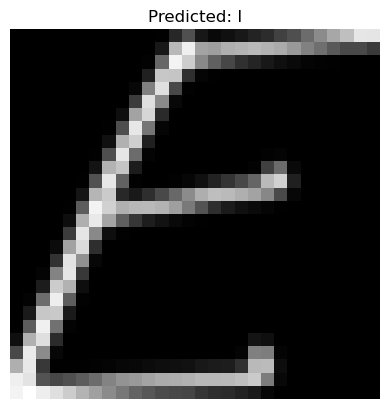

Extracted Text: Z4DIIPIYYFU7IFFIYSFSIISSFLY4I7FSUFISYSSI4QSI


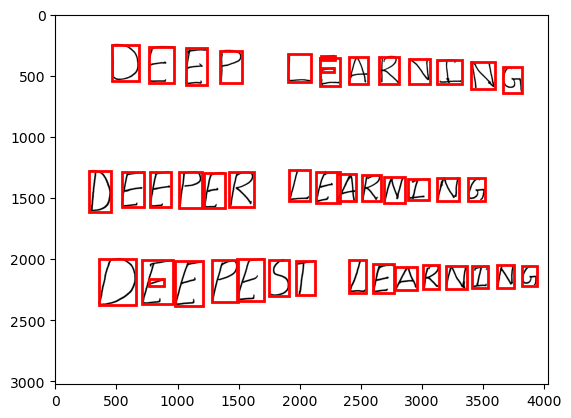

In [39]:
############################## Q 5.4 ##############################
import os
import numpy as np
import skimage.io
import skimage.transform
import skimage.morphology
import skimage.color
import pickle
import string
import matplotlib.pyplot as plt

# Neural network letters mapping (uppercase and digits)
letters = np.array([_ for _ in string.ascii_uppercase[:26]] + [str(_) for _ in range(10)])
print(letters)
# Load pre-trained weights
params = pickle.load(open('/Users/shrinivas/workspace/16-720/HW4/content/q3_weights.pickle', 'rb'))

def softmax(x):
    """
    Compute the softmax of input x.
    Works for both 1D and 2D arrays.
    Args:
        x (np.ndarray): Input array.
    Returns:
        np.ndarray: Softmax probabilities.
    """
    if x.ndim == 1:  # Handle 1D input
        x_shifted = x - np.max(x)  # Subtract max for numerical stability
        exp_x = np.exp(x_shifted)
        return exp_x / np.sum(exp_x)
    elif x.ndim == 2:  # Handle 2D input
        x_shifted = x - np.max(x, axis=1, keepdims=True)
        exp_x = np.exp(x_shifted)
        return exp_x / np.sum(exp_x, axis=1, keepdims=True)
    else:
        raise ValueError("Input to softmax must be a 1D or 2D array.")

def run_neural_network(input_image, params):
    """
    Run the Q3-defined neural network on the input image using pre-trained parameters.
    Args:
        input_image (np.ndarray): Flattened image input (1D array).
        params (dict): Neural network parameters (weights and biases).
    Returns:
        np.ndarray: Probability distribution across the classes.
    """
    # Forward pass for the neural network
    h1 = forward(input_image, params, 'layer1', sigmoid)  # Use layer1 weights with sigmoid activation
    probs = forward(h1, params, 'output', softmax)       # Use output layer weights with softmax activation
    return probs

# Iterate through images
for imgno, img in enumerate(sorted(os.listdir('/Users/shrinivas/workspace/16-720/HW4/content/images'))):
    im1 = skimage.img_as_float(skimage.io.imread(os.path.join('/Users/shrinivas/workspace/16-720/HW4/content/images', img)))
    bboxes, bw = findLetters(im1)  # Extract bounding boxes and binary image

    print('\nProcessing image:', img)

    # Find and sort rows of bounding boxes
    centers = np.array([(y1 + y2) / 2 for y1, _, y2, _ in bboxes])
    sorted_indices = np.argsort(centers)
    bboxes = [bboxes[i] for i in sorted_indices]  # Sort by y-center
    extracted_text = ""

    for bbox in bboxes:
        y1, x1, y2, x2 = bbox

        # Crop the bounding box
        cropped = bw[y1:y2, x1:x2]

        # Invert the color: Make characters black and background white
        inverted = cropped

        # Preprocess: Resize to 28x28, Pad, Transpose, Flatten
        resized = skimage.transform.resize(inverted, (28, 28), anti_aliasing=True)  # Resize to match NN input
        padded = np.pad(resized, ((2, 2), (2, 2)), mode='constant', constant_values=0)  # Pad to ensure uniformity
        print(padded)
        processed = padded.T.flatten()  # Flatten after transposing for consistency with training data

        # Classify the character using the Q3 neural network
        char_probabilities = run_neural_network(processed, params)
        char_idx = np.argmax(char_probabilities)
        predicted_char = letters[char_idx]
        extracted_text += predicted_char

        # Plot the cropped character and print the prediction
        plt.imshow(resized, cmap="gray")
        plt.title(f"Predicted: {predicted_char}")
        plt.axis("off")
        plt.show()

    # Print the extracted text for the entire image
    print("Extracted Text:", extracted_text)

    # Visualization of the binary image with bounding boxes
    plt.imshow(1 - bw, cmap="gray")  # Reverse colors for better visualization
    for bbox in bboxes:
        y1, x1, y2, x2 = bbox
        plt.gca().add_patch(
            plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', fill=False, linewidth=2)
        )
    plt.show()

---

YOUR ANSWER HERE... (if your code ignores spaces)

---